# Implementing a Physics Informed Neural Network using functorch and comparing it to a regular Neural Network

In [1]:
#importing
import torch
import torch.nn as nn
import torchopt

from functorch import make_functional,  vmap, jacrev

import matplotlib.pyplot as plt
import plotly.express as px
import plotly.graph_objects as go

import pandas as pd
import numpy as np

NOTE: Redirects are currently not supported in Windows or MacOs.


## Time series prediction

### Loading the data

In [2]:
# train data
X = pd.read_csv('../Data/NN data/nn_train_mei_17-26.csv')
X.drop(columns=["Unnamed: 0",  "Water-1", "Water-2", "Water-3"], inplace=True)
X_input = X[['t', 'x', 'y', 'Hot gas pipe', 'Liquid pipe', 'Suction pipe', 'Door', 'Fridge', 'Environment', 'Energy']]
X_output = X[['u']]

# convert to Tensor
X_input = torch.tensor(X_input.values, dtype=torch.float64, requires_grad=True)
X_output = torch.tensor(X_output.values, dtype=torch.float64, requires_grad=True)

In [3]:
# test data
Y = pd.read_csv('../Data/NN data/nn_test_mei_17-26.csv')
Y.drop(columns=["Unnamed: 0", "Water-1", "Water-2", "Water-3"], inplace=True)
Y_input = Y[['t', 'x', 'y', 'Hot gas pipe', 'Liquid pipe', 'Suction pipe', 'Door', 'Fridge', 'Environment', 'Energy']]
Y_output = Y[['u']]

# convert to Tensor
Y_input = torch.tensor(Y_input.values, dtype=torch.float64, requires_grad=True)
Y_output = torch.tensor(Y_output.values, dtype=torch.float64, requires_grad=True)

###  Hyper parameters

In [4]:
# both models
NUM_ITER = 500  # maximum number of iterations
LEARNING_RATE = 0.01  # learning rate
ACT = nn.ReLU() # activation function
DIM_HIDDEN = 64 # dimension of hidden layers

# pinn specific
C = 1 # thermal diffusivity coefficient
BATCH_SIZE = 300 # batch size of the samples
SAMPLE_INTERVAL = 10 # how often the samples are renewed 
ALPHA = 100 # ratio between data and physics
BETA = 100 # ratio between heat and boundary


### Architecture NN

In [5]:
class NN(nn.Module):
    def __init__(
        self,
        input_size: int = 1,
        output_size: int = 1,
        dim_hidden: int = 1,
        act: nn.Module = nn.ReLU(),
    ) -> None:
        """Simple neural network with linear layers and non-linear activation function
        This class is used as universal function approximator for the solution of
        partial differential equations using PINNs
        Args:
            num_inputs (int, optional): The number of input dimensions
            num_outputs (int, optional): The number of outputs of the model, in general is 1
            dim_hidden (int, optional): The number of neurons for each hidden layer
            act (nn.Module, optional): The type of non-linear activation function to be used
        """
        super().__init__()

        self.model = nn.Sequential(
            nn.Linear(input_size, dim_hidden),
            act,
            nn.Linear(dim_hidden, dim_hidden),
            act,
            nn.Linear(dim_hidden, output_size)
        )

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        return self.model(x)

### PINN (defining and training the PINN)
#### Stating the problem
Heat equations are Boundary Value Problems (BVPs) which means that the system must satisfy not only the heat equation but the boundary conditions as well.

All boundary conditions are Neumann type.
##### Heat equation
1. $\frac{\delta u(x,y,t) }{\delta t} = c^2(\frac{\delta^2 u(x,y,t)}{\delta x^2}+\frac{\delta^2 u(x,y,t)}{\delta y^2})$ or $ u_t = c^2 (u_{xx} + u_{yy}) $


##### Boundary Conditions
2. Left side fridge
$ \frac{\delta u(0,y,t)}{\delta x} = 0 $ or $u_x(0, y, t) = 0$
3. Right side fridge
$ \frac{\delta u(length_x,y,t)}{\delta x} = 0 $ or $u_x(length_x, y, t) = 0$
4. Back side fridge
$ \frac{\delta u(x,length_y,t)}{\delta y} = 0 $ or $u_y(x, length_y, t) = 0$
5. Front side fridge.

When door is closed there should be no heat transfer.

$ \frac{\delta u(x,0,t)}{\delta y} = 0 $ or $u_y(x, 0, t) = 0$

When the door is open there should be.

$ u(x,0,t) = outside\_temp$



For each of these four equations the PINN will try to satisfy them as much as possible.
This is done by minimizing the five equations:

1. $u_t - c^2 (u_{xx}+u_{yy})$
2. $u_x(0,y,t)$
3. $u_x(length_x,y,t)$
4. $u_y(x,length_y,t)$
5. $u_y(x,0,t)$ or $u(x,0,t) - outside\_temp$ conditionally on door.

Since these five should all be zero.

#### Generating PDE and Boundary samples

In [6]:
X_BOUNDARY = 82
Y_BOUNDARY = 77
T_END = int((X.shape[0] + Y.shape[0]) / 3 - 1)

rest_features = torch.cat([X_input, Y_input], dim=0)[::3]
rest_features = pd.DataFrame(rest_features.detach().numpy(), columns=['t', 'x', 'y', 'Hot gas pipe', 'Liquid pipe', 'Suction pipe', 'Door', 
                'Fridge', 'Environment', 'Energy'])

def pde_sampling(n = 1000) -> tuple:
    """
    Sample n points in the grid for the PDE
    """
    samples = pd.DataFrame(columns=['t', 'x', 'y', 'Hot gas pipe', 'Liquid pipe', 'Suction pipe', 'Door',
                'Fridge', 'Environment', 'Energy'])

    # sample n points
    for i in range(n):
        sample = np.array([])

        # sample the boundary points
        x_sample = np.random.randint(1, X_BOUNDARY - 1)
        y_sample = np.random.randint(1, Y_BOUNDARY - 1)
        t_sample = np.random.randint(0, T_END)

        sample = np.append(sample, [t_sample, x_sample, y_sample])

        # add the rest of the features, locate the row in the dataframe using t value
        sample = np.append(sample, rest_features.loc[rest_features['t'] == t_sample].values[0][3:])

        # add the sample to the samples array
        samples.loc[i] = sample
    # return tensor that requires grad
    t = torch.tensor(samples.values[:, 0], dtype=torch.float64, requires_grad=True)[:, None]
    x = torch.tensor(samples.values[:, 1], dtype=torch.float64, requires_grad=True)[:, None]
    y = torch.tensor(samples.values[:, 2], dtype=torch.float64, requires_grad=True)[:, None]
    features = torch.tensor(samples.values[:, 3:], dtype=torch.float64, requires_grad=True)
    return t, x, y, features

In [7]:
def boundary_sampling(n : int  = 1000, boundaries : list = ['left', 'right', 'bottom', 'top']) -> list:
    """
    Sample n points in the grid for the boundary conditions
    """
    boundaries_samples = []
    
    # sample n points
    for boundary in ['left', 'right', 'bottom', 'top']:
        samples = pd.DataFrame([], columns=['t', 'x', 'y', 'Hot gas pipe', 'Liquid pipe', 'Suction pipe', 'Door',
                'Fridge', 'Environment', 'Energy'])
        for i in range(int(n/4)):
            sample = np.array([])

            # sample the boundary points
            x_sample = np.random.randint(0, X_BOUNDARY)
            y_sample = np.random.randint(0, Y_BOUNDARY)
            t_sample = np.random.randint(0, T_END)

            if boundary == 'left':
                x_sample = 0
            elif boundary == 'right':
                x_sample = X_BOUNDARY
            elif boundary == 'bottom':
                y_sample = 0
            elif boundary == 'top':
                y_sample = Y_BOUNDARY
            sample = np.append(sample, [t_sample, x_sample, y_sample])

            # add the rest of the features, locate the row in the dataframe using t value
            sample = np.append(sample, rest_features.loc[rest_features['t'] == t_sample].values[0][3:])

            # add the sample to the samples array
            samples.loc[i] = sample

        # make tuple of tensors
        t = torch.tensor(samples.values[:, 0], dtype=torch.float64, requires_grad=True)[:, None]
        x = torch.tensor(samples.values[:, 1], dtype=torch.float64, requires_grad=True)[:, None]
        y = torch.tensor(samples.values[:, 2], dtype=torch.float64, requires_grad=True)[:, None]
        features = torch.tensor(samples.values[:, 3:], dtype=torch.float64, requires_grad=True)
        boundaries_samples.append((t, x, y, features))
    return boundaries_samples

In [12]:
# plot an example of the samples
pde_t, pde_x, pde_y, pde_features = pde_sampling()
pde_samples = torch.cat([pde_t, pde_x, pde_y, pde_features], dim=-1)
boundary_tuples = boundary_sampling()

fig = go.Figure()
fig.add_trace(go.Scatter(x=pde_samples.detach()[:,1], y=pde_samples.detach()[:,2], mode="markers", name="PDE samples"))

for i in range(len(boundary_tuples)):
   bound_t, bound_x, bound_y, bound_features = boundary_tuples[i]
   bound_samples = torch.cat([bound_t, bound_x, bound_y, bound_features], dim=-1)
   fig.add_trace(go.Scatter(x=bound_samples.detach()[:,1], y=bound_samples.detach()[:,2], mode="markers", name=f"Boundary {i} samples"))

fig.update_layout(
          xaxis_title="x",
          yaxis_title="y",
          font=dict(
            family="Courier New, monospace",
            size=18,
            )
)
fig.show()

#### Defining the Loss Functions

In [11]:
# create the PINN model and make it functional using functorch utilities
model_pinn = NN(input_size=10, output_size=1, dim_hidden=DIM_HIDDEN, act=ACT)
model_pinn.double()
fmodel_pinn, params_pinn = make_functional(model_pinn)

# define the u function for the pinn
def u_pinn(t: torch.Tensor, x: torch.Tensor, y: torch.Tensor, rest: torch.Tensor, params: torch.Tensor) -> torch.Tensor:
    input = torch.cat([t, x, y, rest], dim=-1)
    input_ = input.unsqueeze(0)
    u_pred = fmodel_pinn(params, input_).squeeze(0)
    return u_pred

# use `vmap` primitive to allow efficient batching of the input
u_vmap_pinn = vmap(u_pinn, in_dims=(0, 0, 0, 0, None))

dudt = vmap(jacrev(u_pinn, argnums=0), in_dims=(0, 0, 0, 0, None))
dudx = vmap(jacrev(u_pinn, argnums=1), in_dims=(0, 0, 0, 0, None))
dudxdx = vmap(jacrev(jacrev(u_pinn, argnums=1), argnums=1), in_dims=(0, 0, 0, 0, None))
dudy = vmap(jacrev(u_pinn, argnums=2), in_dims=(0, 0, 0, 0, None))
dudydy = vmap(jacrev(jacrev(u_pinn, argnums=2),argnums=2), in_dims=(0, 0, 0, 0, None))


In [13]:
def loss_pde(inputs: tuple, params: torch.Tensor) -> torch.Tensor:
    t, x, y, rest = inputs
    du_dt = dudt(t, x, y, rest, params)
    du_dxdx = dudxdx(t, x, y, rest, params)
    du_dydy = dudydy(t, x, y, rest, params)
    interior = torch.sub(du_dt, torch.mul(torch.add(du_dxdx, du_dydy), (C**2)))
    return nn.MSELoss()(interior, torch.zeros_like(interior))

def loss_boundary_x(inputs: tuple, params: torch.Tensor) -> torch.Tensor:
    t, x, y, rest = inputs
    boundary = dudx(t, x, y, rest, params)
    return nn.MSELoss()(boundary, torch.zeros_like(boundary[0]))

def loss_boundary_y(inputs: tuple, params: torch.Tensor) -> torch.Tensor:
    t, x, y, rest = inputs
    boundary = dudx(t, x, y, rest, params)
    return nn.MSELoss()(boundary, torch.zeros_like(boundary))

def loss_data_pinn(inputs: tuple, params: torch.Tensor, u_real: torch.Tensor) -> torch.Tensor:
    t, x, y, rest = inputs
    u_pred = u_vmap_pinn(t, x, y, rest, params)
    return nn.MSELoss()(u_pred, u_real)

#### Training

In [14]:
# choose optimizer with functional API using functorch
optimizer = torchopt.FuncOptimizer(torchopt.adam(lr=LEARNING_RATE))

# data
train_input = X_input.to(torch.float64)
train_u_real = X_output.to(torch.float64)

# train the model
losses_pinn = np.array([])
for i in range(NUM_ITER):
    # sample PDE and Boundary points
    if i % SAMPLE_INTERVAL == 0:    
        boundary_samples = boundary_sampling(n=BATCH_SIZE)
        pde_samples = pde_sampling(n=BATCH_SIZE)

    #compute the loss from PDE
    pde_loss = loss_pde(pde_samples, params_pinn)

    # compute the loss from boundary conditions
    boundary_loss_x0 = loss_boundary_x(boundary_samples[0], params_pinn)
    boundary_loss_x1 = loss_boundary_x(boundary_samples[1], params_pinn)
    boundary_loss_y0 = loss_boundary_y(boundary_samples[2], params_pinn)
    boundary_loss_y1 = loss_boundary_y(boundary_samples[3], params_pinn)
    boundary_loss = torch.add(torch.add(boundary_loss_x0, boundary_loss_x1), torch.add(boundary_loss_y0, boundary_loss_y1))

    # split the train_input into t, x, y and rest
    t = train_input[:, 0][:, None]
    x = train_input[:, 1][:, None]
    y = train_input[:, 2][:, None]
    rest = train_input[:, 3:]
    train_input_tuple = (t, x, y, rest)

    # compute the loss from data
    data_loss = loss_data_pinn(train_input_tuple, params_pinn, train_u_real)

    # add the losses and optimize
    pinn_loss =  torch.add(data_loss, torch.add(pde_loss, boundary_loss, alpha=BETA), alpha=ALPHA)
    params_pinn = optimizer.step(pinn_loss, params_pinn)

    # store the loss
    losses_pinn = np.append(losses_pinn, [data_loss.item(), pde_loss.item(), boundary_loss.item()])
    print(f"Iteration {i+1} with losses:  Total={pinn_loss.item()}; Data={data_loss}; PDE={pde_loss}; Boundary={boundary_loss}")
    
losses_pinn = losses_pinn.reshape(NUM_ITER,3)    

/usr/local/lib/python3.9/site-packages/torch/nn/modules/loss.py:536: UserWarning:

Using a target size (torch.Size([1, 1])) that is different to the input size (torch.Size([75, 1, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.



Iteration 1 with losses:  Total=5616.172268852989; Data=5612.061232381073; PDE=0.0001673287715872593; Boundary=0.00040943035947574324
Iteration 2 with losses:  Total=97182.18574820706; Data=97156.05900782906; PDE=0.002736976979354182; Boundary=0.0025853042680071595
Iteration 3 with losses:  Total=12931.315843309623; Data=12922.952192238881; PDE=0.0003739357529171351; Boundary=0.0008326257495449864
Iteration 4 with losses:  Total=2663.023493067891; Data=2658.7706951520227; PDE=7.463521218697e-05; Boundary=0.0004245334394649721
Iteration 5 with losses:  Total=13191.152031004402; Data=13190.148508382043; PDE=0.0003776011628634808; Boundary=9.657625060722157e-05
Iteration 6 with losses:  Total=13370.4320195223; Data=13367.848319648561; PDE=0.0003883447676978087; Boundary=0.00025448653969696773
Iteration 7 with losses:  Total=7012.57279984728; Data=7007.944780641711; PDE=0.0002028066416091175; Boundary=0.0004607738541408747
Iteration 8 with losses:  Total=1346.3084865533372; Data=1333.11077

/usr/local/lib/python3.9/site-packages/torch/nn/modules/loss.py:536: UserWarning:

Using a target size (torch.Size([1, 1])) that is different to the input size (torch.Size([75, 1, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.



Iteration 11 with losses:  Total=3392.3376981498827; Data=3374.5908737703944; PDE=0.00012298556964993734; Boundary=0.0017734525822523251
Iteration 12 with losses:  Total=2028.8233096431402; Data=2015.1264431945663; PDE=8.249491542134337e-05; Boundary=0.0013688616957031891
Iteration 13 with losses:  Total=933.0211110466881; Data=925.1030796705529; PDE=4.8323667596725864e-05; Boundary=0.0007913199009375574
Iteration 14 with losses:  Total=256.6641311136065; Data=251.03523529750908; PDE=2.5161173241151857e-05; Boundary=0.0005626379698773314
Iteration 15 with losses:  Total=16.97232539626093; Data=12.294856948861675; PDE=1.3845266893377594e-05; Boundary=0.00046760839207099183
Iteration 16 with losses:  Total=72.83359148260666; Data=68.93988563074429; PDE=1.2496327783060037e-05; Boundary=0.0003892456219084069
Iteration 17 with losses:  Total=261.55916041848945; Data=258.27635120175637; PDE=1.7264542596303028e-05; Boundary=0.000328108276247343
Iteration 18 with losses:  Total=452.49561215018

/usr/local/lib/python3.9/site-packages/torch/nn/modules/loss.py:536: UserWarning:

Using a target size (torch.Size([1, 1])) that is different to the input size (torch.Size([75, 1, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.



Iteration 21 with losses:  Total=465.1848663537502; Data=464.2589862378205; PDE=2.72733596811322e-05; Boundary=9.231527799615531e-05
Iteration 22 with losses:  Total=303.1471571421612; Data=302.57409472566127; PDE=2.2921810829170525e-05; Boundary=5.7077023541699205e-05
Iteration 23 with losses:  Total=142.45018386297332; Data=142.12945692984252; PDE=1.592346284751421e-05; Boundary=3.1913458684604084e-05
Iteration 24 with losses:  Total=31.454933159258164; Data=31.273268708164935; PDE=1.2932155381622002e-05; Boundary=1.80371235555069e-05
Iteration 25 with losses:  Total=4.4525576800047855; Data=4.284363388222402; PDE=1.1953696271060663e-05; Boundary=1.669989221552776e-05
Iteration 26 with losses:  Total=60.09321673116632; Data=59.89088249682866; PDE=1.3210567845995591e-05; Boundary=2.0101317755305984e-05
Iteration 27 with losses:  Total=130.53285803862644; Data=130.28981977109507; PDE=1.4427747321794208e-05; Boundary=2.415954927992007e-05
Iteration 28 with losses:  Total=149.30072629201

/usr/local/lib/python3.9/site-packages/torch/nn/modules/loss.py:536: UserWarning:

Using a target size (torch.Size([1, 1])) that is different to the input size (torch.Size([75, 1, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.



Iteration 31 with losses:  Total=69.58617321978221; Data=69.34728773061143; PDE=6.4824569341998625e-06; Boundary=2.382372434773707e-05
Iteration 32 with losses:  Total=54.66303026006757; Data=54.44548775500665; PDE=1.3412132479331094e-05; Boundary=2.1620129181298843e-05
Iteration 33 with losses:  Total=17.614542791979755; Data=17.415500732569246; PDE=1.6474687488120684e-05; Boundary=1.9739459066169744e-05
Iteration 34 with losses:  Total=7.181074079678753; Data=7.031954358590626; PDE=2.138209547469299e-05; Boundary=1.4698151154065768e-05
Iteration 35 with losses:  Total=8.626374141950413; Data=8.535796817762483; PDE=2.120731177618425e-05; Boundary=8.845659301031139e-06
Iteration 36 with losses:  Total=5.684095341779483; Data=5.579784787523697; PDE=2.0969964239203137e-05; Boundary=1.0221355783186545e-05
Iteration 37 with losses:  Total=3.4736764945432093; Data=3.355964595407854; PDE=1.728555467817513e-05; Boundary=1.1598334366753767e-05
Iteration 38 with losses:  Total=2.532023262817334

/usr/local/lib/python3.9/site-packages/torch/nn/modules/loss.py:536: UserWarning:

Using a target size (torch.Size([1, 1])) that is different to the input size (torch.Size([75, 1, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.



Iteration 41 with losses:  Total=3.366615334003099; Data=3.2449492111943745; PDE=5.808158407002307e-06; Boundary=1.2108530696802394e-05
Iteration 42 with losses:  Total=3.005051864283365; Data=2.885295082008412; PDE=5.920280994034842e-06; Boundary=1.1916475417554942e-05
Iteration 43 with losses:  Total=2.465350767746334; Data=2.3477352554683195; PDE=6.412250222067664e-06; Boundary=1.169742872558078e-05
Iteration 44 with losses:  Total=2.6613857547651767; Data=2.550787576653042; PDE=8.908574395666474e-06; Boundary=1.0970732067256805e-05
Iteration 45 with losses:  Total=2.8857327733856404; Data=2.7855872313076464; PDE=9.893388432602104e-06; Boundary=9.915620323473382e-06
Iteration 46 with losses:  Total=2.4055785121089275; Data=2.3080695639257005; PDE=1.1026816414616002e-05; Boundary=9.640626654176556e-06
Iteration 47 with losses:  Total=2.3075346898714666; Data=2.2070765363376807; PDE=1.2040011154342136e-05; Boundary=9.925415241835183e-06
Iteration 48 with losses:  Total=2.5839634955473

/usr/local/lib/python3.9/site-packages/torch/nn/modules/loss.py:536: UserWarning:

Using a target size (torch.Size([1, 1])) that is different to the input size (torch.Size([75, 1, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.



Iteration 51 with losses:  Total=2.1622246999601877; Data=2.057496504192577; PDE=9.56747773983036e-06; Boundary=1.0377144799362764e-05
Iteration 52 with losses:  Total=2.3656768617981307; Data=2.2557877169259966; PDE=9.699416616276455e-06; Boundary=1.0891920321050657e-05
Iteration 53 with losses:  Total=2.3411995086176685; Data=2.228873865325273; PDE=9.165928072735507e-06; Boundary=1.1140905048512186e-05
Iteration 54 with losses:  Total=2.112160911259516; Data=1.998522760506881; PDE=8.940551436951293e-06; Boundary=1.1274409560894006e-05
Iteration 55 with losses:  Total=2.0991366284851876; Data=1.9867267789031438; PDE=8.760340098284195e-06; Boundary=1.1153381557221531e-05
Iteration 56 with losses:  Total=2.2156943004288534; Data=2.1021771943386582; PDE=8.652202376323271e-06; Boundary=1.1265188585256279e-05
Iteration 57 with losses:  Total=2.1582428797499977; Data=2.0485530094735727; PDE=8.588869918713216e-06; Boundary=1.0883098328455354e-05
Iteration 58 with losses:  Total=2.01337225934

/usr/local/lib/python3.9/site-packages/torch/nn/modules/loss.py:536: UserWarning:

Using a target size (torch.Size([1, 1])) that is different to the input size (torch.Size([75, 1, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.



Iteration 61 with losses:  Total=2.0364633657502087; Data=1.9081924209818437; PDE=3.163899745868262e-05; Boundary=1.251070450224967e-05
Iteration 62 with losses:  Total=1.930051431423261; Data=1.8083482953142924; PDE=3.212535534751308e-05; Boundary=1.1849060057421726e-05
Iteration 63 with losses:  Total=1.9414321864671114; Data=1.8242797609580428; PDE=3.2255842680882e-05; Boundary=1.1392684124098043e-05
Iteration 64 with losses:  Total=1.9522266881415997; Data=1.851596552002885; PDE=3.240668385294577e-05; Boundary=9.738946775342012e-06
Iteration 65 with losses:  Total=1.8471502935211221; Data=1.7700146282896931; PDE=3.2419697390895076e-05; Boundary=7.38936954923396e-06
Iteration 66 with losses:  Total=1.8028028880217195; Data=1.6793160491376533; PDE=3.4422525147121965e-05; Boundary=1.2004458636935398e-05
Iteration 67 with losses:  Total=1.8908282919141775; Data=1.7197381339805597; PDE=3.458665587286326e-05; Boundary=1.676314923463314e-05
Iteration 68 with losses:  Total=1.7894337594604

/usr/local/lib/python3.9/site-packages/torch/nn/modules/loss.py:536: UserWarning:

Using a target size (torch.Size([1, 1])) that is different to the input size (torch.Size([75, 1, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.



Iteration 71 with losses:  Total=1.8106043738574316; Data=1.709629905465407; PDE=5.589689315124803e-05; Boundary=9.53847790768998e-06
Iteration 72 with losses:  Total=1.788333988654339; Data=1.690189926570096; PDE=5.337767270503045e-05; Boundary=9.280629481374004e-06
Iteration 73 with losses:  Total=1.7689599300977448; Data=1.67479267974835; PDE=5.067458896225959e-05; Boundary=8.909979145316864e-06
Iteration 74 with losses:  Total=1.7641876556500717; Data=1.6734891142672075; PDE=4.7827132426314e-05; Boundary=8.591582814023275e-06
Iteration 75 with losses:  Total=1.7427851330891382; Data=1.662820847078531; PDE=4.492359646795513e-05; Boundary=7.547192636381155e-06
Iteration 76 with losses:  Total=1.736132118439717; Data=1.6304605591245134; PDE=4.2314257190816145e-05; Boundary=1.0144013359612187e-05
Iteration 77 with losses:  Total=1.8012569885401373; Data=1.6209590557149351; PDE=3.988056173423771e-05; Boundary=1.763098766517785e-05
Iteration 78 with losses:  Total=1.7455879804124748; Dat

/usr/local/lib/python3.9/site-packages/torch/nn/modules/loss.py:536: UserWarning:

Using a target size (torch.Size([1, 1])) that is different to the input size (torch.Size([75, 1, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.



Iteration 81 with losses:  Total=1.7660881771097967; Data=1.6314241020192244; PDE=1.231931925702665e-05; Boundary=1.334321431648696e-05
Iteration 82 with losses:  Total=1.6846957785538144; Data=1.5891348231258473; PDE=1.3299809903068831e-05; Boundary=9.42309744376603e-06
Iteration 83 with losses:  Total=1.6878418734843934; Data=1.5924625679322368; PDE=1.436558554562858e-05; Boundary=9.394274699759364e-06
Iteration 84 with losses:  Total=1.668709782471084; Data=1.5702913011719097; PDE=1.4281086174165244e-05; Boundary=9.699037268175769e-06
Iteration 85 with losses:  Total=1.6981949824527478; Data=1.595120448795487; PDE=1.4239138076789369e-05; Boundary=1.0165061984958184e-05
Iteration 86 with losses:  Total=1.6726193737481996; Data=1.5750267690959296; PDE=1.4462911241505245e-05; Boundary=9.614631352811937e-06
Iteration 87 with losses:  Total=1.6627596146859345; Data=1.5750300935149961; PDE=1.3750808035782845e-05; Boundary=8.635444036736008e-06
Iteration 88 with losses:  Total=1.6418951693

/usr/local/lib/python3.9/site-packages/torch/nn/modules/loss.py:536: UserWarning:

Using a target size (torch.Size([1, 1])) that is different to the input size (torch.Size([75, 1, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.



Iteration 91 with losses:  Total=1.593127711338888; Data=1.5181417194743028; PDE=2.9280157620572807e-05; Boundary=7.205797610252782e-06
Iteration 92 with losses:  Total=1.5944442213859755; Data=1.5228547388173876; PDE=2.925807953451333e-05; Boundary=6.866367461513647e-06
Iteration 93 with losses:  Total=1.5760442191139805; Data=1.5030587356510365; PDE=2.9219784830761692e-05; Boundary=7.006350497986771e-06
Iteration 94 with losses:  Total=1.5812902846994843; Data=1.505087346379299; PDE=2.9179234601761835e-05; Boundary=7.328501486000899e-06
Iteration 95 with losses:  Total=1.5668369258225199; Data=1.4877672698423865; PDE=2.9191452399535035e-05; Boundary=7.615051074017994e-06
Iteration 96 with losses:  Total=1.5729221131102147; Data=1.4934751972033244; PDE=2.9177143997677445e-05; Boundary=7.652920150712253e-06
Iteration 97 with losses:  Total=1.5524613334856525; Data=1.4753792370654635; PDE=2.8985806302886005e-05; Boundary=7.418351578990049e-06
Iteration 98 with losses:  Total=1.549816619

/usr/local/lib/python3.9/site-packages/torch/nn/modules/loss.py:536: UserWarning:

Using a target size (torch.Size([1, 1])) that is different to the input size (torch.Size([75, 1, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.



Iteration 101 with losses:  Total=1.564217592515296; Data=1.4425779059553165; PDE=1.7183250769232702e-05; Boundary=1.199213614830561e-05
Iteration 102 with losses:  Total=1.5460554307179253; Data=1.4349829942987755; PDE=1.6819371747025496e-05; Boundary=1.0939049924444719e-05
Iteration 103 with losses:  Total=1.5309230759576535; Data=1.428943453889456; PDE=1.6549480006584712e-05; Boundary=1.0032467406753894e-05
Iteration 104 with losses:  Total=1.5148609452972175; Data=1.418493017386441; PDE=1.7311268243709597e-05; Boundary=9.463680108640558e-06
Iteration 105 with losses:  Total=1.4973310758833087; Data=1.4155848142394016; PDE=1.771002324532686e-05; Boundary=7.99752593193744e-06
Iteration 106 with losses:  Total=1.4796369266876641; Data=1.4036481552895879; PDE=1.7573779820859325e-05; Boundary=7.423139341599025e-06
Iteration 107 with losses:  Total=1.4732802975251793; Data=1.4003812629612185; PDE=1.743728162803865e-05; Boundary=7.115530640115704e-06
Iteration 108 with losses:  Total=1.45

/usr/local/lib/python3.9/site-packages/torch/nn/modules/loss.py:536: UserWarning:

Using a target size (torch.Size([1, 1])) that is different to the input size (torch.Size([75, 1, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.



Iteration 111 with losses:  Total=1.4225756967757877; Data=1.3648600107727764; PDE=3.741917956135136e-05; Boundary=5.397376804687622e-06
Iteration 112 with losses:  Total=1.411386297069954; Data=1.3544758096472092; PDE=3.6387642309738744e-05; Boundary=5.327172319177104e-06
Iteration 113 with losses:  Total=1.4041098800135614; Data=1.3484489278339125; PDE=3.6102481077319095e-05; Boundary=5.205070407191709e-06
Iteration 114 with losses:  Total=1.4009584333349745; Data=1.3427196934237617; PDE=3.512931142971337e-05; Boundary=5.472580876824142e-06
Iteration 115 with losses:  Total=1.3921765323967217; Data=1.3363521508986287; PDE=3.3527491723242615e-05; Boundary=5.247163232576874e-06
Iteration 116 with losses:  Total=1.383597026991366; Data=1.328859405454974; PDE=3.370085064135035e-05; Boundary=5.136753647225699e-06
Iteration 117 with losses:  Total=1.3756390208900318; Data=1.3219697968029223; PDE=3.163409266529688e-05; Boundary=5.050581482057989e-06
Iteration 118 with losses:  Total=1.36764

/usr/local/lib/python3.9/site-packages/torch/nn/modules/loss.py:536: UserWarning:

Using a target size (torch.Size([1, 1])) that is different to the input size (torch.Size([75, 1, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.



Iteration 121 with losses:  Total=1.4237288726397859; Data=1.3541881306033423; PDE=1.076518879247718e-05; Boundary=6.846422315719584e-06
Iteration 122 with losses:  Total=1.3713303931522893; Data=1.3218250323947798; PDE=1.1844303906763979e-05; Boundary=4.832093036683312e-06
Iteration 123 with losses:  Total=1.3249775375884114; Data=1.2742139598362219; PDE=1.1839528153127886e-05; Boundary=4.957962493687682e-06
Iteration 124 with losses:  Total=1.345409846878955; Data=1.2904707750694386; PDE=1.1848781030684558e-05; Boundary=5.3754193706447945e-06
Iteration 125 with losses:  Total=1.3632871283393722; Data=1.315064320881077; PDE=1.249794180033169e-05; Boundary=4.697301327826203e-06
Iteration 126 with losses:  Total=1.3230009146203188; Data=1.2713889638649407; PDE=1.1831428609369002e-05; Boundary=5.0428807894441105e-06
Iteration 127 with losses:  Total=1.2991603903781017; Data=1.2508439938142586; PDE=1.3820214419613319e-05; Boundary=4.6934375121881755e-06
Iteration 128 with losses:  Total=1

/usr/local/lib/python3.9/site-packages/torch/nn/modules/loss.py:536: UserWarning:

Using a target size (torch.Size([1, 1])) that is different to the input size (torch.Size([75, 1, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.



Iteration 131 with losses:  Total=1.2788943175792102; Data=1.2395646254545343; PDE=3.385209750126958e-05; Boundary=3.5944482374548916e-06
Iteration 132 with losses:  Total=1.2913916998251347; Data=1.245049689661162; PDE=3.4878288897681684e-05; Boundary=4.285418127420444e-06
Iteration 133 with losses:  Total=1.2566224615344777; Data=1.217768682151637; PDE=3.556303376674854e-05; Boundary=3.529747600616592e-06
Iteration 134 with losses:  Total=1.2443286798942232; Data=1.2051083201531094; PDE=3.614096766979049e-05; Boundary=3.5606262974134802e-06
Iteration 135 with losses:  Total=1.2633327613304477; Data=1.216662361705063; PDE=3.642535577979968e-05; Boundary=4.3027864047404795e-06
Iteration 136 with losses:  Total=1.2526518751300089; Data=1.2127339787018196; PDE=3.79497073193394e-05; Boundary=3.612292569625538e-06
Iteration 137 with losses:  Total=1.2350344985013542; Data=1.1894379813616718; PDE=3.820186283193202e-05; Boundary=4.177633085648917e-06
Iteration 138 with losses:  Total=1.22359

/usr/local/lib/python3.9/site-packages/torch/nn/modules/loss.py:536: UserWarning:

Using a target size (torch.Size([1, 1])) that is different to the input size (torch.Size([75, 1, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.



Iteration 141 with losses:  Total=1.244109805096488; Data=1.1769581178964486; PDE=1.3853866561800403e-05; Boundary=6.576630054385944e-06
Iteration 142 with losses:  Total=1.2265892326543957; Data=1.159552738412395; PDE=1.3983789332651005e-05; Boundary=6.5638115308735695e-06
Iteration 143 with losses:  Total=1.212549091483708; Data=1.1491573234845815; PDE=1.4144380713058856e-05; Boundary=6.197732992782061e-06
Iteration 144 with losses:  Total=1.207397990184247; Data=1.1473926213480568; PDE=1.4369914303214886e-05; Boundary=5.856837740586893e-06
Iteration 145 with losses:  Total=1.215055203096739; Data=1.1519556399280972; PDE=1.4668088557628593e-05; Boundary=6.163275431287883e-06
Iteration 146 with losses:  Total=1.220290329421548; Data=1.159699992779356; PDE=1.493401468364622e-05; Boundary=5.909693517382725e-06
Iteration 147 with losses:  Total=1.2335624094896083; Data=1.1689036087842761; PDE=1.5192202725613423e-05; Boundary=6.313958043277071e-06
Iteration 148 with losses:  Total=1.22708

/usr/local/lib/python3.9/site-packages/torch/nn/modules/loss.py:536: UserWarning:

Using a target size (torch.Size([1, 1])) that is different to the input size (torch.Size([75, 1, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.



Iteration 151 with losses:  Total=1.2524433526002647; Data=1.106911480265153; PDE=1.6549028699145186e-05; Boundary=1.4387696946519732e-05
Iteration 152 with losses:  Total=1.2054579493881452; Data=1.1037009360295622; PDE=1.4520666724239165e-05; Boundary=1.0030494668615901e-05
Iteration 153 with losses:  Total=1.1829685650834223; Data=1.1128768743382182; PDE=1.4449124080111613e-05; Boundary=6.864677833719295e-06
Iteration 154 with losses:  Total=1.213188941057051; Data=1.1268442748147534; PDE=1.4527752833397798e-05; Boundary=8.4891890958958e-06
Iteration 155 with losses:  Total=1.2285955099942805; Data=1.140296533771746; PDE=1.543247710695056e-05; Boundary=8.675572851183946e-06
Iteration 156 with losses:  Total=1.2530118911830919; Data=1.1556504420074063; PDE=1.5580196711746623e-05; Boundary=9.580342950451085e-06
Iteration 157 with losses:  Total=1.2173720270424224; Data=1.1442185004179855; PDE=1.7156753726227146e-05; Boundary=7.143785125181419e-06
Iteration 158 with losses:  Total=1.18

/usr/local/lib/python3.9/site-packages/torch/nn/modules/loss.py:536: UserWarning:

Using a target size (torch.Size([1, 1])) that is different to the input size (torch.Size([75, 1, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.



Iteration 161 with losses:  Total=1.1668743808946591; Data=1.0888408123819238; PDE=3.198037635816048e-05; Boundary=7.483553087691937e-06
Iteration 162 with losses:  Total=1.1686537469660176; Data=1.1060717832671771; PDE=2.66845683850994e-05; Boundary=5.991350686033051e-06
Iteration 163 with losses:  Total=1.176876044411442; Data=1.104692878844072; PDE=3.284281744051772e-05; Boundary=6.889888382331805e-06
Iteration 164 with losses:  Total=1.1344395778326297; Data=1.0750067547356352; PDE=3.4526046993181544e-05; Boundary=5.59802183976763e-06
Iteration 165 with losses:  Total=1.1139925926006773; Data=1.0521407145492894; PDE=3.658401602995582e-05; Boundary=5.819347644839241e-06
Iteration 166 with losses:  Total=1.1111970130394804; Data=1.048676550010417; PDE=3.711098655024072e-05; Boundary=5.880936437403938e-06
Iteration 167 with losses:  Total=1.114663504558202; Data=1.0588792281830197; PDE=3.729760512627744e-05; Boundary=5.205451586255466e-06
Iteration 168 with losses:  Total=1.1382557627

/usr/local/lib/python3.9/site-packages/torch/nn/modules/loss.py:536: UserWarning:

Using a target size (torch.Size([1, 1])) that is different to the input size (torch.Size([75, 1, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.



Iteration 171 with losses:  Total=1.0876519133227514; Data=1.0328294891533907; PDE=6.509345980180089e-05; Boundary=4.8313078189180685e-06
Iteration 172 with losses:  Total=1.0774593111146418; Data=1.0212908061136496; PDE=6.424623638345419e-05; Boundary=4.974388136264663e-06
Iteration 173 with losses:  Total=1.0772997096612553; Data=1.020721472566337; PDE=6.341155793027149e-05; Boundary=5.023708130189133e-06
Iteration 174 with losses:  Total=1.0803283702824606; Data=1.0280430148077704; PDE=6.264880467487323e-05; Boundary=4.602047500720304e-06
Iteration 175 with losses:  Total=1.096777944713265; Data=1.0398439474771248; PDE=5.972194873845369e-05; Boundary=5.096180236229482e-06
Iteration 176 with losses:  Total=1.0978932585549155; Data=1.0461868651205382; PDE=5.903227637005485e-05; Boundary=4.580316579737192e-06
Iteration 177 with losses:  Total=1.114020737339138; Data=1.0529651820486488; PDE=5.84229597033994e-05; Boundary=5.521325932014922e-06
Iteration 178 with losses:  Total=1.09679392

/usr/local/lib/python3.9/site-packages/torch/nn/modules/loss.py:536: UserWarning:

Using a target size (torch.Size([1, 1])) that is different to the input size (torch.Size([75, 1, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.



Iteration 181 with losses:  Total=1.0628944932855737; Data=0.9989101200378271; PDE=2.343178766341735e-05; Boundary=6.164119448140498e-06
Iteration 182 with losses:  Total=1.0513160481984005; Data=0.99030069473611; PDE=2.350904720802463e-05; Boundary=5.866444874148795e-06
Iteration 183 with losses:  Total=1.0588527366178242; Data=0.9897244023545826; PDE=2.3662580842268138e-05; Boundary=6.676207617901476e-06
Iteration 184 with losses:  Total=1.065643332719009; Data=0.9956364030225808; PDE=2.3764232386569746e-05; Boundary=6.763050645777101e-06
Iteration 185 with losses:  Total=1.0649404845262591; Data=1.0042242094585943; PDE=2.3775914074310694e-05; Boundary=5.83386836602339e-06
Iteration 186 with losses:  Total=1.0835367593496796; Data=1.0174302721380255; PDE=2.3901375214599002e-05; Boundary=6.371634969019415e-06
Iteration 187 with losses:  Total=1.0783514577855664; Data=1.0234838150861574; PDE=2.390197160265731e-05; Boundary=5.247744553914322e-06
Iteration 188 with losses:  Total=1.09836

/usr/local/lib/python3.9/site-packages/torch/nn/modules/loss.py:536: UserWarning:

Using a target size (torch.Size([1, 1])) that is different to the input size (torch.Size([75, 1, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.



Iteration 191 with losses:  Total=1.0613931195490411; Data=0.9810187032667232; PDE=4.2493735689395235e-05; Boundary=7.612504271337826e-06
Iteration 192 with losses:  Total=1.0518575205404292; Data=0.9684385461574884; PDE=4.216525828820723e-05; Boundary=7.92024485541201e-06
Iteration 193 with losses:  Total=1.043995072632626; Data=0.9656977250631031; PDE=4.155176113034067e-05; Boundary=7.41421714564886e-06
Iteration 194 with losses:  Total=1.0381934715234609; Data=0.9707887875286082; PDE=4.055213662063717e-05; Boundary=6.334947033278896e-06
Iteration 195 with losses:  Total=1.0519150148350156; Data=0.9821796966037397; PDE=3.9384321307969835e-05; Boundary=6.579688610047895e-06
Iteration 196 with losses:  Total=1.0535058810706202; Data=0.992085010055467; PDE=3.82118765936172e-05; Boundary=5.759968335579137e-06
Iteration 197 with losses:  Total=1.0711858232276437; Data=1.0076314675987543; PDE=3.74692519250082e-05; Boundary=5.980743043638851e-06
Iteration 198 with losses:  Total=1.057882195

/usr/local/lib/python3.9/site-packages/torch/nn/modules/loss.py:536: UserWarning:

Using a target size (torch.Size([1, 1])) that is different to the input size (torch.Size([75, 1, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.



Iteration 201 with losses:  Total=1.0195265473930084; Data=0.9556535754031308; PDE=3.647302572470432e-06; Boundary=6.350824173263057e-06
Iteration 202 with losses:  Total=1.0078238519612002; Data=0.9472355726245192; PDE=3.670327013764437e-06; Boundary=6.022124663530456e-06
Iteration 203 with losses:  Total=1.0062331724168843; Data=0.9482421951810773; PDE=3.702399617711256e-06; Boundary=5.762073727403575e-06
Iteration 204 with losses:  Total=1.0152578200406939; Data=0.9562031003607423; PDE=2.988293028355558e-06; Boundary=5.875589037711603e-06
Iteration 205 with losses:  Total=1.016333694123223; Data=0.9637424457077796; PDE=3.0429068330436152e-06; Boundary=5.228695773213921e-06
Iteration 206 with losses:  Total=1.029812398456039; Data=0.9741870725241509; PDE=3.114778822704233e-06; Boundary=5.53138480496177e-06
Iteration 207 with losses:  Total=1.0175391405843768; Data=0.9688752409736321; PDE=3.163475579631154e-06; Boundary=4.834755205278167e-06
Iteration 208 with losses:  Total=1.0172768

/usr/local/lib/python3.9/site-packages/torch/nn/modules/loss.py:536: UserWarning:

Using a target size (torch.Size([1, 1])) that is different to the input size (torch.Size([75, 1, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.



Iteration 211 with losses:  Total=0.9857530487146444; Data=0.9339783997992903; PDE=5.862815594624029e-06; Boundary=5.118836735589171e-06
Iteration 212 with losses:  Total=0.9810777378653256; Data=0.9315269705609026; PDE=5.707927806883872e-06; Boundary=4.89799745237346e-06
Iteration 213 with losses:  Total=0.9820739102570425; Data=0.9325862655871328; PDE=5.552228116380188e-06; Boundary=4.8932421858271675e-06
Iteration 214 with losses:  Total=0.9796338797286795; Data=0.9360577192336682; PDE=5.4125750748867584e-06; Boundary=4.303490298752265e-06
Iteration 215 with losses:  Total=0.9930490688038399; Data=0.9432899644923686; PDE=5.337194800264095e-06; Boundary=4.922538483144491e-06
Iteration 216 with losses:  Total=0.993742952733443; Data=0.9520413091368671; PDE=5.27269975858114e-06; Boundary=4.117437362071776e-06
Iteration 217 with losses:  Total=1.0243911655591087; Data=0.9720564532243323; PDE=5.262996802927075e-06; Boundary=5.180841265448372e-06
Iteration 218 with losses:  Total=1.019103

/usr/local/lib/python3.9/site-packages/torch/nn/modules/loss.py:536: UserWarning:

Using a target size (torch.Size([1, 1])) that is different to the input size (torch.Size([75, 1, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.



Iteration 221 with losses:  Total=1.0314032005082792; Data=0.9380801426390714; PDE=3.5254667647194574e-05; Boundary=8.979759110448844e-06
Iteration 222 with losses:  Total=1.0004308855340878; Data=0.9163769762674685; PDE=3.660273672945169e-05; Boundary=8.0393635593674e-06
Iteration 223 with losses:  Total=0.9944483430604036; Data=0.9199057551762153; PDE=3.612852098575215e-05; Boundary=7.092973578561309e-06
Iteration 224 with losses:  Total=1.0137733732419476; Data=0.9384394759599853; PDE=3.729431392067056e-05; Boundary=7.160446588989511e-06
Iteration 225 with losses:  Total=1.002122321840467; Data=0.9358858366497127; PDE=3.8200688356653735e-05; Boundary=6.241641635508891e-06
Iteration 226 with losses:  Total=0.9926749935905764; Data=0.9271879985601439; PDE=3.898271450751503e-05; Boundary=6.1588723579680985e-06
Iteration 227 with losses:  Total=0.9656695662563133; Data=0.9099862254398294; PDE=3.8663767556305616e-05; Boundary=5.181696406085334e-06
Iteration 228 with losses:  Total=0.9591

/usr/local/lib/python3.9/site-packages/torch/nn/modules/loss.py:536: UserWarning:

Using a target size (torch.Size([1, 1])) that is different to the input size (torch.Size([75, 1, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.



Iteration 231 with losses:  Total=0.985196506101759; Data=0.93189287956394; PDE=4.793818292248123e-06; Boundary=5.28242447085942e-06
Iteration 232 with losses:  Total=0.9694772324991797; Data=0.9241930736986192; PDE=4.804999708466046e-06; Boundary=4.480365882971384e-06
Iteration 233 with losses:  Total=0.9705247885067119; Data=0.9195682811536463; PDE=4.812407447944794e-06; Boundary=5.047526660827109e-06
Iteration 234 with losses:  Total=0.9557008880833335; Data=0.9076826313770471; PDE=4.843421323153381e-06; Boundary=4.75339145739711e-06
Iteration 235 with losses:  Total=0.948959623771605; Data=0.900262624316393; PDE=5.049403734983476e-06; Boundary=4.819205908171362e-06
Iteration 236 with losses:  Total=0.941649937479485; Data=0.8945743721076961; PDE=5.8285394197250425e-06; Boundary=4.649271142981641e-06
Iteration 237 with losses:  Total=0.9379285535933698; Data=0.8919000049016439; PDE=5.837188214936907e-06; Boundary=4.54448298702322e-06
Iteration 238 with losses:  Total=0.9370153400854

/usr/local/lib/python3.9/site-packages/torch/nn/modules/loss.py:536: UserWarning:

Using a target size (torch.Size([1, 1])) that is different to the input size (torch.Size([75, 1, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.



Iteration 241 with losses:  Total=0.9716412384921891; Data=0.8979636760453394; PDE=5.9475729977664736e-05; Boundary=6.772998944908317e-06
Iteration 242 with losses:  Total=0.9746951635877866; Data=0.9069660098006386; PDE=6.293423931262224e-05; Boundary=6.143572985588581e-06
Iteration 243 with losses:  Total=0.9765525204218715; Data=0.9135032605622662; PDE=6.24175386511173e-05; Boundary=5.680750599449352e-06
Iteration 244 with losses:  Total=0.9963574025337717; Data=0.9337771040864059; PDE=6.008139561955706e-05; Boundary=5.657215888541009e-06
Iteration 245 with losses:  Total=0.9811955097862199; Data=0.925578743704771; PDE=5.7892005212212024e-05; Boundary=4.982756556022771e-06
Iteration 246 with losses:  Total=0.9836860943970767; Data=0.9286487038832528; PDE=5.4892742341989585e-05; Boundary=4.954811627962491e-06
Iteration 247 with losses:  Total=0.9482838406751828; Data=0.8974959843587381; PDE=5.223370821021248e-05; Boundary=4.556448549542341e-06
Iteration 248 with losses:  Total=0.9325

/usr/local/lib/python3.9/site-packages/torch/nn/modules/loss.py:536: UserWarning:

Using a target size (torch.Size([1, 1])) that is different to the input size (torch.Size([75, 1, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.



Iteration 251 with losses:  Total=0.9550571896516823; Data=0.900924647707332; PDE=8.73292231048465e-06; Boundary=5.325924971330179e-06
Iteration 252 with losses:  Total=0.9425125071821018; Data=0.890789708163092; PDE=8.770599580551994e-06; Boundary=5.0845739060954585e-06
Iteration 253 with losses:  Total=0.9331034500220768; Data=0.8821619459364535; PDE=8.81506100933373e-06; Boundary=5.0059997984689966e-06
Iteration 254 with losses:  Total=0.9242030559918134; Data=0.8730185119058077; PDE=8.860679924951304e-06; Boundary=5.029847609351054e-06
Iteration 255 with losses:  Total=0.9209508182854576; Data=0.8703318458494907; PDE=8.937349491861864e-06; Boundary=4.972523748678061e-06
Iteration 256 with losses:  Total=0.9225220476703158; Data=0.8727797338979367; PDE=9.041400564737149e-06; Boundary=4.8838173715905354e-06
Iteration 257 with losses:  Total=0.9277166450402181; Data=0.8781259393176422; PDE=9.171784975682946e-06; Boundary=4.867352722500762e-06
Iteration 258 with losses:  Total=0.939412

/usr/local/lib/python3.9/site-packages/torch/nn/modules/loss.py:536: UserWarning:

Using a target size (torch.Size([1, 1])) that is different to the input size (torch.Size([75, 1, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.



Iteration 261 with losses:  Total=0.9477381978330808; Data=0.9104148476933399; PDE=3.9754948906223575e-05; Boundary=3.33478552491185e-06
Iteration 262 with losses:  Total=0.9516501390146377; Data=0.9113092047772436; PDE=4.039866111770843e-05; Boundary=3.6301068125623248e-06
Iteration 263 with losses:  Total=0.9139198771564415; Data=0.8743476640988986; PDE=4.075752456785694e-05; Boundary=3.549646060075714e-06
Iteration 264 with losses:  Total=0.8981582427730368; Data=0.8585641114224539; PDE=4.116881753671203e-05; Boundary=3.547724959691169e-06
Iteration 265 with losses:  Total=0.9033002841668397; Data=0.8622737798906257; PDE=4.145786967208763e-05; Boundary=3.68807173090053e-06
Iteration 266 with losses:  Total=0.9089687505834981; Data=0.8708051849016445; PDE=4.161006000927079e-05; Boundary=3.4002559680926593e-06
Iteration 267 with losses:  Total=0.9143027520747381; Data=0.876063177805024; PDE=4.1644918776351145e-05; Boundary=3.4075082392079025e-06
Iteration 268 with losses:  Total=0.895

/usr/local/lib/python3.9/site-packages/torch/nn/modules/loss.py:536: UserWarning:

Using a target size (torch.Size([1, 1])) that is different to the input size (torch.Size([75, 1, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.



Iteration 271 with losses:  Total=0.9100011986894939; Data=0.861883155347093; PDE=1.7131565371658397e-05; Boundary=4.6404886805235006e-06
Iteration 272 with losses:  Total=0.925775767172157; Data=0.8769131655163334; PDE=1.70803890912105e-05; Boundary=4.715456274670261e-06
Iteration 273 with losses:  Total=0.9226610284131633; Data=0.8749897083834616; PDE=1.7050579376427112e-05; Boundary=4.59662620920591e-06
Iteration 274 with losses:  Total=0.9311800246115172; Data=0.8832929449703859; PDE=1.7062725311528916e-05; Boundary=4.6180807109978366e-06
Iteration 275 with losses:  Total=0.9121196300082418; Data=0.8655129043332284; PDE=1.7098377406890863e-05; Boundary=4.489688793432434e-06
Iteration 276 with losses:  Total=0.9030665321834132; Data=0.8569664559436543; PDE=1.7160217442327424e-05; Boundary=4.438405449552614e-06
Iteration 277 with losses:  Total=0.8890261187959217; Data=0.8432788650795613; PDE=1.7220186230234126e-05; Boundary=4.4025235093337e-06
Iteration 278 with losses:  Total=0.883

/usr/local/lib/python3.9/site-packages/torch/nn/modules/loss.py:536: UserWarning:

Using a target size (torch.Size([1, 1])) that is different to the input size (torch.Size([75, 1, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.



Iteration 281 with losses:  Total=0.886968786861787; Data=0.8442649553486656; PDE=6.254163847414306e-06; Boundary=4.207841512837992e-06
Iteration 282 with losses:  Total=0.8757633985535441; Data=0.8367651645722171; PDE=6.249711837193666e-06; Boundary=3.837326279760768e-06
Iteration 283 with losses:  Total=0.8706757064095307; Data=0.8315573595964455; PDE=6.256149755793897e-06; Boundary=3.849273183750586e-06
Iteration 284 with losses:  Total=0.8688714524285752; Data=0.8300052466012001; PDE=6.267685050016557e-06; Boundary=3.823943732237339e-06
Iteration 285 with losses:  Total=0.8696898856100438; Data=0.8313002408721928; PDE=6.281283673515779e-06; Boundary=3.776151637049939e-06
Iteration 286 with losses:  Total=0.8766894630482066; Data=0.8355165523105091; PDE=6.298790078561836e-06; Boundary=4.054303172984127e-06
Iteration 287 with losses:  Total=0.8732120981978994; Data=0.8354093268429119; PDE=6.309667201430657e-06; Boundary=3.7171804634844365e-06
Iteration 288 with losses:  Total=0.87819

/usr/local/lib/python3.9/site-packages/torch/nn/modules/loss.py:536: UserWarning:

Using a target size (torch.Size([1, 1])) that is different to the input size (torch.Size([75, 1, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.



Iteration 291 with losses:  Total=0.8624047692060876; Data=0.8206818586868231; PDE=5.155061403332237e-05; Boundary=3.656784911593219e-06
Iteration 292 with losses:  Total=0.8587891262388218; Data=0.8174775935961738; PDE=5.2853926401782764e-05; Boundary=3.6026140002469728e-06
Iteration 293 with losses:  Total=0.8603168560364836; Data=0.8181125766443418; PDE=5.38347173708497e-05; Boundary=3.682080765505675e-06
Iteration 294 with losses:  Total=0.8584497616606789; Data=0.8181865785014707; PDE=5.44996075697937e-05; Boundary=3.481322240222884e-06
Iteration 295 with losses:  Total=0.8569861216562712; Data=0.8160548208181484; PDE=5.488814668978656e-05; Boundary=3.544248616914417e-06
Iteration 296 with losses:  Total=0.8523349033321707; Data=0.8119004454737041; PDE=5.499462811087871e-05; Boundary=3.4934995047378652e-06
Iteration 297 with losses:  Total=0.8497301434173675; Data=0.8100081868815387; PDE=5.484782757483814e-05; Boundary=3.423717377834496e-06
Iteration 298 with losses:  Total=0.8492

/usr/local/lib/python3.9/site-packages/torch/nn/modules/loss.py:536: UserWarning:

Using a target size (torch.Size([1, 1])) that is different to the input size (torch.Size([75, 1, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.



Iteration 301 with losses:  Total=0.8491816234034416; Data=0.8017293976337392; PDE=5.349288682204842e-05; Boundary=4.210293708749764e-06
Iteration 302 with losses:  Total=0.8461274743125687; Data=0.8009314952636245; PDE=5.2672040276289824e-05; Boundary=3.992877502131525e-06
Iteration 303 with losses:  Total=0.8452043171297441; Data=0.799792045005549; PDE=5.244890488138507e-05; Boundary=4.016738163605654e-06
Iteration 304 with losses:  Total=0.8418940605078856; Data=0.7972613325277421; PDE=5.12258407870152e-05; Boundary=3.951014390144199e-06
Iteration 305 with losses:  Total=0.8394049953993344; Data=0.7943341359272131; PDE=4.989597935834049e-05; Boundary=4.008126153628721e-06
Iteration 306 with losses:  Total=0.8356065877414508; Data=0.7917013225130871; PDE=4.864504250409015e-05; Boundary=3.904076097795471e-06
Iteration 307 with losses:  Total=0.8331933852767248; Data=0.788724493164425; PDE=4.738355512731639e-05; Boundary=3.973053659956821e-06
Iteration 308 with losses:  Total=0.8303959

/usr/local/lib/python3.9/site-packages/torch/nn/modules/loss.py:536: UserWarning:

Using a target size (torch.Size([1, 1])) that is different to the input size (torch.Size([75, 1, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.



Iteration 311 with losses:  Total=0.8211872271859593; Data=0.7772998804800394; PDE=0.00011468325752442844; Boundary=3.241902095347698e-06
Iteration 312 with losses:  Total=0.8187256707499283; Data=0.7743539608081371; PDE=0.00011169243817418118; Boundary=3.320246612437304e-06
Iteration 313 with losses:  Total=0.8147666555678091; Data=0.7709192338661872; PDE=0.00010727383918788447; Boundary=3.3120037782833526e-06
Iteration 314 with losses:  Total=0.8110258047646278; Data=0.7670971430962751; PDE=0.00010225884373697064; Boundary=3.370277729465569e-06
Iteration 315 with losses:  Total=0.8078769632170649; Data=0.763820536949148; PDE=9.683845609981536e-05; Boundary=3.4372580657935453e-06
Iteration 316 with losses:  Total=0.8041063246133108; Data=0.7607161612892955; PDE=9.124666956445825e-05; Boundary=3.42654963675694e-06
Iteration 317 with losses:  Total=0.7999010718310229; Data=0.7580622715240128; PDE=8.568955237256426e-05; Boundary=3.3269845069753627e-06
Iteration 318 with losses:  Total=0.

/usr/local/lib/python3.9/site-packages/torch/nn/modules/loss.py:536: UserWarning:

Using a target size (torch.Size([1, 1])) that is different to the input size (torch.Size([75, 1, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.



Iteration 321 with losses:  Total=0.7898352124036054; Data=0.7477164816556363; PDE=4.981723182024385e-05; Boundary=3.71370075659447e-06
Iteration 322 with losses:  Total=0.7875834494897826; Data=0.7449774826032455; PDE=4.6627599996969256e-05; Boundary=3.794320688684025e-06
Iteration 323 with losses:  Total=0.7844390969419114; Data=0.7424457030731669; PDE=4.386934914268906e-05; Boundary=3.7606458954475512e-06
Iteration 324 with losses:  Total=0.7827461058171337; Data=0.7400544594680372; PDE=4.238135770296492e-05; Boundary=3.8453510578799955e-06
Iteration 325 with losses:  Total=0.7796155340368429; Data=0.7375868333063588; PDE=4.0281073147861353e-05; Boundary=3.8000593415698033e-06
Iteration 326 with losses:  Total=0.7767300231876211; Data=0.735235372749249; PDE=3.84416374866013e-05; Boundary=3.7650486689711918e-06
Iteration 327 with losses:  Total=0.7736682209152607; Data=0.7327999970724168; PDE=3.679500698959746e-05; Boundary=3.718872314388405e-06
Iteration 328 with losses:  Total=0.77

/usr/local/lib/python3.9/site-packages/torch/nn/modules/loss.py:536: UserWarning:

Using a target size (torch.Size([1, 1])) that is different to the input size (torch.Size([75, 1, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.



Iteration 331 with losses:  Total=0.7747909979230225; Data=0.7229935722955897; PDE=2.376186788727894e-05; Boundary=4.942123883870495e-06
Iteration 332 with losses:  Total=0.770897858799274; Data=0.7207762515514478; PDE=2.322374732200902e-05; Boundary=4.7799232515625285e-06
Iteration 333 with losses:  Total=0.7656623602591823; Data=0.7185695207151342; PDE=2.2545865991608242e-05; Boundary=4.4838252944887285e-06
Iteration 334 with losses:  Total=0.7594807970560136; Data=0.7164316269108487; PDE=2.2040609747205562e-05; Boundary=4.084510917044427e-06
Iteration 335 with losses:  Total=0.7549324007720012; Data=0.7143583281043151; PDE=2.165842504319398e-05; Boundary=3.840823016336674e-06
Iteration 336 with losses:  Total=0.7519194783908673; Data=0.7122594123051665; PDE=2.187703698980046e-05; Boundary=3.7472362386720646e-06
Iteration 337 with losses:  Total=0.7505701072022702; Data=0.7100707162986615; PDE=2.157183157171797e-05; Boundary=3.834220774643699e-06
Iteration 338 with losses:  Total=0.7

/usr/local/lib/python3.9/site-packages/torch/nn/modules/loss.py:536: UserWarning:

Using a target size (torch.Size([1, 1])) that is different to the input size (torch.Size([75, 1, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.



Iteration 341 with losses:  Total=0.7469404517632455; Data=0.7004905698438084; PDE=1.7924919175009174e-05; Boundary=4.465739000193617e-06
Iteration 342 with losses:  Total=0.74339926651449; Data=0.6981998121402342; PDE=1.7652366406486853e-05; Boundary=4.343421773360712e-06
Iteration 343 with losses:  Total=0.7391738803291866; Data=0.6959402654929348; PDE=1.7953418962742018e-05; Boundary=4.143827293997765e-06
Iteration 344 with losses:  Total=0.7400613794619411; Data=0.6936080562424838; PDE=1.832309352031267e-05; Boundary=4.4621013867425995e-06
Iteration 345 with losses:  Total=0.7359132545262521; Data=0.690966523116432; PDE=1.8703892331725526e-05; Boundary=4.307634217664752e-06
Iteration 346 with losses:  Total=0.7319366602418708; Data=0.6879861416247715; PDE=1.905628449361958e-05; Boundary=4.204489016773734e-06
Iteration 347 with losses:  Total=0.7272853772061794; Data=0.6849370746265119; PDE=1.932898563286138e-05; Boundary=4.0415404016381314e-06
Iteration 348 with losses:  Total=0.72

/usr/local/lib/python3.9/site-packages/torch/nn/modules/loss.py:536: UserWarning:

Using a target size (torch.Size([1, 1])) that is different to the input size (torch.Size([75, 1, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.



Iteration 351 with losses:  Total=0.7270928621869428; Data=0.6740606688491108; PDE=2.7385458796542305e-05; Boundary=5.029364745817776e-06
Iteration 352 with losses:  Total=0.7244698113492778; Data=0.6712762639232787; PDE=2.767950372520487e-05; Boundary=5.042559705347862e-06
Iteration 353 with losses:  Total=0.7221235005834636; Data=0.6682588486325973; PDE=2.8028710889076318e-05; Boundary=5.106178086195874e-06
Iteration 354 with losses:  Total=0.7194893654876127; Data=0.6652385622629357; PDE=2.8460715586816045e-05; Boundary=5.140473166599536e-06
Iteration 355 with losses:  Total=0.716317098226176; Data=0.6623665253898936; PDE=2.890005615150235e-05; Boundary=5.106056722113216e-06
Iteration 356 with losses:  Total=0.712420365702625; Data=0.6597829321590136; PDE=2.9354437146742166e-05; Boundary=4.970198982893719e-06
Iteration 357 with losses:  Total=0.7095712023818445; Data=0.6574007520069373; PDE=2.9753610439051857e-05; Boundary=4.919508933100199e-06
Iteration 358 with losses:  Total=0.70

/usr/local/lib/python3.9/site-packages/torch/nn/modules/loss.py:536: UserWarning:

Using a target size (torch.Size([1, 1])) that is different to the input size (torch.Size([75, 1, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.



Iteration 361 with losses:  Total=0.7047548882926739; Data=0.6471256707910634; PDE=2.5367682226660713e-05; Boundary=5.509244927894435e-06
Iteration 362 with losses:  Total=0.7013392757364673; Data=0.6448193434331315; PDE=2.567373903106341e-05; Boundary=5.395255840022944e-06
Iteration 363 with losses:  Total=0.6986493627484699; Data=0.6426668225076043; PDE=2.643431917231547e-05; Boundary=5.333910832363407e-06
Iteration 364 with losses:  Total=0.696467005619855; Data=0.640486577651729; PDE=2.695969749109367e-05; Boundary=5.328445821901657e-06
Iteration 365 with losses:  Total=0.6946351846624588; Data=0.6380550925726934; PDE=2.735496587527337e-05; Boundary=5.3844595502238e-06
Iteration 366 with losses:  Total=0.6908322787620593; Data=0.6353119495409439; PDE=2.7786507605830227e-05; Boundary=5.274167846053233e-06
Iteration 367 with losses:  Total=0.6877605778223747; Data=0.6324646996036511; PDE=2.8176963328397327e-05; Boundary=5.247818188588379e-06
Iteration 368 with losses:  Total=0.684153

/usr/local/lib/python3.9/site-packages/torch/nn/modules/loss.py:536: UserWarning:

Using a target size (torch.Size([1, 1])) that is different to the input size (torch.Size([75, 1, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.



Iteration 371 with losses:  Total=0.6650022007153583; Data=0.6229121562487133; PDE=7.7246640498605e-06; Boundary=4.13175780616589e-06
Iteration 372 with losses:  Total=0.6583526337779624; Data=0.6200988288749621; PDE=7.638600152481075e-06; Boundary=3.7489944887752168e-06
Iteration 373 with losses:  Total=0.655022388744946; Data=0.6171003547243533; PDE=7.5833297640378385e-06; Boundary=3.7163701044188905e-06
Iteration 374 with losses:  Total=0.6523591106066321; Data=0.6142319233796815; PDE=7.558569372293826e-06; Boundary=3.7371330289721276e-06
Iteration 375 with losses:  Total=0.6484654457080973; Data=0.6116938922022137; PDE=7.549883015537789e-06; Boundary=3.6016565204329766e-06
Iteration 376 with losses:  Total=0.6447235152407326; Data=0.6094248500682294; PDE=7.538336744685109e-06; Boundary=3.4544831498034598e-06
Iteration 377 with losses:  Total=0.6431053929530551; Data=0.6071744376693128; PDE=7.829956064663887e-06; Boundary=3.514795967727592e-06
Iteration 378 with losses:  Total=0.639

/usr/local/lib/python3.9/site-packages/torch/nn/modules/loss.py:536: UserWarning:

Using a target size (torch.Size([1, 1])) that is different to the input size (torch.Size([75, 1, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.



Iteration 381 with losses:  Total=0.6437738225129812; Data=0.5961922295388218; PDE=1.7542857745767055e-05; Boundary=4.582730719958275e-06
Iteration 382 with losses:  Total=0.6356632414874555; Data=0.5936318016277428; PDE=1.6944885381853156e-05; Boundary=4.033695132152742e-06
Iteration 383 with losses:  Total=0.6314633248124719; Data=0.5912840899263581; PDE=1.7049595864745416e-05; Boundary=3.847427529963928e-06
Iteration 384 with losses:  Total=0.6323282465675631; Data=0.5889245395055852; PDE=1.624470343204169e-05; Boundary=4.177923671877373e-06
Iteration 385 with losses:  Total=0.6327627952005496; Data=0.5864576526277642; PDE=1.5703209604454353e-05; Boundary=4.473482161234e-06
Iteration 386 with losses:  Total=0.6293901517694747; Data=0.5837196390998795; PDE=1.5637724624309672e-05; Boundary=4.410674020716424e-06
Iteration 387 with losses:  Total=0.6229931720058177; Data=0.5808916531316107; PDE=1.540948010062179e-05; Boundary=4.056057086414483e-06
Iteration 388 with losses:  Total=0.619

/usr/local/lib/python3.9/site-packages/torch/nn/modules/loss.py:536: UserWarning:

Using a target size (torch.Size([1, 1])) that is different to the input size (torch.Size([75, 1, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.



Iteration 391 with losses:  Total=0.617914307574122; Data=0.5717733887673919; PDE=3.1966963962908186e-05; Boundary=4.2944222410439276e-06
Iteration 392 with losses:  Total=0.6144247148235377; Data=0.5694252758574014; PDE=3.2222349036296946e-05; Boundary=4.177720406250655e-06
Iteration 393 with losses:  Total=0.614148557605645; Data=0.5674665078191321; PDE=3.2447537916006236e-05; Boundary=4.3437295994912324e-06
Iteration 394 with losses:  Total=0.6112776776174688; Data=0.5656057967323137; PDE=3.248465977059043e-05; Boundary=4.242341490809601e-06
Iteration 395 with losses:  Total=0.6067255445957213; Data=0.5630468806302551; PDE=3.230868646742563e-05; Boundary=4.044779531872359e-06
Iteration 396 with losses:  Total=0.6062527821107947; Data=0.5607821146966383; PDE=3.2042509363218775e-05; Boundary=4.226641647783453e-06
Iteration 397 with losses:  Total=0.6018872297973411; Data=0.5588014329042709; PDE=3.184042197494739e-05; Boundary=3.990175469557554e-06
Iteration 398 with losses:  Total=0.5

/usr/local/lib/python3.9/site-packages/torch/nn/modules/loss.py:536: UserWarning:

Using a target size (torch.Size([1, 1])) that is different to the input size (torch.Size([75, 1, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.



Iteration 401 with losses:  Total=0.5897804122924665; Data=0.5516783686124771; PDE=1.308634372201367e-05; Boundary=3.679340930778805e-06
Iteration 402 with losses:  Total=0.587456724595698; Data=0.5492995578398789; PDE=1.294254630555718e-05; Boundary=3.6862912125263315e-06
Iteration 403 with losses:  Total=0.5874228764536322; Data=0.5473939693041977; PDE=1.5591948162305665e-05; Boundary=3.846971233320397e-06
Iteration 404 with losses:  Total=0.5858657901054041; Data=0.5454894202532189; PDE=1.5532996005333933e-05; Boundary=3.882307025165178e-06
Iteration 405 with losses:  Total=0.583216489191777; Data=0.5436498037154887; PDE=1.4140904014801094e-05; Boundary=3.815259507480823e-06
Iteration 406 with losses:  Total=0.5814267279877368; Data=0.5421735762836001; PDE=1.3878023860255324e-05; Boundary=3.786534931811117e-06
Iteration 407 with losses:  Total=0.5795433103710359; Data=0.5403441120937343; PDE=1.4239778077181593e-05; Boundary=3.777522046958343e-06
Iteration 408 with losses:  Total=0.5

/usr/local/lib/python3.9/site-packages/torch/nn/modules/loss.py:536: UserWarning:

Using a target size (torch.Size([1, 1])) that is different to the input size (torch.Size([75, 1, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.



Iteration 411 with losses:  Total=0.600952106205452; Data=0.5322806610390519; PDE=1.2556228565622624e-05; Boundary=6.741582230983788e-06
Iteration 412 with losses:  Total=0.5904075419272653; Data=0.5310746971580538; PDE=1.2350821843777437e-05; Boundary=5.809776258483379e-06
Iteration 413 with losses:  Total=0.576839813610763; Data=0.5297808454621592; PDE=1.2257765323116441e-05; Boundary=4.583319161629217e-06
Iteration 414 with losses:  Total=0.5722090352416357; Data=0.5283559691717352; PDE=1.2202719429383416e-05; Boundary=4.263279412696217e-06
Iteration 415 with losses:  Total=0.5732278384594014; Data=0.5275031339262505; PDE=1.2104479406354161e-05; Boundary=4.451425659251555e-06
Iteration 416 with losses:  Total=0.5746294970153663; Data=0.5261435473102789; PDE=1.189472631059839e-05; Boundary=4.7296477074027455e-06
Iteration 417 with losses:  Total=0.5712210187987368; Data=0.5242136754102263; PDE=1.1584556146049977e-05; Boundary=4.584888777390543e-06
Iteration 418 with losses:  Total=0.

/usr/local/lib/python3.9/site-packages/torch/nn/modules/loss.py:536: UserWarning:

Using a target size (torch.Size([1, 1])) that is different to the input size (torch.Size([75, 1, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.



Iteration 421 with losses:  Total=0.5950656158944869; Data=0.5176439322942535; PDE=0.00012871944776850542; Boundary=6.4549738823382846e-06
Iteration 422 with losses:  Total=0.5864812494494961; Data=0.5162616095244671; PDE=0.00012684110794969973; Boundary=5.7535529130059e-06
Iteration 423 with losses:  Total=0.5802906809604462; Data=0.5149696725007769; PDE=0.00012284758414614827; Boundary=5.3036250045054525e-06
Iteration 424 with losses:  Total=0.5793693114450484; Data=0.5135994526094839; PDE=0.00011709269673581918; Boundary=5.406058916198262e-06
Iteration 425 with losses:  Total=0.5812675471832589; Data=0.5125760043526918; PDE=0.00011009227449185091; Boundary=5.768231538138207e-06
Iteration 426 with losses:  Total=0.5796915236656822; Data=0.5115000831201542; PDE=0.00010252932180076902; Boundary=5.793850836545115e-06
Iteration 427 with losses:  Total=0.5753862799963159; Data=0.5099180632271507; PDE=9.480545571915519e-05; Boundary=5.598767119724959e-06
Iteration 428 with losses:  Total=0

/usr/local/lib/python3.9/site-packages/torch/nn/modules/loss.py:536: UserWarning:

Using a target size (torch.Size([1, 1])) that is different to the input size (torch.Size([75, 1, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.



Iteration 431 with losses:  Total=0.5595863780373379; Data=0.506039065311837; PDE=4.589155426033129e-06; Boundary=5.308839718289766e-06
Iteration 432 with losses:  Total=0.5588977110919197; Data=0.5051704169922256; PDE=4.3505187228972764e-06; Boundary=5.329224222740426e-06
Iteration 433 with losses:  Total=0.5554290524614348; Data=0.5043920849455193; PDE=4.2098940733776066e-06; Boundary=5.061597810857769e-06
Iteration 434 with losses:  Total=0.5524471509216796; Data=0.5036515171930661; PDE=5.740892105802992e-06; Boundary=4.822154451803322e-06
Iteration 435 with losses:  Total=0.5471834678354329; Data=0.502753492119029; PDE=5.6127489374156344e-06; Boundary=4.386870082266244e-06
Iteration 436 with losses:  Total=0.543224950939556; Data=0.501768336053056; PDE=5.512101855057164e-06; Boundary=4.090540470099424e-06
Iteration 437 with losses:  Total=0.5416969550949776; Data=0.5007867653100406; PDE=5.4463076100173076e-06; Boundary=4.036555902393528e-06
Iteration 438 with losses:  Total=0.54168

/usr/local/lib/python3.9/site-packages/torch/nn/modules/loss.py:536: UserWarning:

Using a target size (torch.Size([1, 1])) that is different to the input size (torch.Size([75, 1, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.



Iteration 441 with losses:  Total=0.5400404493927395; Data=0.49687888115166373; PDE=4.568609142447464e-06; Boundary=4.270470732683102e-06
Iteration 442 with losses:  Total=0.5397870300586178; Data=0.4959763419692341; PDE=4.608587427354966e-06; Boundary=4.3349829346648185e-06
Iteration 443 with losses:  Total=0.5376635853582625; Data=0.49504119780476424; PDE=4.018745108219295e-06; Boundary=4.222051304267632e-06
Iteration 444 with losses:  Total=0.5358142101552542; Data=0.49399858628328214; PDE=4.057765190288608e-06; Boundary=4.140984735294324e-06
Iteration 445 with losses:  Total=0.533780533828829; Data=0.49292203549836766; PDE=4.086615232079867e-06; Boundary=4.044983680725334e-06
Iteration 446 with losses:  Total=0.5318770626756917; Data=0.49185249991013547; PDE=4.139622388388642e-06; Boundary=3.961060052671737e-06
Iteration 447 with losses:  Total=0.5307412584694801; Data=0.49078366626869685; PDE=4.178208165379576e-06; Boundary=3.953977138424527e-06
Iteration 448 with losses:  Total=0

/usr/local/lib/python3.9/site-packages/torch/nn/modules/loss.py:536: UserWarning:

Using a target size (torch.Size([1, 1])) that is different to the input size (torch.Size([75, 1, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.



Iteration 451 with losses:  Total=0.5348110228139124; Data=0.48719090790165065; PDE=3.275130590281143e-05; Boundary=4.434498432198054e-06
Iteration 452 with losses:  Total=0.5335749278997319; Data=0.4862792847723517; PDE=3.393902013943047e-05; Boundary=4.390174111343722e-06
Iteration 453 with losses:  Total=0.5323688166695114; Data=0.4853937233566277; PDE=3.496914006335556e-05; Boundary=4.34781793065481e-06
Iteration 454 with losses:  Total=0.5310790854132847; Data=0.4845044792930161; PDE=3.5869311820380767e-05; Boundary=4.298767493823054e-06
Iteration 455 with losses:  Total=0.5301142787668147; Data=0.483648895084598; PDE=3.659704451821656e-05; Boundary=4.280567923039508e-06
Iteration 456 with losses:  Total=0.5292175057451493; Data=0.48285716862678213; PDE=3.706483077090115e-05; Boundary=4.265385404127697e-06
Iteration 457 with losses:  Total=0.5279333666913304; Data=0.4821196284842516; PDE=3.7265000744370734e-05; Boundary=4.208723813264167e-06
Iteration 458 with losses:  Total=0.526

/usr/local/lib/python3.9/site-packages/torch/nn/modules/loss.py:536: UserWarning:

Using a target size (torch.Size([1, 1])) that is different to the input size (torch.Size([75, 1, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.



Iteration 461 with losses:  Total=0.5427298021160235; Data=0.47919788751150144; PDE=0.00023345058656354183; Boundary=4.018685594816785e-06
Iteration 462 with losses:  Total=0.5414751081604579; Data=0.4784573274569024; PDE=0.00022456259595365132; Boundary=4.056152110819039e-06
Iteration 463 with losses:  Total=0.5393256960099878; Data=0.4778586456820147; PDE=0.00020967677450503904; Boundary=4.049937287746917e-06
Iteration 464 with losses:  Total=0.5378672717940391; Data=0.4773062749597445; PDE=0.0001916419887253112; Boundary=4.139679796176355e-06
Iteration 465 with losses:  Total=0.5365068286249726; Data=0.4768111690207739; PDE=0.00017221257390077937; Boundary=4.247440221412067e-06
Iteration 466 with losses:  Total=0.5359585938870273; Data=0.47636771571527037; PDE=0.0001535073257749436; Boundary=4.424014559426257e-06
Iteration 467 with losses:  Total=0.5349918115130303; Data=0.475928817350699; PDE=0.00013507165541405783; Boundary=4.555582862092558e-06
Iteration 468 with losses:  Total=0

/usr/local/lib/python3.9/site-packages/torch/nn/modules/loss.py:536: UserWarning:

Using a target size (torch.Size([1, 1])) that is different to the input size (torch.Size([75, 1, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.



Iteration 471 with losses:  Total=0.5238493053295608; Data=0.48015940009413227; PDE=2.6422552671404036e-05; Boundary=4.104764996828811e-06
Iteration 472 with losses:  Total=0.521242765281066; Data=0.48167650503130177; PDE=2.499757799313042e-05; Boundary=3.7066502450451103e-06
Iteration 473 with losses:  Total=0.5145024242262192; Data=0.47861945201875083; PDE=2.3100194425880973e-05; Boundary=3.357295276488022e-06
Iteration 474 with losses:  Total=0.5143442610577583; Data=0.48138355696465734; PDE=2.1074871774937122e-05; Boundary=3.0853216915607256e-06
Iteration 475 with losses:  Total=0.5084415391059163; Data=0.47577981365425287; PDE=1.8894526855677818e-05; Boundary=3.077227276609564e-06
Iteration 476 with losses:  Total=0.5119180242571297; Data=0.47699050450199554; PDE=1.7089401845046586e-05; Boundary=3.3218579570629568e-06
Iteration 477 with losses:  Total=0.5144226770565266; Data=0.4789622955068048; PDE=1.5942666765093622e-05; Boundary=3.3866114873212404e-06
Iteration 478 with losses:

/usr/local/lib/python3.9/site-packages/torch/nn/modules/loss.py:536: UserWarning:

Using a target size (torch.Size([1, 1])) that is different to the input size (torch.Size([75, 1, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.



Iteration 481 with losses:  Total=0.5062063631652304; Data=0.4720821067497403; PDE=2.4062395049542962e-05; Boundary=3.1718016910535737e-06
Iteration 482 with losses:  Total=0.506553748844223; Data=0.47269675136547407; PDE=2.436046587827096e-05; Boundary=3.1420950890921837e-06
Iteration 483 with losses:  Total=0.5031054000561926; Data=0.4695688603453076; PDE=2.4982675259140076e-05; Boundary=3.1038272184971085e-06
Iteration 484 with losses:  Total=0.5032576857500554; Data=0.46938505224188964; PDE=2.5437692191006465e-05; Boundary=3.1328864289065023e-06
Iteration 485 with losses:  Total=0.5041254396551413; Data=0.4708156101514093; PDE=2.54656218231668e-05; Boundary=3.076326732141532e-06
Iteration 486 with losses:  Total=0.5021026696477966; Data=0.46890022024376116; PDE=2.521380472435444e-05; Boundary=3.068106893160004e-06
Iteration 487 with losses:  Total=0.5029103735905929; Data=0.46863707988625314; PDE=2.5074070184815835e-05; Boundary=3.17658866858581e-06
Iteration 488 with losses:  Tota

/usr/local/lib/python3.9/site-packages/torch/nn/modules/loss.py:536: UserWarning:

Using a target size (torch.Size([1, 1])) that is different to the input size (torch.Size([75, 1, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.



Iteration 491 with losses:  Total=0.4989235804654329; Data=0.4644262379473649; PDE=3.2540666727538776e-05; Boundary=3.1243275845314166e-06
Iteration 492 with losses:  Total=0.49772922583964574; Data=0.4637671687912021; PDE=3.322165900344511e-05; Boundary=3.0639891148099133e-06
Iteration 493 with losses:  Total=0.4952779336402472; Data=0.4616746147664315; PDE=3.409442662735807e-05; Boundary=3.0193876211079867e-06
Iteration 494 with losses:  Total=0.4930045266339913; Data=0.4597075806408757; PDE=3.496433927318161e-05; Boundary=2.980051206579745e-06
Iteration 495 with losses:  Total=0.4938240468841931; Data=0.46082825332025; PDE=3.557268325938254e-05; Boundary=2.9438525238004865e-06
Iteration 496 with losses:  Total=0.4926710735562769; Data=0.46020114681121566; PDE=3.462670107216622e-05; Boundary=2.9007256637844593e-06
Iteration 497 with losses:  Total=0.49180694734760855; Data=0.4592889761665; PDE=3.467403042264784e-05; Boundary=2.9050568138843743e-06
Iteration 498 with losses:  Total=0.

### Regular NN (defining and training the NN)

In [15]:
model_nn = NN(input_size=10, output_size=1, dim_hidden=DIM_HIDDEN, act=ACT)
model_nn.double()
fmodel_nn, params_nn = make_functional(model_nn)

def u_nn(input: torch.Tensor, params: torch.Tensor) -> torch.Tensor:
    # only a single element is supported thus unsqueeze must be applied
    # for batching multiple inputs, `vmap` must be used as below
    input_ = input.unsqueeze(0)
    u_pred = fmodel_nn(params, input_).squeeze(0)
    return u_pred


# use `vmap` primitive to allow efficient batching of the input
u_vmap_nn = vmap(u_nn, in_dims=(0, None))

def loss_data_nn(input: torch.Tensor, params: torch.Tensor, u_real: torch.Tensor) -> torch.Tensor:
    u_pred = u_vmap_nn(input, params)
    return nn.MSELoss()(u_pred, u_real)

/usr/local/lib/python3.9/site-packages/torch/_functorch/deprecated.py:97: UserWarning:

We've integrated functorch into PyTorch. As the final step of the integration, functorch.make_functional is deprecated as of PyTorch 2.0 and will be deleted in a future version of PyTorch >= 2.3. Please use torch.func.functional_call instead; see the PyTorch 2.0 release notes and/or the torch.func migration guide for more details https://pytorch.org/docs/master/func.migrating.html

/usr/local/lib/python3.9/site-packages/torch/_functorch/deprecated.py:58: UserWarning:

We've integrated functorch into PyTorch. As the final step of the integration, functorch.vmap is deprecated as of PyTorch 2.0 and will be deleted in a future version of PyTorch >= 2.3. Please use torch.vmap instead; see the PyTorch 2.0 release notes and/or the torch.func migration guide for more details https://pytorch.org/docs/master/func.migrating.html



In [16]:
# choose optimizer with functional API using functorch
optimizer = torchopt.FuncOptimizer(torchopt.adam(lr=LEARNING_RATE))

# data
train_input = X_input.to(torch.float64)
u_real = X_output.to(torch.float64)

# train the model
losses_nn = []
for i in range(NUM_ITER):
    # compute the loss from data
    data_loss = loss_data_nn(train_input, params_nn, u_real)

    # update the parameters using the functional API
    params_nn = optimizer.step(data_loss, params_nn)

    # store the loss
    losses_nn.append([data_loss.item()])
    if i % 10 == 0:
        print(f"Iteration {i+1} with loss {data_loss}")

Iteration 1 with loss 5612.061232381073
Iteration 11 with loss 732.1484802062029
Iteration 21 with loss 427.04926428614925
Iteration 31 with loss 125.97863859583413
Iteration 41 with loss 18.71546107042567
Iteration 51 with loss 5.510048039806166
Iteration 61 with loss 2.102343766594795
Iteration 71 with loss 2.1089420181046505
Iteration 81 with loss 1.748782841188525
Iteration 91 with loss 1.6032564520850554
Iteration 101 with loss 1.5501358532891247
Iteration 111 with loss 1.4686063008668693
Iteration 121 with loss 1.3968791355270829
Iteration 131 with loss 1.3438163055232362
Iteration 141 with loss 1.291820238291558
Iteration 151 with loss 1.2430547426246767
Iteration 161 with loss 1.1968061600262656
Iteration 171 with loss 1.1529929841541469
Iteration 181 with loss 1.1117395537628
Iteration 191 with loss 1.0732608663307783
Iteration 201 with loss 1.0375551663877118
Iteration 211 with loss 1.0045689727242564
Iteration 221 with loss 0.9742345269566071
Iteration 231 with loss 0.946509

### Training results

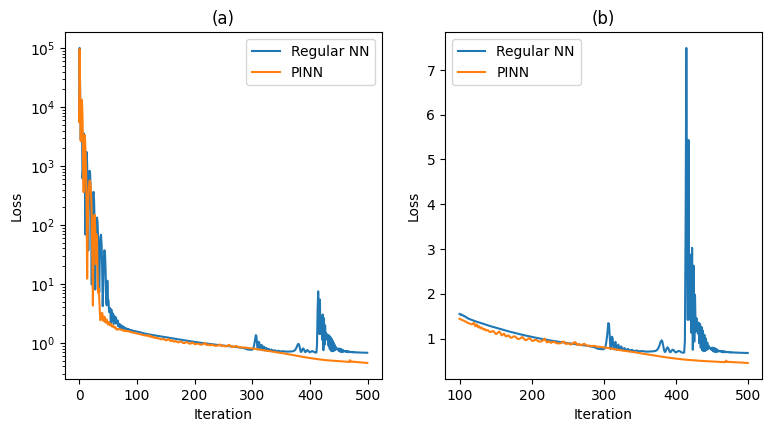

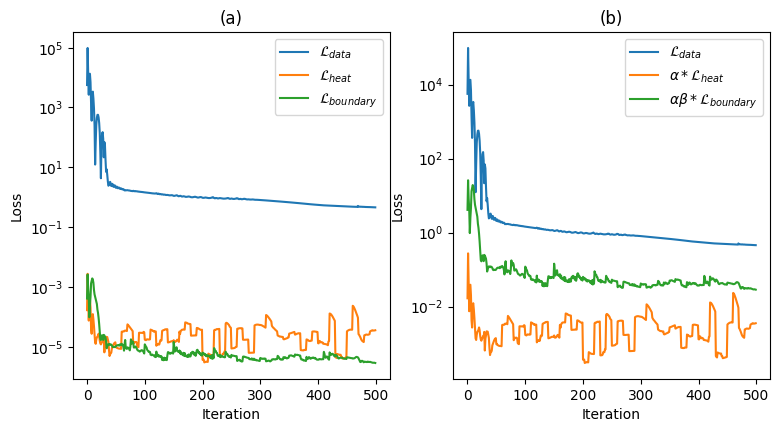

In [17]:
# plot the loss curve for both models
fig, axs = plt.subplots(1, 2, figsize=(9, 4.5))
axs[0].plot(losses_nn, label="Regular NN")
axs[0].plot(losses_pinn[:, 0], label="PINN")
axs[0].set_xlabel("Iteration")
axs[0].set_ylabel("Loss")
axs[0].set_yscale("log")
axs[0].set_title("(a)")
axs[0].legend()
axs[1].plot(range(100, NUM_ITER), losses_nn[100:], label="Regular NN")
axs[1].plot(range(100, NUM_ITER), losses_pinn[100:, 0], label="PINN")
axs[1].set_xlabel("Iteration")
axs[1].set_ylabel("Loss")
axs[1].set_title("(b)")
axs[1].legend()
plt.savefig("../Media/Plots/Losses2/lossestime")

fig, axs = plt.subplots(1, 2, figsize=(9, 4.5))
axs[0].plot(losses_pinn[:, 0], label="$\mathcal{L}_{data}$")
axs[0].plot(losses_pinn[:, 1], label="$\mathcal{L}_{heat}$")
axs[0].plot(losses_pinn[:, 2], label="$\mathcal{L}_{boundary}$")
axs[0].set_xlabel("Iteration")
axs[0].set_ylabel("Loss")
axs[0].set_yscale('log')
axs[0].set_title("(a)")
axs[0].legend()
axs[1].plot(losses_pinn[:, 0], label=r"$\mathcal{L}_{data}$")
axs[1].plot(losses_pinn[:, 1] * 100, label=r"$\alpha * \mathcal{L}_{heat}$")
axs[1].plot(losses_pinn[:, 2] * 10000, label=r"$\alpha \beta *\mathcal{L}_{boundary}$")
axs[1].set_xlabel("Iteration")
axs[1].set_ylabel("Loss")
axs[1].set_yscale('log')
axs[1].set_title("(b)")
axs[1].legend()
plt.savefig("../Media/Plots/Losses2/pinnlossestime")
plt.show()

In [18]:
train_input = X_input.to(torch.float64)
t = train_input[:, 0][:, None]
x = train_input[:, 1][:, None]
y = train_input[:, 2][:, None]
rest = train_input[:, 3:]

# get final predictions of train data
u_pred_train_nn = u_vmap_nn(train_input, params_nn)
u_pred_train_pinn = u_vmap_pinn(t, x, y, rest, params_pinn)
u_real_train = X_output.to(torch.float64)

print("MSE traindata NN: ", nn.MSELoss()(u_pred_train_nn, u_real_train).item())
print("MSE traindata PINN: ", nn.MSELoss()(u_pred_train_pinn, u_real_train).item())
print("\n")
print("MAE traindata NN: ", nn.L1Loss()(u_pred_train_nn, u_real_train).item())
print("MAE traindata PINN: ", nn.L1Loss()(u_pred_train_pinn, u_real_train).item())

# plot the training results
fig = go.Figure()
fig.add_trace(go.Scatter(x=X_input.detach().numpy()[:, 0], y=u_real_train.detach().numpy()[:, 0], name="Real"))
fig.add_trace(go.Scatter(x=X_input.detach().numpy()[:, 0], y=u_pred_train_nn.detach().numpy()[:,0], name="Regular NN"))
fig.add_trace(go.Scatter(x=X_input.detach().numpy()[:, 0], y=u_pred_train_pinn.detach().numpy()[:,0], name="PINN"))
fig.update_layout(
    xaxis_title="Time",
    yaxis_title="Temperature (C)",
    legend_title="Models",
    font=dict(
        family="Courier New, monospace",
        size=18,
    )
)
fig.show()

MSE traindata NN:  0.6776426900054537
MSE traindata PINN:  0.45585740177826084


MAE traindata NN:  0.5331591488876583
MAE traindata PINN:  0.4015207881609671


### Testing results

In [19]:
test_input = Y_input.to(torch.float64)
t = test_input[:, 0][:, None]
x = test_input[:, 1][:, None]
y = test_input[:, 2][:, None]
rest = test_input[:, 3:]

# get final prediction of test data
u_pred_test_nn = u_vmap_nn(test_input, params_nn)
u_pred_test_pinn = u_vmap_pinn(t, x, y, rest, params_pinn)
u_real_test = Y_output.to(torch.float64)

print("MSE testdata NN: ", nn.MSELoss()(u_pred_test_nn, u_real_test).item())
print("MSE testdata PINN: ", nn.MSELoss()(u_pred_test_pinn, u_real_test).item())
print("\n")
print("MAE testdata NN: ", nn.L1Loss()(u_pred_test_nn, u_real_test).item())
print("MAE testdata PINN: ", nn.L1Loss()(u_pred_test_pinn, u_real_test).item())

# plot the test results
fig = go.Figure()
fig.add_trace(go.Scatter(x=Y_input.detach().numpy()[:, 0], y=u_real_test.detach().numpy()[:, 0], name="Real"))
fig.add_trace(go.Scatter(x=Y_input.detach().numpy()[:, 0], y=u_pred_test_nn.detach().numpy()[:,0], name="Regular NN"))
fig.add_trace(go.Scatter(x=Y_input.detach().numpy()[:, 0], y=u_pred_test_pinn.detach().numpy()[:,0], name="PINN"))
fig.update_layout(
    xaxis_title="Time",
    yaxis_title="Temperature (C)",
    legend_title="Models",
    font=dict(
        family="Courier New, monospace",
        size=18,
    )
)
fig.show()

MSE testdata NN:  41.47102289855315
MSE testdata PINN:  21.28277619546901


MAE testdata NN:  4.894883653816264
MAE testdata PINN:  3.4755297220721353


## Grid prediction

### Loading the data

In [16]:
NUM_ITER = 1000
LEARNING_RATE = 0.02
# merge the original train and test data
old_X = pd.read_csv('../Data/NN data/nn_train_mei_17-26.csv')
old_Y = pd.read_csv('../Data/NN data/nn_test_mei_17-26.csv')
datag = pd.concat([old_X, old_Y], ignore_index=True)
datag.drop(columns=["Unnamed: 0",  "Water-1", "Water-2", "Water-3"], inplace=True)

# split data into X and Y (train and test)
Xg = datag[datag.x != 22]
Yg = datag[datag.x == 22]
print(Xg.shape, Yg.shape)
Xg_input = Xg[['t', 'x', 'y', 'Hot gas pipe', 'Liquid pipe', 'Suction pipe', 'Door', 'Fridge', 'Environment', 'Energy']]
Xg_output = Xg[['u']]
Yg_input = Yg[['t', 'x', 'y', 'Hot gas pipe', 'Liquid pipe', 'Suction pipe', 'Door', 'Fridge', 'Environment', 'Energy']]
Yg_output = Yg[['u']]

# convert to Tensor
Xg_input = torch.tensor(Xg_input.values, dtype=torch.float64, requires_grad=True)
Xg_output = torch.tensor(Xg_output.values, dtype=torch.float64, requires_grad=True)
Yg_input = torch.tensor(Yg_input.values, dtype=torch.float64, requires_grad=True)
Yg_output = torch.tensor(Yg_output.values, dtype=torch.float64, requires_grad=True)


(25478, 11) (12739, 11)


### PINN

In [9]:
# create the PINN model and make it functional using functorch utilities
modelg_pinn = NN(input_size=10, output_size=1, dim_hidden=DIM_HIDDEN, act=ACT)
modelg_pinn.double()
fmodelg_pinn, paramsg_pinn = make_functional(modelg_pinn)

# define the u function for the pinn
def ug_pinn(t: torch.Tensor, x: torch.Tensor, y: torch.Tensor, rest: torch.Tensor, params: torch.Tensor) -> torch.Tensor:
    input = torch.cat([t, x, y, rest], dim=-1)
    input_ = input.unsqueeze(0)
    u_pred = fmodelg_pinn(params, input_).squeeze(0)
    return u_pred

# use `vmap` primitive to allow efficient batching of the input
u_vmapg_pinn = vmap(ug_pinn, in_dims=(0, 0, 0, 0, None))

dudtg = vmap(jacrev(ug_pinn, argnums=0), in_dims=(0, 0, 0, 0, None))
dudxg = vmap(jacrev(ug_pinn, argnums=1), in_dims=(0, 0, 0, 0, None))
dudxdxg = vmap(jacrev(jacrev(ug_pinn, argnums=1), argnums=1), in_dims=(0, 0, 0, 0, None))
dudyg = vmap(jacrev(ug_pinn, argnums=2), in_dims=(0, 0, 0, 0, None))
dudydyg = vmap(jacrev(jacrev(ug_pinn, argnums=2),argnums=2), in_dims=(0, 0, 0, 0, None))

/usr/local/lib/python3.9/site-packages/torch/_functorch/deprecated.py:97: UserWarning: We've integrated functorch into PyTorch. As the final step of the integration, functorch.make_functional is deprecated as of PyTorch 2.0 and will be deleted in a future version of PyTorch >= 2.3. Please use torch.func.functional_call instead; see the PyTorch 2.0 release notes and/or the torch.func migration guide for more details https://pytorch.org/docs/master/func.migrating.html
  warn_deprecated('make_functional', 'torch.func.functional_call')
/usr/local/lib/python3.9/site-packages/torch/_functorch/deprecated.py:58: UserWarning: We've integrated functorch into PyTorch. As the final step of the integration, functorch.vmap is deprecated as of PyTorch 2.0 and will be deleted in a future version of PyTorch >= 2.3. Please use torch.vmap instead; see the PyTorch 2.0 release notes and/or the torch.func migration guide for more details https://pytorch.org/docs/master/func.migrating.html
  warn_deprecated(

In [10]:
def loss_pdeg(inputs: tuple, params: torch.Tensor) -> torch.Tensor:
    t, x, y, rest = inputs
    du_dt = dudtg(t, x, y, rest, params)
    du_dxdx = dudxdxg(t, x, y, rest, params)
    du_dydy = dudydyg(t, x, y, rest, params)
    interior = torch.sub(du_dt, torch.mul(torch.add(du_dxdx, du_dydy), (C**2)))
    return nn.MSELoss()(interior, torch.zeros_like(interior))

def loss_boundary_xg(inputs: tuple, params: torch.Tensor) -> torch.Tensor:
    t, x, y, rest = inputs
    boundary = dudxg(t, x, y, rest, params)
    return nn.MSELoss()(boundary, torch.zeros_like(boundary[0]))

def loss_boundary_yg(inputs: tuple, params: torch.Tensor) -> torch.Tensor:
    t, x, y, rest = inputs
    boundary = dudxg(t, x, y, rest, params)
    return nn.MSELoss()(boundary, torch.zeros_like(boundary))

def loss_datag_pinn(inputs: tuple, params: torch.Tensor, u_real: torch.Tensor) -> torch.Tensor:
    t, x, y, rest = inputs
    u_pred = u_vmapg_pinn(t, x, y, rest, params)
    return nn.MSELoss()(u_pred, u_real)

In [11]:
# choose optimizer with functional API using functorch
optimizerg = torchopt.FuncOptimizer(torchopt.adam(lr=LEARNING_RATE))

# data
train_input = Xg_input.to(torch.float64)
train_u_real = Xg_output.to(torch.float64)

# train the model
lossesg_pinn = np.array([])
for i in range(NUM_ITER):
    # sample PDE and Boundary points
    if i % SAMPLE_INTERVAL == 0:    
        boundary_samples = boundary_sampling(n=BATCH_SIZE)
        pde_samples = pde_sampling(n=BATCH_SIZE)

    #compute the loss from PDE
    pde_loss = loss_pdeg(pde_samples, paramsg_pinn)

    # compute the loss from boundary conditions
    boundary_loss_x0 = loss_boundary_xg(boundary_samples[0], paramsg_pinn)
    boundary_loss_x1 = loss_boundary_xg(boundary_samples[1], paramsg_pinn)
    boundary_loss_y0 = loss_boundary_yg(boundary_samples[2], paramsg_pinn)
    boundary_loss_y1 = loss_boundary_yg(boundary_samples[3], paramsg_pinn)
    boundary_loss = torch.add(torch.add(boundary_loss_x0, boundary_loss_x1), torch.add(boundary_loss_y0, boundary_loss_y1))

    # split the train_input into t, x, y and rest
    t = train_input[:, 0][:, None]
    x = train_input[:, 1][:, None]
    y = train_input[:, 2][:, None]
    rest = train_input[:, 3:]
    train_input_tuple = (t, x, y, rest)

    # compute the loss from data
    data_loss = loss_datag_pinn(train_input_tuple, paramsg_pinn, train_u_real)

    # add the losses and optimize
    pinn_loss =  torch.add(data_loss, torch.add(pde_loss, boundary_loss, alpha=BETA), alpha=ALPHA)
    paramsg_pinn = optimizerg.step(pinn_loss, paramsg_pinn)

    # store the loss
    lossesg_pinn = np.append(lossesg_pinn, [data_loss.item(), pde_loss.item(), boundary_loss.item()])
    print(f"Iteration {i+1} with losses:  Total={pinn_loss.item()}; Data={data_loss}; PDE={pde_loss}; Boundary={boundary_loss}")
    
lossesg_pinn = lossesg_pinn.reshape(NUM_ITER,3)   

/usr/local/lib/python3.9/site-packages/torch/nn/modules/loss.py:536: UserWarning: Using a target size (torch.Size([1, 1])) that is different to the input size (torch.Size([75, 1, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Iteration 1 with losses:  Total=2069.342396148425; Data=2056.2609886581686; PDE=7.16209594532019e-05; Boundary=0.0013074245394310933
Iteration 2 with losses:  Total=1996623.9847061592; Data=1996596.5734642113; PDE=0.03681239468067461; Boundary=0.0023730002479955044
Iteration 3 with losses:  Total=40023.033341820395; Data=40011.17834816855; PDE=0.0009771476624972019; Boundary=0.001175727888559848
Iteration 4 with losses:  Total=442778.475355828; Data=442770.9125272218; PDE=0.008032223268634085; Boundary=0.0006759606279374596
Iteration 5 with losses:  Total=518537.33476914006; Data=518534.0834493786; PDE=0.009543901688565344; Boundary=0.00022969295925802567
Iteration 6 with losses:  Total=300244.2461923941; Data=300237.59851236857; PDE=0.00571765876241893; Boundary=0.0006075914149302228
Iteration 7 with losses:  Total=134272.46488356713; Data=134266.55281379021; PDE=0.0026860124607570772; Boundary=0.0005643468530829199
Iteration 8 with losses:  Total=47261.80826597815; Data=47256.6485440

/usr/local/lib/python3.9/site-packages/torch/nn/modules/loss.py:536: UserWarning: Using a target size (torch.Size([1, 1])) that is different to the input size (torch.Size([75, 1, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Iteration 11 with losses:  Total=43.522557349608725; Data=42.61560182003731; PDE=2.4338659766418595e-05; Boundary=9.045216635947709e-05
Iteration 12 with losses:  Total=899.3292043723872; Data=894.0012345307839; PDE=2.8295469081769077e-05; Boundary=0.0005325140294695071
Iteration 13 with losses:  Total=933.4028873364401; Data=929.6447437748726; PDE=3.083823019364045e-05; Boundary=0.0003755059738548142
Iteration 14 with losses:  Total=66.58200646037244; Data=63.89671898096724; PDE=2.0104874738044015e-05; Boundary=0.00026832769919313975
Iteration 15 with losses:  Total=858.8906677880723; Data=857.3145901826443; PDE=4.0003919744085556e-05; Boundary=0.00015720772134535059
Iteration 16 with losses:  Total=244.240435809038; Data=243.4172465266708; PDE=2.8583360401784402e-05; Boundary=8.203309463270223e-05
Iteration 17 with losses:  Total=28.06459604808788; Data=27.44503316020865; PDE=2.1901053776153024e-05; Boundary=6.173727825016154e-05
Iteration 18 with losses:  Total=262.62994365423157; D

/usr/local/lib/python3.9/site-packages/torch/nn/modules/loss.py:536: UserWarning: Using a target size (torch.Size([1, 1])) that is different to the input size (torch.Size([75, 1, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Iteration 21 with losses:  Total=43.29197734334198; Data=39.91125409294841; PDE=8.549092112337933e-06; Boundary=0.00033798683411823366
Iteration 22 with losses:  Total=97.79182517888925; Data=94.65047380229674; PDE=5.011850754018114e-06; Boundary=0.0003140850191517112
Iteration 23 with losses:  Total=148.65241072041965; Data=146.4779122952491; PDE=5.960980237759918e-06; Boundary=0.00021739023271467785
Iteration 24 with losses:  Total=63.63127743539587; Data=62.143042488888334; PDE=4.531627579302558e-06; Boundary=0.00014877817837496054
Iteration 25 with losses:  Total=14.324856903241647; Data=13.439197407797714; PDE=2.060958083582075e-06; Boundary=8.854533996355745e-05
Iteration 26 with losses:  Total=21.05979256976229; Data=20.65932626849569; PDE=2.140241884192028e-06; Boundary=4.0025227707818174e-05
Iteration 27 with losses:  Total=35.341947523937776; Data=35.07363558138471; PDE=1.7183282849273484e-06; Boundary=2.681401097245743e-05
Iteration 28 with losses:  Total=39.227759553813215;

/usr/local/lib/python3.9/site-packages/torch/nn/modules/loss.py:536: UserWarning: Using a target size (torch.Size([1, 1])) that is different to the input size (torch.Size([75, 1, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Iteration 31 with losses:  Total=12.605737101069122; Data=12.26944211030262; PDE=1.0914978519865377e-05; Boundary=3.3520349291451615e-05
Iteration 32 with losses:  Total=16.188020773559376; Data=15.73596076614506; PDE=1.3923440097725375e-05; Boundary=4.506676634045422e-05
Iteration 33 with losses:  Total=24.05857877221926; Data=23.697018970671532; PDE=1.6261655517469094e-05; Boundary=3.599336359959796e-05
Iteration 34 with losses:  Total=26.75245081721922; Data=26.475236511534632; PDE=1.1595422217067498e-05; Boundary=2.7605476346288095e-05
Iteration 35 with losses:  Total=21.830038879381718; Data=21.473387823622165; PDE=1.104176825953377e-05; Boundary=3.555468789335998e-05
Iteration 36 with losses:  Total=61.59276045500307; Data=60.98453343802788; PDE=9.860575728835663e-06; Boundary=6.072409594023013e-05
Iteration 37 with losses:  Total=15.114066147952597; Data=14.929570544632544; PDE=7.186723239476233e-06; Boundary=1.8377693099610522e-05
Iteration 38 with losses:  Total=29.52773618153

/usr/local/lib/python3.9/site-packages/torch/nn/modules/loss.py:536: UserWarning: Using a target size (torch.Size([1, 1])) that is different to the input size (torch.Size([75, 1, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Iteration 41 with losses:  Total=25.78647506843602; Data=25.599592350161075; PDE=2.047150750170404e-05; Boundary=1.848355675247733e-05
Iteration 42 with losses:  Total=14.497593168944771; Data=14.33001836720213; PDE=2.2186233009946408e-05; Boundary=1.6535617844164583e-05
Iteration 43 with losses:  Total=13.721079612169472; Data=13.535007753644711; PDE=2.5197954483645095e-05; Boundary=1.83552063076396e-05
Iteration 44 with losses:  Total=21.724616496797328; Data=21.53178965001486; PDE=2.6046461920688658e-05; Boundary=1.9022220059039765e-05
Iteration 45 with losses:  Total=28.085681295658517; Data=27.876641243763885; PDE=2.5250739005155204e-05; Boundary=2.0651497799411568e-05
Iteration 46 with losses:  Total=25.490362449041992; Data=25.286683234014014; PDE=2.3551728802646378e-05; Boundary=2.013240421477131e-05
Iteration 47 with losses:  Total=17.42052505131819; Data=17.242962834213767; PDE=2.1175353576468315e-05; Boundary=1.7544468174677533e-05
Iteration 48 with losses:  Total=12.3181075

/usr/local/lib/python3.9/site-packages/torch/nn/modules/loss.py:536: UserWarning: Using a target size (torch.Size([1, 1])) that is different to the input size (torch.Size([75, 1, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Iteration 51 with losses:  Total=37.757304413239154; Data=37.54238562610088; PDE=7.73694659352305e-06; Boundary=2.141450924789182e-05
Iteration 52 with losses:  Total=35.99824531513648; Data=35.84646753665713; PDE=5.864612578717165e-06; Boundary=1.5119131722148072e-05
Iteration 53 with losses:  Total=24.162254507994557; Data=24.06439564509055; PDE=4.364357378971382e-06; Boundary=9.742242716611006e-06
Iteration 54 with losses:  Total=13.325438222422472; Data=13.207301808026216; PDE=3.4010401270885455e-06; Boundary=1.1779631038354639e-05
Iteration 55 with losses:  Total=14.43331805325196; Data=14.30089178382542; PDE=3.081206176326947e-06; Boundary=1.3211814880890515e-05
Iteration 56 with losses:  Total=19.17174636025825; Data=18.976277790836157; PDE=3.7859380195067777e-06; Boundary=1.9508997562014334e-05
Iteration 57 with losses:  Total=23.97939185690519; Data=23.762722819278853; PDE=4.158170062178132e-06; Boundary=2.1625322062011602e-05
Iteration 58 with losses:  Total=21.51047241652429

/usr/local/lib/python3.9/site-packages/torch/nn/modules/loss.py:536: UserWarning: Using a target size (torch.Size([1, 1])) that is different to the input size (torch.Size([75, 1, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Iteration 61 with losses:  Total=13.170982905752522; Data=13.04642250780345; PDE=5.337743456599689e-06; Boundary=1.2402662360341089e-05
Iteration 62 with losses:  Total=16.816669865293818; Data=16.70173097124551; PDE=8.21263566798794e-06; Boundary=1.1411763048150747e-05
Iteration 63 with losses:  Total=18.348209874270317; Data=18.185125223249823; PDE=9.341272910098231e-06; Boundary=1.6215052372948256e-05
Iteration 64 with losses:  Total=16.335712400256117; Data=16.186271174473426; PDE=1.0695897913778023e-05; Boundary=1.4837163599131245e-05
Iteration 65 with losses:  Total=12.926299750284345; Data=12.830599165545507; PDE=1.16435867042293e-05; Boundary=9.453622606841494e-06
Iteration 66 with losses:  Total=11.308996855453405; Data=11.198311406894486; PDE=1.2849244266331408e-05; Boundary=1.0940052413228426e-05
Iteration 67 with losses:  Total=12.437916807567207; Data=12.311798785468591; PDE=1.3928522447867899e-05; Boundary=1.2472516985382938e-05
Iteration 68 with losses:  Total=14.4575686

/usr/local/lib/python3.9/site-packages/torch/nn/modules/loss.py:536: UserWarning: Using a target size (torch.Size([1, 1])) that is different to the input size (torch.Size([75, 1, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Iteration 71 with losses:  Total=11.564193891962784; Data=11.416473251805645; PDE=1.3489133511026102e-05; Boundary=1.4637172680603668e-05
Iteration 72 with losses:  Total=11.235008265972853; Data=11.099883709134192; PDE=1.3392889471039782e-05; Boundary=1.3378526789155825e-05
Iteration 73 with losses:  Total=12.194515809906342; Data=12.070418843933675; PDE=1.3080148483065048e-05; Boundary=1.2278895112435961e-05
Iteration 74 with losses:  Total=13.086403443666821; Data=12.965825239217269; PDE=1.2270938987810088e-05; Boundary=1.1935111055077168e-05
Iteration 75 with losses:  Total=12.924091878269927; Data=12.786244938997566; PDE=1.2252013462954283e-05; Boundary=1.3662173792606485e-05
Iteration 76 with losses:  Total=11.904840376631228; Data=11.764036408763285; PDE=1.2299918444013988e-05; Boundary=1.3957397602354014e-05
Iteration 77 with losses:  Total=11.076660248189677; Data=10.922751939953892; PDE=1.2392037133927285e-05; Boundary=1.526691045223924e-05
Iteration 78 with losses:  Total=11

/usr/local/lib/python3.9/site-packages/torch/nn/modules/loss.py:536: UserWarning: Using a target size (torch.Size([1, 1])) that is different to the input size (torch.Size([75, 1, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Iteration 81 with losses:  Total=11.711000580357679; Data=11.555091013062817; PDE=1.1912585918206496e-05; Boundary=1.547183087030401e-05
Iteration 82 with losses:  Total=11.087848991487032; Data=10.934313995708193; PDE=1.161671730556136e-05; Boundary=1.5237332404828314e-05
Iteration 83 with losses:  Total=10.811670638174355; Data=10.66632988556153; PDE=1.1362173465269484e-05; Boundary=1.4420453526629872e-05
Iteration 84 with losses:  Total=11.029667230949649; Data=10.892080655865312; PDE=1.1978624201572777e-05; Boundary=1.363887126641792e-05
Iteration 85 with losses:  Total=11.37228429957664; Data=11.217439629824606; PDE=1.1655448664893672e-05; Boundary=1.536791248855454e-05
Iteration 86 with losses:  Total=11.379846198072327; Data=11.225419611836852; PDE=1.163024993293033e-05; Boundary=1.5326356124218184e-05
Iteration 87 with losses:  Total=11.060787204525075; Data=10.904261990221125; PDE=1.1688909769574082e-05; Boundary=1.553563233269942e-05
Iteration 88 with losses:  Total=10.747758

/usr/local/lib/python3.9/site-packages/torch/nn/modules/loss.py:536: UserWarning: Using a target size (torch.Size([1, 1])) that is different to the input size (torch.Size([75, 1, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Iteration 91 with losses:  Total=10.999603867145538; Data=10.836288982019292; PDE=9.818418981846266e-06; Boundary=1.62333043228061e-05
Iteration 92 with losses:  Total=10.881825945590437; Data=10.719367706124972; PDE=9.809232837027178e-06; Boundary=1.6147731618176205e-05
Iteration 93 with losses:  Total=10.665686998769417; Data=10.504585641827179; PDE=9.74850192368678e-06; Boundary=1.6012650674987003e-05
Iteration 94 with losses:  Total=10.56277067856092; Data=10.408019195221813; PDE=9.657021661551034e-06; Boundary=1.5378578117295234e-05
Iteration 95 with losses:  Total=10.625333431879556; Data=10.478190127511834; PDE=9.38164411382093e-06; Boundary=1.4620513995633986e-05
Iteration 96 with losses:  Total=10.717947820261413; Data=10.573728909576047; PDE=9.794846295299249e-06; Boundary=1.4323942605583541e-05
Iteration 97 with losses:  Total=10.69833936809238; Data=10.55263945039584; PDE=9.13904280492189e-06; Boundary=1.4478601341604783e-05
Iteration 98 with losses:  Total=10.5665420229289

/usr/local/lib/python3.9/site-packages/torch/nn/modules/loss.py:536: UserWarning: Using a target size (torch.Size([1, 1])) that is different to the input size (torch.Size([75, 1, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Iteration 101 with losses:  Total=10.500169360191558; Data=10.362835248137076; PDE=1.405114928296517e-05; Boundary=1.3592899712618536e-05
Iteration 102 with losses:  Total=10.509989352687807; Data=10.372164827397496; PDE=1.385850127881375e-05; Boundary=1.3643867516242891e-05
Iteration 103 with losses:  Total=10.44439460025119; Data=10.307915593119898; PDE=1.4707386042706282e-05; Boundary=1.3500826852702255e-05
Iteration 104 with losses:  Total=10.36428177096242; Data=10.231797075695162; PDE=1.4523102145671293e-05; Boundary=1.3103238505269066e-05
Iteration 105 with losses:  Total=10.34174113423712; Data=10.210033619430055; PDE=1.434365866529309e-05; Boundary=1.3027314894053548e-05
Iteration 106 with losses:  Total=10.364976342753986; Data=10.235435326729236; PDE=1.4172605999916381e-05; Boundary=1.2812375542475683e-05
Iteration 107 with losses:  Total=10.377565348881761; Data=10.248349936051572; PDE=1.394683392627416e-05; Boundary=1.2782072943756298e-05
Iteration 108 with losses:  Total=

/usr/local/lib/python3.9/site-packages/torch/nn/modules/loss.py:536: UserWarning: Using a target size (torch.Size([1, 1])) that is different to the input size (torch.Size([75, 1, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Iteration 111 with losses:  Total=10.344850803680457; Data=10.124723760617119; PDE=1.614698440129901e-05; Boundary=2.1851234462320833e-05
Iteration 112 with losses:  Total=10.348421243598986; Data=10.129811750095593; PDE=1.7108355628908073e-05; Boundary=2.168986579405023e-05
Iteration 113 with losses:  Total=10.326598745857277; Data=10.110572648624894; PDE=1.7089404379321974e-05; Boundary=2.1431715679445098e-05
Iteration 114 with losses:  Total=10.287163756902697; Data=10.074440328803476; PDE=1.7041927258271243e-05; Boundary=2.1101923537339397e-05
Iteration 115 with losses:  Total=10.250208681024644; Data=10.049040969739748; PDE=1.697198588973996e-05; Boundary=1.9947051269592122e-05
Iteration 116 with losses:  Total=10.241010608112465; Data=10.045018617819137; PDE=1.6886858137649394e-05; Boundary=1.9430330447956184e-05
Iteration 117 with losses:  Total=10.237627765694947; Data=10.045849218570822; PDE=1.679581386143022e-05; Boundary=1.9009896573798246e-05
Iteration 118 with losses:  Tot

/usr/local/lib/python3.9/site-packages/torch/nn/modules/loss.py:536: UserWarning: Using a target size (torch.Size([1, 1])) that is different to the input size (torch.Size([75, 1, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Iteration 121 with losses:  Total=10.136258511937601; Data=9.9691260100274; PDE=8.625722197418097e-06; Boundary=1.6626992969045875e-05
Iteration 122 with losses:  Total=10.131189023344861; Data=9.963666993250301; PDE=8.537455628057122e-06; Boundary=1.6666828453175357e-05
Iteration 123 with losses:  Total=10.11862426801993; Data=9.951505485050937; PDE=8.410634570595312e-06; Boundary=1.6627771951193345e-05
Iteration 124 with losses:  Total=10.087752424076252; Data=9.931662148501957; PDE=8.258947186782332e-06; Boundary=1.5526438085561605e-05
Iteration 125 with losses:  Total=10.070785960294675; Data=9.913578092843839; PDE=8.48545868370322e-06; Boundary=1.563593215824665e-05
Iteration 126 with losses:  Total=10.058386738268988; Data=9.903391232933517; PDE=8.409085833706377e-06; Boundary=1.5415459675210013e-05
Iteration 127 with losses:  Total=10.054197895948858; Data=9.896516640119502; PDE=8.173072029601441e-06; Boundary=1.5686394862639532e-05
Iteration 128 with losses:  Total=10.039218623

/usr/local/lib/python3.9/site-packages/torch/nn/modules/loss.py:536: UserWarning: Using a target size (torch.Size([1, 1])) that is different to the input size (torch.Size([75, 1, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Iteration 131 with losses:  Total=10.198240950328186; Data=9.838532099214946; PDE=1.4146025502888384e-05; Boundary=3.582942485629509e-05
Iteration 132 with losses:  Total=10.168378146436982; Data=9.8297271958936; PDE=1.4123302801475187e-05; Boundary=3.37238620263234e-05
Iteration 133 with losses:  Total=10.14110913009621; Data=9.819573037294456; PDE=1.4163823282135771e-05; Boundary=3.201197104735406e-05
Iteration 134 with losses:  Total=10.108224884369893; Data=9.807344738676395; PDE=1.5213924476486193e-05; Boundary=2.9935875324584954e-05
Iteration 135 with losses:  Total=10.072656287668872; Data=9.796337894393655; PDE=1.5035667359123615e-05; Boundary=2.7481482653930355e-05
Iteration 136 with losses:  Total=10.070585147675994; Data=9.788545628470837; PDE=1.5291761671561915e-05; Boundary=2.805103430380001e-05
Iteration 137 with losses:  Total=10.056839813424093; Data=9.781750242540904; PDE=1.5404878606949165e-05; Boundary=2.7354908302249474e-05
Iteration 138 with losses:  Total=10.04486

/usr/local/lib/python3.9/site-packages/torch/nn/modules/loss.py:536: UserWarning: Using a target size (torch.Size([1, 1])) that is different to the input size (torch.Size([75, 1, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Iteration 141 with losses:  Total=10.032143384589292; Data=9.738173807149794; PDE=8.527023782958087e-06; Boundary=2.931168750612016e-05
Iteration 142 with losses:  Total=10.011791793304477; Data=9.72862174728547; PDE=8.14853261915547e-06; Boundary=2.8235519275709234e-05
Iteration 143 with losses:  Total=9.988807940834496; Data=9.71918023912142; PDE=7.733628804076803e-06; Boundary=2.688543388326693e-05
Iteration 144 with losses:  Total=9.920157700463475; Data=9.710048767010933; PDE=7.39463999444197e-06; Boundary=2.0936946945309744e-05
Iteration 145 with losses:  Total=9.896100221610881; Data=9.701904973542748; PDE=7.095921889719284e-06; Boundary=1.9348565587916116e-05
Iteration 146 with losses:  Total=9.872198117054827; Data=9.69410152380578; PDE=6.912213798469168e-06; Boundary=1.7740537186919933e-05
Iteration 147 with losses:  Total=9.860026360860424; Data=9.684352296075199; PDE=6.9394337053833e-06; Boundary=1.749801214146866e-05
Iteration 148 with losses:  Total=9.825935561697412; Dat

/usr/local/lib/python3.9/site-packages/torch/nn/modules/loss.py:536: UserWarning: Using a target size (torch.Size([1, 1])) that is different to the input size (torch.Size([75, 1, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Iteration 151 with losses:  Total=9.785391837286769; Data=9.628041852726133; PDE=1.12024760419779e-05; Boundary=1.562297369564382e-05
Iteration 152 with losses:  Total=9.774861008290296; Data=9.617618772103157; PDE=1.1327162742574654e-05; Boundary=1.561095199128823e-05
Iteration 153 with losses:  Total=9.762663773634763; Data=9.607940718809319; PDE=1.1474486801871617e-05; Boundary=1.5357560614525697e-05
Iteration 154 with losses:  Total=9.749890790172023; Data=9.597820419927928; PDE=1.1060593522719112e-05; Boundary=1.5096431089182268e-05
Iteration 155 with losses:  Total=9.736597909409776; Data=9.586928861845644; PDE=1.068954727355841e-05; Boundary=1.4860009283677624e-05
Iteration 156 with losses:  Total=9.721913831940151; Data=9.57546867553984; PDE=1.0614088965518184e-05; Boundary=1.4538374750375941e-05
Iteration 157 with losses:  Total=9.706963309736867; Data=9.563880624658283; PDE=7.0613087101781455e-06; Boundary=1.423765542075657e-05
Iteration 158 with losses:  Total=9.709539909031

/usr/local/lib/python3.9/site-packages/torch/nn/modules/loss.py:536: UserWarning: Using a target size (torch.Size([1, 1])) that is different to the input size (torch.Size([75, 1, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Iteration 161 with losses:  Total=9.656167383450896; Data=9.52434058287695; PDE=9.92795865095635e-06; Boundary=1.308340047088486e-05
Iteration 162 with losses:  Total=9.66631748749298; Data=9.515449423595035; PDE=1.0012024747442688e-05; Boundary=1.4986686142320138e-05
Iteration 163 with losses:  Total=9.654422103315804; Data=9.506654714168805; PDE=1.0176340686190422e-05; Boundary=1.4674975507837983e-05
Iteration 164 with losses:  Total=9.642148885665911; Data=9.498208664882934; PDE=1.0070324859459688e-05; Boundary=1.4293318829703051e-05
Iteration 165 with losses:  Total=9.63323975519355; Data=9.490276032368437; PDE=1.0301357195528349e-05; Boundary=1.4193358710555999e-05
Iteration 166 with losses:  Total=9.622466994846963; Data=9.48230445925683; PDE=1.050221739298255e-05; Boundary=1.3911231385083383e-05
Iteration 167 with losses:  Total=9.612002548598335; Data=9.473769977439632; PDE=1.0523977691173007e-05; Boundary=1.3718017338958631e-05
Iteration 168 with losses:  Total=9.6016204191829

/usr/local/lib/python3.9/site-packages/torch/nn/modules/loss.py:536: UserWarning: Using a target size (torch.Size([1, 1])) that is different to the input size (torch.Size([75, 1, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Iteration 171 with losses:  Total=9.634509178689171; Data=9.434928436478467; PDE=6.358675785612819e-06; Boundary=1.9894487463214318e-05
Iteration 172 with losses:  Total=9.622233695854495; Data=9.42540947760217; PDE=5.984514873984364e-06; Boundary=1.962257667649266e-05
Iteration 173 with losses:  Total=9.608785822701378; Data=9.415965355019134; PDE=5.7570180289213074e-06; Boundary=1.92244765879352e-05
Iteration 174 with losses:  Total=9.594840882154859; Data=9.406609276575754; PDE=5.545208502281571e-06; Boundary=1.876770847288761e-05
Iteration 175 with losses:  Total=9.56515466253573; Data=9.397386232298043; PDE=5.503783453090232e-06; Boundary=1.6721805189237806e-05
Iteration 176 with losses:  Total=9.556901440831044; Data=9.388042708455481; PDE=5.524385437002529e-06; Boundary=1.683062938318626e-05
Iteration 177 with losses:  Total=9.546565759346453; Data=9.378359317512698; PDE=5.425638242317935e-06; Boundary=1.676638780095233e-05
Iteration 178 with losses:  Total=9.529814747930473; Da

/usr/local/lib/python3.9/site-packages/torch/nn/modules/loss.py:536: UserWarning: Using a target size (torch.Size([1, 1])) that is different to the input size (torch.Size([75, 1, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Iteration 181 with losses:  Total=9.45230625917332; Data=9.33588236984531; PDE=1.089893287459063e-05; Boundary=1.1533399604055071e-05
Iteration 182 with losses:  Total=9.441074939338788; Data=9.324562892568052; PDE=1.2345335418020345e-05; Boundary=1.1527751322893562e-05
Iteration 183 with losses:  Total=9.42996287940998; Data=9.313022717085007; PDE=1.1757771575615776e-05; Boundary=1.157643851674107e-05
Iteration 184 with losses:  Total=9.414556829103505; Data=9.301248315684122; PDE=1.1693000601732424e-05; Boundary=1.1213921335920946e-05
Iteration 185 with losses:  Total=9.398168204755079; Data=9.288994804703652; PDE=1.1437178922759232e-05; Boundary=1.0802968215915163e-05
Iteration 186 with losses:  Total=9.383395084941897; Data=9.276162780991717; PDE=1.1220526837328325e-05; Boundary=1.0611025126644774e-05
Iteration 187 with losses:  Total=9.36803033488984; Data=9.26289351621259; PDE=1.1093311162824357e-05; Boundary=1.0402748756096753e-05
Iteration 188 with losses:  Total=9.360157414909

/usr/local/lib/python3.9/site-packages/torch/nn/modules/loss.py:536: UserWarning: Using a target size (torch.Size([1, 1])) that is different to the input size (torch.Size([75, 1, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Iteration 191 with losses:  Total=9.343556540565052; Data=9.204408246059625; PDE=7.641821881317849e-06; Boundary=1.3838411231729503e-05
Iteration 192 with losses:  Total=9.330820703556446; Data=9.188974289822683; PDE=7.5601667272358395e-06; Boundary=1.41090397061039e-05
Iteration 193 with losses:  Total=9.313527371139179; Data=9.173480177745537; PDE=7.735313469174803e-06; Boundary=1.392736620467239e-05
Iteration 194 with losses:  Total=9.295902952386838; Data=9.157819332752346; PDE=7.238853745871627e-06; Boundary=1.373597342599039e-05
Iteration 195 with losses:  Total=9.271121974021414; Data=9.14193685373035; PDE=7.63149604674405e-06; Boundary=1.2842197068638985e-05
Iteration 196 with losses:  Total=9.249077260343451; Data=9.125614074428084; PDE=7.863184841244225e-06; Boundary=1.226768674312425e-05
Iteration 197 with losses:  Total=9.231060526069871; Data=9.108746525524111; PDE=8.020197497385927e-06; Boundary=1.215119807960223e-05
Iteration 198 with losses:  Total=9.212843380500617; Da

/usr/local/lib/python3.9/site-packages/torch/nn/modules/loss.py:536: UserWarning: Using a target size (torch.Size([1, 1])) that is different to the input size (torch.Size([75, 1, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Iteration 201 with losses:  Total=9.18251852486197; Data=9.036522247765978; PDE=1.614839150793988e-06; Boundary=1.4583479318091346e-05
Iteration 202 with losses:  Total=9.160174865697568; Data=9.017105544596221; PDE=1.6779864598770964e-06; Boundary=1.4290152245535955e-05
Iteration 203 with losses:  Total=9.1404604303054; Data=8.996669317282679; PDE=5.463678732589192e-06; Boundary=1.4324474514946154e-05
Iteration 204 with losses:  Total=9.109915915623832; Data=8.975451347622538; PDE=5.490160444511171e-06; Boundary=1.3391555195684265e-05
Iteration 205 with losses:  Total=9.069856545190225; Data=8.954051145165279; PDE=7.314355040102593e-06; Boundary=1.1507396452093668e-05
Iteration 206 with losses:  Total=9.049987358812132; Data=8.935474332182116; PDE=7.624834411075572e-06; Boundary=1.137505431889078e-05
Iteration 207 with losses:  Total=9.031730833780225; Data=8.916141129625919; PDE=1.1929278350490395e-05; Boundary=1.1439677631925802e-05
Iteration 208 with losses:  Total=9.00976439512068

/usr/local/lib/python3.9/site-packages/torch/nn/modules/loss.py:536: UserWarning: Using a target size (torch.Size([1, 1])) that is different to the input size (torch.Size([75, 1, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Iteration 211 with losses:  Total=9.004320069668657; Data=8.848425324319164; PDE=8.510320701893257e-06; Boundary=1.5504371327930253e-05
Iteration 212 with losses:  Total=8.989524580652656; Data=8.834232821627722; PDE=9.546082044800319e-06; Boundary=1.5433715082045372e-05
Iteration 213 with losses:  Total=8.978509753605584; Data=8.820776989686617; PDE=8.977341408833464e-06; Boundary=1.5683502977808382e-05
Iteration 214 with losses:  Total=8.967218422910152; Data=8.807989921104133; PDE=9.08643265343925e-06; Boundary=1.583198585406764e-05
Iteration 215 with losses:  Total=8.964401964647116; Data=8.792947655162436; PDE=9.413854196809705e-06; Boundary=1.705129240649997e-05
Iteration 216 with losses:  Total=8.949244908862362; Data=8.776264445024912; PDE=9.221153988095912e-06; Boundary=1.720583484386401e-05
Iteration 217 with losses:  Total=8.929788074688377; Data=8.759051067880673; PDE=9.435931535629658e-06; Boundary=1.697934136541414e-05
Iteration 218 with losses:  Total=8.914837799212723; 

/usr/local/lib/python3.9/site-packages/torch/nn/modules/loss.py:536: UserWarning: Using a target size (torch.Size([1, 1])) that is different to the input size (torch.Size([75, 1, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Iteration 221 with losses:  Total=8.838905218911663; Data=8.680176630525413; PDE=1.677989155514366e-05; Boundary=1.5705059923073637e-05
Iteration 222 with losses:  Total=8.806833407881316; Data=8.663105311381427; PDE=1.7260575473153106e-05; Boundary=1.4200203895257296e-05
Iteration 223 with losses:  Total=8.781247871997566; Data=8.64735072130701; PDE=1.7531026153461028e-05; Boundary=1.321440480752098e-05
Iteration 224 with losses:  Total=8.764182278199433; Data=8.633888263120854; PDE=1.7807380831867236e-05; Boundary=1.2851327699539243e-05
Iteration 225 with losses:  Total=8.750368195864565; Data=8.621512487860644; PDE=1.782949493115674e-05; Boundary=1.2707275851080588e-05
Iteration 226 with losses:  Total=8.735022508041796; Data=8.609222702210287; PDE=1.8036960163572485e-05; Boundary=1.2399610981515125e-05
Iteration 227 with losses:  Total=8.729502617524398; Data=8.596489438047929; PDE=1.832281517150224e-05; Boundary=1.311808979593192e-05
Iteration 228 with losses:  Total=8.71732442977

/usr/local/lib/python3.9/site-packages/torch/nn/modules/loss.py:536: UserWarning: Using a target size (torch.Size([1, 1])) that is different to the input size (torch.Size([75, 1, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Iteration 231 with losses:  Total=8.756569655320343; Data=8.547586609140602; PDE=6.497589334662867e-06; Boundary=2.0833328724627497e-05
Iteration 232 with losses:  Total=8.729066123169133; Data=8.539203211153875; PDE=6.111334662954632e-06; Boundary=1.892517785489617e-05
Iteration 233 with losses:  Total=8.702334556103576; Data=8.532413667178673; PDE=5.672581675799156e-06; Boundary=1.693536307573228e-05
Iteration 234 with losses:  Total=8.691082555434978; Data=8.52467441595631; PDE=5.373978351215463e-06; Boundary=1.6587074164354602e-05
Iteration 235 with losses:  Total=8.689362404268286; Data=8.517089327866538; PDE=4.832641012852675e-06; Boundary=1.7178981230046296e-05
Iteration 236 with losses:  Total=8.687574587129971; Data=8.506536953710789; PDE=4.721399162483426e-06; Boundary=1.8056549350293396e-05
Iteration 237 with losses:  Total=8.673805230640227; Data=8.496155733284787; PDE=4.7617200215523826e-06; Boundary=1.7717332535328385e-05
Iteration 238 with losses:  Total=8.65328997106381

/usr/local/lib/python3.9/site-packages/torch/nn/modules/loss.py:536: UserWarning: Using a target size (torch.Size([1, 1])) that is different to the input size (torch.Size([75, 1, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Iteration 241 with losses:  Total=8.642541573948062; Data=8.458114252096001; PDE=8.478858177272113e-06; Boundary=1.835794360343329e-05
Iteration 242 with losses:  Total=8.624543490264122; Data=8.449160486562; PDE=8.48965996463138e-06; Boundary=1.7453403770565807e-05
Iteration 243 with losses:  Total=8.61627054164895; Data=8.441538592808058; PDE=8.550582161299825e-06; Boundary=1.7387689062476106e-05
Iteration 244 with losses:  Total=8.612466222119533; Data=8.434254450780692; PDE=8.686003273854511e-06; Boundary=1.7734317101145584e-05
Iteration 245 with losses:  Total=8.60577215952182; Data=8.427321766519603; PDE=8.683425570846761e-06; Boundary=1.775820504451321e-05
Iteration 246 with losses:  Total=8.59198963188237; Data=8.419175914277147; PDE=8.82957549143714e-06; Boundary=1.7193076005607976e-05
Iteration 247 with losses:  Total=8.580468424375724; Data=8.410321070880249; PDE=8.800441787808632e-06; Boundary=1.6926730931669364e-05
Iteration 248 with losses:  Total=8.566392093807533; Data=

/usr/local/lib/python3.9/site-packages/torch/nn/modules/loss.py:536: UserWarning: Using a target size (torch.Size([1, 1])) that is different to the input size (torch.Size([75, 1, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Iteration 251 with losses:  Total=8.49579813547691; Data=8.366563270268754; PDE=2.1017894936478367e-05; Boundary=1.2713307571450866e-05
Iteration 252 with losses:  Total=8.48302784641147; Data=8.354524196229299; PDE=2.0667775386753903e-05; Boundary=1.2643687264349657e-05
Iteration 253 with losses:  Total=8.465293802872212; Data=8.341790309102054; PDE=2.0673410894723943e-05; Boundary=1.2143615268068638e-05
Iteration 254 with losses:  Total=8.451151619910556; Data=8.327155261507752; PDE=2.004719195490848e-05; Boundary=1.2199163920731387e-05
Iteration 255 with losses:  Total=8.433858577801459; Data=8.310384772878066; PDE=1.9353601134819642e-05; Boundary=1.2153844480990975e-05
Iteration 256 with losses:  Total=8.410517284290759; Data=8.290065941621895; PDE=1.8651847413414262e-05; Boundary=1.185861579275218e-05
Iteration 257 with losses:  Total=8.388087656451749; Data=8.268403010422148; PDE=1.947983978334697e-05; Boundary=1.177366620512668e-05
Iteration 258 with losses:  Total=8.36166345887

/usr/local/lib/python3.9/site-packages/torch/nn/modules/loss.py:536: UserWarning: Using a target size (torch.Size([1, 1])) that is different to the input size (torch.Size([75, 1, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Iteration 261 with losses:  Total=8.295822119605818; Data=8.1744827420415; PDE=2.1088360134695664e-05; Boundary=1.1923054155084965e-05
Iteration 262 with losses:  Total=8.270299426807139; Data=8.150480159123571; PDE=2.0905439351880625e-05; Boundary=1.1772872374837934e-05
Iteration 263 with losses:  Total=8.244436277114309; Data=8.126662145948032; PDE=2.033843630030399e-05; Boundary=1.157402875362457e-05
Iteration 264 with losses:  Total=8.213667184929827; Data=8.102226472391804; PDE=1.9939534014654304e-05; Boundary=1.0944675913655763e-05
Iteration 265 with losses:  Total=8.189196654870655; Data=8.078748769771263; PDE=1.932783667319605e-05; Boundary=1.085151014320725e-05
Iteration 266 with losses:  Total=8.164075315643089; Data=8.058401404910196; PDE=1.9141211588280254e-05; Boundary=1.0375978957406451e-05
Iteration 267 with losses:  Total=8.144777086269386; Data=8.04029129114415; PDE=1.8198378561738225e-05; Boundary=1.0266595726906112e-05
Iteration 268 with losses:  Total=8.126833599506

/usr/local/lib/python3.9/site-packages/torch/nn/modules/loss.py:536: UserWarning: Using a target size (torch.Size([1, 1])) that is different to the input size (torch.Size([75, 1, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Iteration 271 with losses:  Total=8.09087310036188; Data=7.974441338129811; PDE=1.1183228441220878e-05; Boundary=1.1531343938794822e-05
Iteration 272 with losses:  Total=8.075353076926394; Data=7.9576452874212835; PDE=1.1186927290607724e-05; Boundary=1.1658909677604876e-05
Iteration 273 with losses:  Total=8.060209983612088; Data=7.942043346800763; PDE=1.09714550761641e-05; Boundary=1.1706949130370916e-05
Iteration 274 with losses:  Total=8.044384978665263; Data=7.926679522702899; PDE=1.0618839602683247e-05; Boundary=1.1664357200209622e-05
Iteration 275 with losses:  Total=8.030069690937411; Data=7.911632328306441; PDE=1.0614647422551126e-05; Boundary=1.173758978887153e-05
Iteration 276 with losses:  Total=8.014881326077704; Data=7.8967788051208565; PDE=9.887677526201699e-06; Boundary=1.1711375320422714e-05
Iteration 277 with losses:  Total=8.000141687144145; Data=7.882726293801013; PDE=9.856203591465496e-06; Boundary=1.1642977298398588e-05
Iteration 278 with losses:  Total=7.986691863

/usr/local/lib/python3.9/site-packages/torch/nn/modules/loss.py:536: UserWarning: Using a target size (torch.Size([1, 1])) that is different to the input size (torch.Size([75, 1, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Iteration 281 with losses:  Total=7.927264546917259; Data=7.809637991988518; PDE=2.064501588808496e-05; Boundary=1.1556205333993256e-05
Iteration 282 with losses:  Total=7.912694787894363; Data=7.7959229874613865; PDE=2.1668684930664943e-05; Boundary=1.146049319399105e-05
Iteration 283 with losses:  Total=7.892570742790744; Data=7.773978429076098; PDE=2.153867922124095e-05; Boundary=1.1643844579252174e-05
Iteration 284 with losses:  Total=7.871994146173246; Data=7.753570019390695; PDE=2.142556347122822e-05; Boundary=1.162815704354276e-05
Iteration 285 with losses:  Total=7.857506327835449; Data=7.739590352755967; PDE=2.1499390165851056e-05; Boundary=1.1576603606289716e-05
Iteration 286 with losses:  Total=7.838742029711854; Data=7.720361864698325; PDE=2.15684061639344e-05; Boundary=1.162233243971362e-05
Iteration 287 with losses:  Total=7.818547890053546; Data=7.700097812474626; PDE=2.1805082141277e-05; Boundary=1.1626956936479232e-05
Iteration 288 with losses:  Total=7.803276591249317

/usr/local/lib/python3.9/site-packages/torch/nn/modules/loss.py:536: UserWarning: Using a target size (torch.Size([1, 1])) that is different to the input size (torch.Size([75, 1, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Iteration 291 with losses:  Total=7.763630385096093; Data=7.63088188125956; PDE=3.890090577872402e-05; Boundary=1.2885841325866038e-05
Iteration 292 with losses:  Total=7.7413038398587855; Data=7.6129091360821874; PDE=3.881567706562943e-05; Boundary=1.2451313607003484e-05
Iteration 293 with losses:  Total=7.722685026161608; Data=7.594605040134909; PDE=3.89585947717174e-05; Boundary=1.2418412654952725e-05
Iteration 294 with losses:  Total=7.713135135299353; Data=7.578851425919044; PDE=3.9257513568678124e-05; Boundary=1.303579580234414e-05
Iteration 295 with losses:  Total=7.6932746921395685; Data=7.560665848996132; PDE=3.8883956877492125e-05; Boundary=1.2872044745568707e-05
Iteration 296 with losses:  Total=7.673194148599643; Data=7.54288787425207; PDE=3.8992823161699105e-05; Boundary=1.2640699203140342e-05
Iteration 297 with losses:  Total=7.660740299748267; Data=7.52667135268855; PDE=3.8900123478860224e-05; Boundary=1.3017893471183082e-05
Iteration 298 with losses:  Total=7.6390176166

/usr/local/lib/python3.9/site-packages/torch/nn/modules/loss.py:536: UserWarning: Using a target size (torch.Size([1, 1])) that is different to the input size (torch.Size([75, 1, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Iteration 301 with losses:  Total=7.609588955028649; Data=7.45798406010414; PDE=1.9889714803130916e-05; Boundary=1.496159234441951e-05
Iteration 302 with losses:  Total=7.592510413509053; Data=7.4404422804634915; PDE=1.9691425972690333e-05; Boundary=1.5009899044829204e-05
Iteration 303 with losses:  Total=7.575688632032512; Data=7.423907993889149; PDE=1.962446187417982e-05; Boundary=1.4981819195594561e-05
Iteration 304 with losses:  Total=7.557034957954267; Data=7.40642753263577; PDE=1.941754992472365e-05; Boundary=1.48665670326024e-05
Iteration 305 with losses:  Total=7.529483265922471; Data=7.388971400299949; PDE=1.928405553802121e-05; Boundary=1.3858346006871936e-05
Iteration 306 with losses:  Total=7.511113725313688; Data=7.372570759296378; PDE=1.9290804658126896e-05; Boundary=1.3661388555149729e-05
Iteration 307 with losses:  Total=7.496668964799633; Data=7.356103532188859; PDE=1.8938124083323762e-05; Boundary=1.3867162020244105e-05
Iteration 308 with losses:  Total=7.478243065971

/usr/local/lib/python3.9/site-packages/torch/nn/modules/loss.py:536: UserWarning: Using a target size (torch.Size([1, 1])) that is different to the input size (torch.Size([75, 1, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Iteration 311 with losses:  Total=7.432786825931265; Data=7.2889123558038085; PDE=2.1384611826240933e-05; Boundary=1.4173600894483244e-05
Iteration 312 with losses:  Total=7.4141503607553245; Data=7.271507656647955; PDE=2.137720803643934e-05; Boundary=1.4050498330372572e-05
Iteration 313 with losses:  Total=7.395539426218018; Data=7.254612042273925; PDE=2.075925231226186e-05; Boundary=1.3885145871286707e-05
Iteration 314 with losses:  Total=7.378742613375506; Data=7.238034274379574; PDE=2.070051164292599e-05; Boundary=1.3863828783163906e-05
Iteration 315 with losses:  Total=7.359850346475997; Data=7.220950859152165; PDE=1.9998169290443318e-05; Boundary=1.3689967039478772e-05
Iteration 316 with losses:  Total=7.342870184997202; Data=7.203567224576603; PDE=1.9957065837227623e-05; Boundary=1.3730725383687645e-05
Iteration 317 with losses:  Total=7.3252671074220626; Data=7.185989133783596; PDE=1.9915063733647982e-05; Boundary=1.3728646726510142e-05
Iteration 318 with losses:  Total=7.30802

/usr/local/lib/python3.9/site-packages/torch/nn/modules/loss.py:536: UserWarning: Using a target size (torch.Size([1, 1])) that is different to the input size (torch.Size([75, 1, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Iteration 321 with losses:  Total=7.282265572646882; Data=7.117637306511244; PDE=2.3023072899188584e-05; Boundary=1.623259588457184e-05
Iteration 322 with losses:  Total=7.265147452429999; Data=7.100653677837926; PDE=2.3165390254011252e-05; Boundary=1.621772355666723e-05
Iteration 323 with losses:  Total=7.243111688092492; Data=7.083762377301591; PDE=2.3624849612885473e-05; Boundary=1.569868258296123e-05
Iteration 324 with losses:  Total=7.22908525272711; Data=7.066680420394403; PDE=2.3714782186652258e-05; Boundary=1.600333541140424e-05
Iteration 325 with losses:  Total=7.210713427070859; Data=7.049590105199347; PDE=2.4095281746643383e-05; Boundary=1.5871379369684726e-05
Iteration 326 with losses:  Total=7.192135643080985; Data=7.032862328304726; PDE=2.391098948516038e-05; Boundary=1.568822158277427e-05
Iteration 327 with losses:  Total=7.173490321442112; Data=7.016313427908563; PDE=2.4266019094545675e-05; Boundary=1.547502916240945e-05
Iteration 328 with losses:  Total=7.1577922324056

/usr/local/lib/python3.9/site-packages/torch/nn/modules/loss.py:536: UserWarning: Using a target size (torch.Size([1, 1])) that is different to the input size (torch.Size([75, 1, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Iteration 331 with losses:  Total=7.115225502548257; Data=6.9578916453757245; PDE=2.1444986390559205e-05; Boundary=1.551893585334763e-05
Iteration 332 with losses:  Total=7.1070749275169955; Data=6.939753024943654; PDE=2.4462906780033995e-05; Boundary=1.648756118953381e-05
Iteration 333 with losses:  Total=7.067515635530947; Data=6.928290493367097; PDE=2.127942482578527e-05; Boundary=1.3709719968127148e-05
Iteration 334 with losses:  Total=7.058167014775762; Data=6.9091116341082515; PDE=2.4360303800567074e-05; Boundary=1.4661935028745413e-05
Iteration 335 with losses:  Total=7.034326261988925; Data=6.889556975015888; PDE=2.368943971251433e-05; Boundary=1.4240034300178538e-05
Iteration 336 with losses:  Total=7.019153570871393; Data=6.867965402840001; PDE=2.3611879288034058e-05; Boundary=1.4882698010258826e-05
Iteration 337 with losses:  Total=6.999891385921677; Data=6.848279600154465; PDE=2.264755132266928e-05; Boundary=1.4934703063494528e-05
Iteration 338 with losses:  Total=6.9817511

/usr/local/lib/python3.9/site-packages/torch/nn/modules/loss.py:536: UserWarning: Using a target size (torch.Size([1, 1])) that is different to the input size (torch.Size([75, 1, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Iteration 341 with losses:  Total=6.918071289027264; Data=6.786339207123114; PDE=7.662713809724023e-06; Boundary=1.3096581052317767e-05
Iteration 342 with losses:  Total=6.89867222960279; Data=6.7688380077868455; PDE=7.55093725388446e-06; Boundary=1.2907912809055539e-05
Iteration 343 with losses:  Total=6.876450963562775; Data=6.746574043654991; PDE=7.685079250918775e-06; Boundary=1.2910841198269258e-05
Iteration 344 with losses:  Total=6.854874476212842; Data=6.727818142268437; PDE=7.1702891234830115e-06; Boundary=1.2633930503205713e-05
Iteration 345 with losses:  Total=6.832272081675582; Data=6.710396658981708; PDE=7.216413768194795e-06; Boundary=1.211537813170553e-05
Iteration 346 with losses:  Total=6.813788302610894; Data=6.694201437650273; PDE=7.2764301316597095e-06; Boundary=1.1885922194745534e-05
Iteration 347 with losses:  Total=6.79608301064241; Data=6.679560895305202; PDE=6.699891878756298e-06; Boundary=1.1585212614933245e-05
Iteration 348 with losses:  Total=6.7785893502384

/usr/local/lib/python3.9/site-packages/torch/nn/modules/loss.py:536: UserWarning: Using a target size (torch.Size([1, 1])) that is different to the input size (torch.Size([75, 1, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Iteration 351 with losses:  Total=6.807748542328649; Data=6.608327331440048; PDE=1.2874411797384658e-05; Boundary=1.9813376970886257e-05
Iteration 352 with losses:  Total=6.783608000134122; Data=6.593750022637401; PDE=1.3215510398925908e-05; Boundary=1.885364264568283e-05
Iteration 353 with losses:  Total=6.754602176143658; Data=6.573303007710477; PDE=1.266608021473268e-05; Boundary=1.800325604117078e-05
Iteration 354 with losses:  Total=6.726904435136367; Data=6.556003599830755; PDE=1.2744277955871583e-05; Boundary=1.696264075100251e-05
Iteration 355 with losses:  Total=6.703938864725814; Data=6.538236009728802; PDE=1.2862017792871555e-05; Boundary=1.6441665321772417e-05
Iteration 356 with losses:  Total=6.685781899087427; Data=6.5208925964434075; PDE=1.3131968189958082e-05; Boundary=1.6357610582502415e-05
Iteration 357 with losses:  Total=6.660054851279187; Data=6.505095164564041; PDE=1.3445866859552565e-05; Boundary=1.536151000291904e-05
Iteration 358 with losses:  Total=6.642101832

/usr/local/lib/python3.9/site-packages/torch/nn/modules/loss.py:536: UserWarning: Using a target size (torch.Size([1, 1])) that is different to the input size (torch.Size([75, 1, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Iteration 361 with losses:  Total=6.629915318238031; Data=6.437854566744369; PDE=3.77296725639167e-05; Boundary=1.8828778423726983e-05
Iteration 362 with losses:  Total=6.59866393794113; Data=6.440930004467663; PDE=3.5962203187381456e-05; Boundary=1.5413771315472866e-05
Iteration 363 with losses:  Total=6.592770982089283; Data=6.448316461318418; PDE=3.470284418504041e-05; Boundary=1.4098423635236001e-05
Iteration 364 with losses:  Total=6.622237093661931; Data=6.455258762925282; PDE=3.172792275186997e-05; Boundary=1.6380553846146234e-05
Iteration 365 with losses:  Total=6.594158596952382; Data=6.428893494487721; PDE=3.084069905191015e-05; Boundary=1.6218103255946964e-05
Iteration 366 with losses:  Total=6.52168572274826; Data=6.355757842332122; PDE=2.887078322705663e-05; Boundary=1.630408020934326e-05
Iteration 367 with losses:  Total=6.48415032806811; Data=6.334944433716181; PDE=2.836194692491187e-05; Boundary=1.4636969965943733e-05
Iteration 368 with losses:  Total=6.486454830067613;

/usr/local/lib/python3.9/site-packages/torch/nn/modules/loss.py:536: UserWarning: Using a target size (torch.Size([1, 1])) that is different to the input size (torch.Size([75, 1, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Iteration 371 with losses:  Total=6.362087617939728; Data=6.258964529680192; PDE=1.8314697721246977e-05; Boundary=1.0129161848741116e-05
Iteration 372 with losses:  Total=6.367422322331514; Data=6.266419277874378; PDE=1.841093616186449e-05; Boundary=9.916195084094933e-06
Iteration 373 with losses:  Total=6.3418239401888306; Data=6.238269326338579; PDE=1.8169801476022934e-05; Boundary=1.0173763370264896e-05
Iteration 374 with losses:  Total=6.301566407219142; Data=6.20423558434104; PDE=1.7774568869768572e-05; Boundary=9.555336599112548e-06
Iteration 375 with losses:  Total=6.283635255807226; Data=6.187950192394566; PDE=1.7569969883511612e-05; Boundary=9.39280664243091e-06
Iteration 376 with losses:  Total=6.278274367931164; Data=6.182424758234223; PDE=1.7588105629019686e-05; Boundary=9.409079913403952e-06
Iteration 377 with losses:  Total=6.256986202444984; Data=6.160847083723542; PDE=1.7092853859211494e-05; Boundary=9.44298333355204e-06
Iteration 378 with losses:  Total=6.2258070491824

/usr/local/lib/python3.9/site-packages/torch/nn/modules/loss.py:536: UserWarning: Using a target size (torch.Size([1, 1])) that is different to the input size (torch.Size([75, 1, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Iteration 381 with losses:  Total=6.24491779142274; Data=6.087227981561348; PDE=1.6584440660558125e-05; Boundary=1.5603136579533598e-05
Iteration 382 with losses:  Total=6.220282418339495; Data=6.061700798516329; PDE=1.642337923818249e-05; Boundary=1.569392818993474e-05
Iteration 383 with losses:  Total=6.195924097466093; Data=6.039572058787555; PDE=1.652553543403347e-05; Boundary=1.546994851351341e-05
Iteration 384 with losses:  Total=6.175676893281628; Data=6.0261477047014855; PDE=1.6661649443912885e-05; Boundary=1.478630236357514e-05
Iteration 385 with losses:  Total=6.162325910624682; Data=6.0131820612071145; PDE=1.651180336990893e-05; Boundary=1.4749266908057722e-05
Iteration 386 with losses:  Total=6.136402891962622; Data=5.990780823792212; PDE=1.685823114594536e-05; Boundary=1.439362450558155e-05
Iteration 387 with losses:  Total=6.111640854739438; Data=5.967226799698363; PDE=1.6986066544847062e-05; Boundary=1.4271544838659018e-05
Iteration 388 with losses:  Total=6.092264564721

/usr/local/lib/python3.9/site-packages/torch/nn/modules/loss.py:536: UserWarning: Using a target size (torch.Size([1, 1])) that is different to the input size (torch.Size([75, 1, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Iteration 391 with losses:  Total=6.043474557724671; Data=5.897716898573305; PDE=2.8075203691783314e-05; Boundary=1.4295013878218781e-05
Iteration 392 with losses:  Total=6.019746742963339; Data=5.874649932800364; PDE=2.5760943620163616e-05; Boundary=1.425207158009591e-05
Iteration 393 with losses:  Total=5.990147053761674; Data=5.853497619083888; PDE=2.5308296561285687e-05; Boundary=1.3411860502165682e-05
Iteration 394 with losses:  Total=5.965427708512605; Data=5.834399257943406; PDE=2.4842165457064835e-05; Boundary=1.285442340234926e-05
Iteration 395 with losses:  Total=5.94512958275128; Data=5.817422770269294; PDE=2.4392033837620734e-05; Boundary=1.2526760909822375e-05
Iteration 396 with losses:  Total=5.925369169280682; Data=5.801128700762067; PDE=2.4297513556103433e-05; Boundary=1.2181071716300383e-05
Iteration 397 with losses:  Total=5.910231170477777; Data=5.785085748977353; PDE=2.4167665879369155e-05; Boundary=1.2272865491248762e-05
Iteration 398 with losses:  Total=5.89297640

/usr/local/lib/python3.9/site-packages/torch/nn/modules/loss.py:536: UserWarning: Using a target size (torch.Size([1, 1])) that is different to the input size (torch.Size([75, 1, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Iteration 401 with losses:  Total=5.820552322524784; Data=5.711714321627231; PDE=1.1801683117891094e-05; Boundary=1.076578325857632e-05
Iteration 402 with losses:  Total=5.804174974531402; Data=5.6939392342864465; PDE=1.184617063971979e-05; Boundary=1.090511231809837e-05
Iteration 403 with losses:  Total=5.781302298190882; Data=5.675616185090616; PDE=1.1590615170318432e-05; Boundary=1.0452705158323407e-05
Iteration 404 with losses:  Total=5.762899202834831; Data=5.6583380134502095; PDE=1.1608461873977938e-05; Boundary=1.034003431972235e-05
Iteration 405 with losses:  Total=5.75635475866016; Data=5.642112079149713; PDE=1.149438293345375e-05; Boundary=1.1309324121710235e-05
Iteration 406 with losses:  Total=5.733618100616974; Data=5.6282863498687785; PDE=1.1671343828567912e-05; Boundary=1.0416461636533863e-05
Iteration 407 with losses:  Total=5.728560524194076; Data=5.620767166183256; PDE=1.1445252875155831e-05; Boundary=1.0664883272330329e-05
Iteration 408 with losses:  Total=5.72143272

/usr/local/lib/python3.9/site-packages/torch/nn/modules/loss.py:536: UserWarning: Using a target size (torch.Size([1, 1])) that is different to the input size (torch.Size([75, 1, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Iteration 411 with losses:  Total=5.821485377030683; Data=5.678421741316062; PDE=6.816512504573086e-06; Boundary=1.4238198446416365e-05
Iteration 412 with losses:  Total=5.7741246739686645; Data=5.606001587419267; PDE=7.386006779917371e-06; Boundary=1.6738448587140535e-05
Iteration 413 with losses:  Total=5.675143722211096; Data=5.517874094471085; PDE=7.940196732832197e-06; Boundary=1.5647560806672728e-05
Iteration 414 with losses:  Total=5.621482225264396; Data=5.460959291926414; PDE=7.364633482499727e-06; Boundary=1.597864699897326e-05
Iteration 415 with losses:  Total=5.6303867882613865; Data=5.472296899522799; PDE=7.438474295285738e-06; Boundary=1.5734604130905812e-05
Iteration 416 with losses:  Total=5.642630819032204; Data=5.505235684342349; PDE=7.23788988333523e-06; Boundary=1.3667134570152223e-05
Iteration 417 with losses:  Total=5.6402209094117675; Data=5.484967441680105; PDE=6.779972268990917e-06; Boundary=1.5457547050476337e-05
Iteration 418 with losses:  Total=5.56934488709

/usr/local/lib/python3.9/site-packages/torch/nn/modules/loss.py:536: UserWarning: Using a target size (torch.Size([1, 1])) that is different to the input size (torch.Size([75, 1, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Iteration 421 with losses:  Total=5.507705314525896; Data=5.368015340356228; PDE=1.7844946305293468e-05; Boundary=1.3790547953913787e-05
Iteration 422 with losses:  Total=5.507869477581395; Data=5.361658187974321; PDE=2.178497632932742e-05; Boundary=1.4403279197414192e-05
Iteration 423 with losses:  Total=5.477232339912592; Data=5.3381742019693466; PDE=2.132864006762276e-05; Boundary=1.3692527393648319e-05
Iteration 424 with losses:  Total=5.430413340921657; Data=5.287068001804734; PDE=2.2611578766956274e-05; Boundary=1.410841812402271e-05
Iteration 425 with losses:  Total=5.394685417814698; Data=5.250669768511866; PDE=2.194325775847007e-05; Boundary=1.4182132352698575e-05
Iteration 426 with losses:  Total=5.372308079606261; Data=5.235281962779497; PDE=2.246995560598247e-05; Boundary=1.3477912126616677e-05
Iteration 427 with losses:  Total=5.371207676329893; Data=5.233026122936196; PDE=2.2835139022813492e-05; Boundary=1.3589803949141508e-05
Iteration 428 with losses:  Total=5.366920428

/usr/local/lib/python3.9/site-packages/torch/nn/modules/loss.py:536: UserWarning: Using a target size (torch.Size([1, 1])) that is different to the input size (torch.Size([75, 1, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Iteration 431 with losses:  Total=5.28685156817327; Data=5.152138984262088; PDE=8.427916042199544e-06; Boundary=1.3386979230696218e-05
Iteration 432 with losses:  Total=5.254459985167969; Data=5.119599083329515; PDE=8.415493755387012e-06; Boundary=1.3401935246291594e-05
Iteration 433 with losses:  Total=5.229163991233889; Data=5.096610811567339; PDE=8.555784525697094e-06; Boundary=1.3169760121398064e-05
Iteration 434 with losses:  Total=5.209948699748036; Data=5.081059592242099; PDE=8.742425943070903e-06; Boundary=1.280148649116306e-05
Iteration 435 with losses:  Total=5.202679492686011; Data=5.071705473288593; PDE=8.761792418057637e-06; Boundary=1.300978401556126e-05
Iteration 436 with losses:  Total=5.193925627426349; Data=5.062004284287473; PDE=9.10384008648387e-06; Boundary=1.3101095913022852e-05
Iteration 437 with losses:  Total=5.1919587573595996; Data=5.0590785549908155; PDE=9.015044962693719e-06; Boundary=1.3197869787251477e-05
Iteration 438 with losses:  Total=5.18271895955026

/usr/local/lib/python3.9/site-packages/torch/nn/modules/loss.py:536: UserWarning: Using a target size (torch.Size([1, 1])) that is different to the input size (torch.Size([75, 1, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Iteration 441 with losses:  Total=5.183116995407594; Data=5.05118477810952; PDE=3.5696230982795545e-05; Boundary=1.283625941997938e-05
Iteration 442 with losses:  Total=5.200249178750191; Data=5.029023844502528; PDE=3.683954618591697e-05; Boundary=1.67541379629071e-05
Iteration 443 with losses:  Total=5.146311899462519; Data=5.003366624930169; PDE=3.5515725533865633e-05; Boundary=1.3939370197896436e-05
Iteration 444 with losses:  Total=5.130793776855237; Data=4.948478920477445; PDE=3.631131181431596e-05; Boundary=1.7868372519636048e-05
Iteration 445 with losses:  Total=5.041142173640297; Data=4.895211523411907; PDE=3.549500248360441e-05; Boundary=1.4238114998002872e-05
Iteration 446 with losses:  Total=5.023786128095329; Data=4.848714293414045; PDE=3.5848430411697676e-05; Boundary=1.7148699164011408e-05
Iteration 447 with losses:  Total=4.983651966031536; Data=4.819746054361576; PDE=3.5785572576127906e-05; Boundary=1.6032735441234684e-05
Iteration 448 with losses:  Total=4.970468575567

/usr/local/lib/python3.9/site-packages/torch/nn/modules/loss.py:536: UserWarning: Using a target size (torch.Size([1, 1])) that is different to the input size (torch.Size([75, 1, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Iteration 451 with losses:  Total=5.011242819693123; Data=4.81565149429099; PDE=1.6737437815462933e-05; Boundary=1.9391758162058638e-05
Iteration 452 with losses:  Total=5.014978856215104; Data=4.842201360040689; PDE=1.5494016091060187e-05; Boundary=1.7122809456530948e-05
Iteration 453 with losses:  Total=5.035430349706157; Data=4.847395483121299; PDE=1.6719162449759645e-05; Boundary=1.8636295033988196e-05
Iteration 454 with losses:  Total=5.043066076249926; Data=4.872270324665921; PDE=1.5216446508767939e-05; Boundary=1.692741069331282e-05
Iteration 455 with losses:  Total=5.012562625854762; Data=4.833706678171015; PDE=1.6805176571894905e-05; Boundary=1.771754300265576e-05
Iteration 456 with losses:  Total=4.971758613996521; Data=4.795425570184736; PDE=1.4469150317313748e-05; Boundary=1.748861287800533e-05
Iteration 457 with losses:  Total=4.889026961085449; Data=4.710524273877215; PDE=1.672194509250783e-05; Boundary=1.768304926989831e-05
Iteration 458 with losses:  Total=4.81087815069

/usr/local/lib/python3.9/site-packages/torch/nn/modules/loss.py:536: UserWarning: Using a target size (torch.Size([1, 1])) that is different to the input size (torch.Size([75, 1, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Iteration 461 with losses:  Total=4.695272394793178; Data=4.5779229795054; PDE=3.156307322567661e-05; Boundary=1.1419310796520949e-05
Iteration 462 with losses:  Total=4.720432378977823; Data=4.5972657959905145; PDE=3.216714240198453e-05; Boundary=1.1994986874711048e-05
Iteration 463 with losses:  Total=4.762816405871638; Data=4.633307332538392; PDE=3.1749793136524235e-05; Boundary=1.2633409401959364e-05
Iteration 464 with losses:  Total=4.79338323703562; Data=4.648617421189781; PDE=3.268537926818792e-05; Boundary=1.4149727791902087e-05
Iteration 465 with losses:  Total=4.804642637751553; Data=4.69144260177646; PDE=3.203066878355336e-05; Boundary=1.0999696909673808e-05
Iteration 466 with losses:  Total=4.807366382545512; Data=4.655437959482428; PDE=3.315396240947429e-05; Boundary=1.486130268221369e-05
Iteration 467 with losses:  Total=4.744964705814976; Data=4.630530442326282; PDE=3.237151657683045e-05; Boundary=1.1119711183101118e-05
Iteration 468 with losses:  Total=4.671472547863909

/usr/local/lib/python3.9/site-packages/torch/nn/modules/loss.py:536: UserWarning: Using a target size (torch.Size([1, 1])) that is different to the input size (torch.Size([75, 1, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Iteration 471 with losses:  Total=4.53565323341909; Data=4.363903637847839; PDE=1.2246436256886545e-05; Boundary=1.7052495194556254e-05
Iteration 472 with losses:  Total=4.52284253159315; Data=4.356333631256166; PDE=1.2079392921319873e-05; Boundary=1.653009610448516e-05
Iteration 473 with losses:  Total=4.534932320829443; Data=4.366070629783128; PDE=1.3382836937283456e-05; Boundary=1.6752340735258705e-05
Iteration 474 with losses:  Total=4.549958535904196; Data=4.387698032791687; PDE=1.1833547228982386e-05; Boundary=1.6107714838961015e-05
Iteration 475 with losses:  Total=4.572418656601583; Data=4.406465438986507; PDE=1.3219014095604202e-05; Boundary=1.6463131620551523e-05
Iteration 476 with losses:  Total=4.611973163553375; Data=4.447648286951884; PDE=1.155059555104962e-05; Boundary=1.6316981704638633e-05
Iteration 477 with losses:  Total=4.615702616483701; Data=4.4423162955399125; PDE=1.3466078880976677e-05; Boundary=1.7203971305569095e-05
Iteration 478 with losses:  Total=4.63477969

/usr/local/lib/python3.9/site-packages/torch/nn/modules/loss.py:536: UserWarning: Using a target size (torch.Size([1, 1])) that is different to the input size (torch.Size([75, 1, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Iteration 481 with losses:  Total=4.4423966765435905; Data=4.254751255603656; PDE=1.5043377918367905e-05; Boundary=1.8614108314809753e-05
Iteration 482 with losses:  Total=4.34516486991232; Data=4.181472478700822; PDE=1.424609780046707e-05; Boundary=1.6226778143145138e-05
Iteration 483 with losses:  Total=4.318541058981054; Data=4.131597536112752; PDE=1.4263285172340935e-05; Boundary=1.8551719435106736e-05
Iteration 484 with losses:  Total=4.297251133459744; Data=4.109865894495235; PDE=1.4034148128558717e-05; Boundary=1.8598182415165245e-05
Iteration 485 with losses:  Total=4.270872292011189; Data=4.109738785937009; PDE=1.3586537386434558e-05; Boundary=1.5977485233553648e-05
Iteration 486 with losses:  Total=4.31149042084236; Data=4.1239270037954485; PDE=1.5080510025413614e-05; Boundary=1.860553660443706e-05
Iteration 487 with losses:  Total=4.321904440931627; Data=4.157552913577193; PDE=1.3065002402560013e-05; Boundary=1.63045027114178e-05
Iteration 488 with losses:  Total=4.391097051

/usr/local/lib/python3.9/site-packages/torch/nn/modules/loss.py:536: UserWarning: Using a target size (torch.Size([1, 1])) that is different to the input size (torch.Size([75, 1, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Iteration 491 with losses:  Total=4.521315829515668; Data=4.334468549311541; PDE=1.3477373802382707e-05; Boundary=1.8549954282388815e-05
Iteration 492 with losses:  Total=4.4405015400494365; Data=4.26868423030115; PDE=1.4475470408726945e-05; Boundary=1.7036976270741404e-05
Iteration 493 with losses:  Total=4.386836606937501; Data=4.206594892988774; PDE=1.3556660140265118e-05; Boundary=1.7888604793469983e-05
Iteration 494 with losses:  Total=4.221325672983584; Data=4.054979018410445; PDE=1.3961409176908441e-05; Boundary=1.649505136554475e-05
Iteration 495 with losses:  Total=4.121966150570828; Data=3.9462047775579543; PDE=1.412756820975405e-05; Boundary=1.7434861619189885e-05
Iteration 496 with losses:  Total=4.046176572194457; Data=3.882365125765718; PDE=1.4421704577865347e-05; Boundary=1.6236927597095257e-05
Iteration 497 with losses:  Total=4.039040317185508; Data=3.878948354378425; PDE=1.4860912742440318e-05; Boundary=1.5860587153283846e-05
Iteration 498 with losses:  Total=4.088158

/usr/local/lib/python3.9/site-packages/torch/nn/modules/loss.py:536: UserWarning: Using a target size (torch.Size([1, 1])) that is different to the input size (torch.Size([75, 1, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Iteration 501 with losses:  Total=4.176880483536082; Data=3.992065355592969; PDE=2.6680034635122456e-05; Boundary=1.8214712447960042e-05
Iteration 502 with losses:  Total=4.138126164262886; Data=3.9654321534473533; PDE=2.599689681691437e-05; Boundary=1.700943211338413e-05
Iteration 503 with losses:  Total=4.061883929437978; Data=3.88178590993512; PDE=2.6929663302462265e-05; Boundary=1.7740505317261148e-05
Iteration 504 with losses:  Total=3.976835379301514; Data=3.8057438947117728; PDE=2.6396157030391954e-05; Boundary=1.6845186888670194e-05
Iteration 505 with losses:  Total=3.909814323970979; Data=3.7388897091713624; PDE=2.7047102647596342e-05; Boundary=1.682199045348568e-05
Iteration 506 with losses:  Total=3.8680553389392727; Data=3.6987483158442145; PDE=2.714680343769513e-05; Boundary=1.6659234275128872e-05
Iteration 507 with losses:  Total=3.8552229470149326; Data=3.682979747256777; PDE=2.718702909819661e-05; Boundary=1.6952449684833617e-05
Iteration 508 with losses:  Total=3.85884

/usr/local/lib/python3.9/site-packages/torch/nn/modules/loss.py:536: UserWarning: Using a target size (torch.Size([1, 1])) that is different to the input size (torch.Size([75, 1, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Iteration 511 with losses:  Total=3.9899841462153898; Data=3.7529508338814206; PDE=2.1127858294160787e-05; Boundary=2.3492052650455306e-05
Iteration 512 with losses:  Total=4.056432107213295; Data=3.7682067653029354; PDE=2.133956969469705e-05; Boundary=2.860913849408901e-05
Iteration 513 with losses:  Total=4.05320298712747; Data=3.8238478191255987; PDE=2.0893543333810436e-05; Boundary=2.2726581366849033e-05
Iteration 514 with losses:  Total=4.096442392172147; Data=3.8293863197048745; PDE=2.2276837827121847e-05; Boundary=2.6482838868456003e-05
Iteration 515 with losses:  Total=4.113833614361535; Data=3.886584386320485; PDE=2.0793825030175212e-05; Boundary=2.2516984553803244e-05
Iteration 516 with losses:  Total=4.1037933685762535; Data=3.842144873658711; PDE=2.310588468478582e-05; Boundary=2.5933790644906442e-05
Iteration 517 with losses:  Total=4.066733558900389; Data=3.8307778516399127; PDE=2.0598250602586597e-05; Boundary=2.3389588220021786e-05
Iteration 518 with losses:  Total=3.96

/usr/local/lib/python3.9/site-packages/torch/nn/modules/loss.py:536: UserWarning: Using a target size (torch.Size([1, 1])) that is different to the input size (torch.Size([75, 1, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Iteration 521 with losses:  Total=3.639784099395418; Data=3.4419665986667436; PDE=1.1753064519245345e-05; Boundary=1.9664219427674984e-05
Iteration 522 with losses:  Total=3.620291329568175; Data=3.4221443712112305; PDE=1.1679771765131668e-05; Boundary=1.969789811804313e-05
Iteration 523 with losses:  Total=3.647770766533838; Data=3.435685534077633; PDE=1.202695080036606e-05; Boundary=2.108825373761686e-05
Iteration 524 with losses:  Total=3.6599114890218516; Data=3.472859742154961; PDE=1.2162884094585086e-05; Boundary=1.8583545845743173e-05
Iteration 525 with losses:  Total=3.7281907858544194; Data=3.5005717040622653; PDE=1.2306726690726396e-05; Boundary=2.2638840912308132e-05
Iteration 526 with losses:  Total=3.727660704232168; Data=3.5452772182052725; PDE=1.2061480219725595e-05; Boundary=1.8117733800492293e-05
Iteration 527 with losses:  Total=3.7554775528708833; Data=3.5362287398184318; PDE=1.2232724776815123e-05; Boundary=2.180255405747698e-05
Iteration 528 with losses:  Total=3.7

/usr/local/lib/python3.9/site-packages/torch/nn/modules/loss.py:536: UserWarning: Using a target size (torch.Size([1, 1])) that is different to the input size (torch.Size([75, 1, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Iteration 531 with losses:  Total=3.635095138467976; Data=3.3781712369185963; PDE=3.384698609214639e-05; Boundary=2.535392029401651e-05
Iteration 532 with losses:  Total=3.5573785570591445; Data=3.3224654346762095; PDE=3.336884965621496e-05; Boundary=2.3157623741731335e-05
Iteration 533 with losses:  Total=3.5088411595477167; Data=3.2609703933067546; PDE=3.3773689534297705e-05; Boundary=2.444933972875322e-05
Iteration 534 with losses:  Total=3.4639184721413074; Data=3.220242320622616; PDE=3.3341867816184654e-05; Boundary=2.4034196473707292e-05
Iteration 535 with losses:  Total=3.4384251722241066; Data=3.1914023225672485; PDE=3.331625581683729e-05; Boundary=2.436912240751742e-05
Iteration 536 with losses:  Total=3.4261886023954755; Data=3.1740008681249567; PDE=3.306716706791187e-05; Boundary=2.488810175637277e-05
Iteration 537 with losses:  Total=3.4097050426395574; Data=3.164337755769042; PDE=3.251706001441765e-05; Boundary=2.4211558086907327e-05
Iteration 538 with losses:  Total=3.419

/usr/local/lib/python3.9/site-packages/torch/nn/modules/loss.py:536: UserWarning: Using a target size (torch.Size([1, 1])) that is different to the input size (torch.Size([75, 1, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Iteration 541 with losses:  Total=3.4325295458488942; Data=3.246122937348316; PDE=1.518600717241036e-05; Boundary=1.848880077833374e-05
Iteration 542 with losses:  Total=3.530111398543015; Data=3.3174683502987525; PDE=1.5744641506406898e-05; Boundary=2.1106858409362158e-05
Iteration 543 with losses:  Total=3.7016728501394756; Data=3.5197107649947177; PDE=1.546333581818868e-05; Boundary=1.8041575156293915e-05
Iteration 544 with losses:  Total=3.873182761813148; Data=3.6531521977216355; PDE=1.652669637907071e-05; Boundary=2.1837789445360538e-05
Iteration 545 with losses:  Total=4.182670414653265; Data=4.005105631820996; PDE=1.5972860645652817e-05; Boundary=1.759674967677041e-05
Iteration 546 with losses:  Total=4.074015098248992; Data=3.8516312826656476; PDE=1.7309847381105216e-05; Boundary=2.2065283084523372e-05
Iteration 547 with losses:  Total=3.9004923571877566; Data=3.7226118406141597; PDE=1.635590133334988e-05; Boundary=1.7624492644026206e-05
Iteration 548 with losses:  Total=3.448

/usr/local/lib/python3.9/site-packages/torch/nn/modules/loss.py:536: UserWarning: Using a target size (torch.Size([1, 1])) that is different to the input size (torch.Size([75, 1, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Iteration 551 with losses:  Total=3.535542750460792; Data=3.213493075325928; PDE=4.2631803924229194e-05; Boundary=3.177864947424415e-05
Iteration 552 with losses:  Total=3.7591864718833548; Data=3.4748293394376324; PDE=4.154762937917249e-05; Boundary=2.8020236950780495e-05
Iteration 553 with losses:  Total=3.6610262622081042; Data=3.3367671185562675; PDE=4.233881019764962e-05; Boundary=3.200252626320718e-05
Iteration 554 with losses:  Total=3.470276183787301; Data=3.184414616362405; PDE=4.085142573310321e-05; Boundary=2.8177642485158565e-05
Iteration 555 with losses:  Total=3.2033481267768567; Data=2.907871223282311; PDE=4.0701101665114324e-05; Boundary=2.9140679332803422e-05
Iteration 556 with losses:  Total=3.210890751453353; Data=2.9019593877300505; PDE=4.060266975174528e-05; Boundary=3.0487109674812812e-05
Iteration 557 with losses:  Total=3.384871597490743; Data=3.101929901285802; PDE=3.941334765445674e-05; Boundary=2.7900036143949515e-05
Iteration 558 with losses:  Total=3.506323

/usr/local/lib/python3.9/site-packages/torch/nn/modules/loss.py:536: UserWarning: Using a target size (torch.Size([1, 1])) that is different to the input size (torch.Size([75, 1, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Iteration 561 with losses:  Total=3.041185162263345; Data=2.7931905143276907; PDE=3.105733056518132e-05; Boundary=2.4488891487913614e-05
Iteration 562 with losses:  Total=3.0675173230215673; Data=2.81135024105796; PDE=2.959663127233485e-05; Boundary=2.532074188363741e-05
Iteration 563 with losses:  Total=3.20782514764376; Data=2.910362913676923; PDE=3.370722821628008e-05; Boundary=2.9409151114520876e-05
Iteration 564 with losses:  Total=3.2485521473920835; Data=3.0005887433549496; PDE=2.920540228068502e-05; Boundary=2.450428638090656e-05
Iteration 565 with losses:  Total=3.2313460536035543; Data=2.912938346537308; PDE=3.314883709891437e-05; Boundary=3.150928233563547e-05
Iteration 566 with losses:  Total=3.0769298968377226; Data=2.8214371624264682; PDE=3.322408708399492e-05; Boundary=2.521703257028547e-05
Iteration 567 with losses:  Total=2.975460327596168; Data=2.712293612704405; PDE=3.4408654506380266e-05; Boundary=2.5972584944112537e-05
Iteration 568 with losses:  Total=2.9613396723

/usr/local/lib/python3.9/site-packages/torch/nn/modules/loss.py:536: UserWarning: Using a target size (torch.Size([1, 1])) that is different to the input size (torch.Size([75, 1, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Iteration 571 with losses:  Total=3.0444494485547695; Data=2.786450300393732; PDE=2.33550584125411e-05; Boundary=2.556636423197835e-05
Iteration 572 with losses:  Total=2.99080066005068; Data=2.7186467411651574; PDE=2.3423348526831814e-05; Boundary=2.698115840328396e-05
Iteration 573 with losses:  Total=2.9144108602741463; Data=2.65669004160425; PDE=2.339139968420513e-05; Boundary=2.553816787014757e-05
Iteration 574 with losses:  Total=2.880265554012517; Data=2.613048093932445; PDE=2.282913969268555e-05; Boundary=2.6493454611080336e-05
Iteration 575 with losses:  Total=2.8590801461152062; Data=2.6003561068326233; PDE=2.2560399855155433e-05; Boundary=2.564679992970673e-05
Iteration 576 with losses:  Total=2.8610611804122064; Data=2.6082944005342057; PDE=2.2260303925091098e-05; Boundary=2.5054074948549135e-05
Iteration 577 with losses:  Total=2.896118923421569; Data=2.6257893558856593; PDE=2.1999615778978356e-05; Boundary=2.681296059580118e-05
Iteration 578 with losses:  Total=2.90253742

/usr/local/lib/python3.9/site-packages/torch/nn/modules/loss.py:536: UserWarning: Using a target size (torch.Size([1, 1])) that is different to the input size (torch.Size([75, 1, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Iteration 581 with losses:  Total=2.9066230240352153; Data=2.627060854253295; PDE=4.665337773512511e-05; Boundary=2.748968320084081e-05
Iteration 582 with losses:  Total=2.866203859442681; Data=2.598520444375489; PDE=4.733297514381195e-05; Boundary=2.6295011755281086e-05
Iteration 583 with losses:  Total=2.824611461168352; Data=2.5472072475868854; PDE=4.7049254725394115e-05; Boundary=2.7269928810892705e-05
Iteration 584 with losses:  Total=2.777580463376605; Data=2.5122188031421; PDE=4.7506364964443665e-05; Boundary=2.6061102373806027e-05
Iteration 585 with losses:  Total=2.755412399780457; Data=2.4836027445080027; PDE=4.6913366016433304e-05; Boundary=2.6711831867081077e-05
Iteration 586 with losses:  Total=2.7228000714744756; Data=2.462885140910525; PDE=4.707810156575588e-05; Boundary=2.5520712040737474e-05
Iteration 587 with losses:  Total=2.715167694325684; Data=2.447768610854057; PDE=4.6746459492854304e-05; Boundary=2.627244375223417e-05
Iteration 588 with losses:  Total=2.70632338

/usr/local/lib/python3.9/site-packages/torch/nn/modules/loss.py:536: UserWarning: Using a target size (torch.Size([1, 1])) that is different to the input size (torch.Size([75, 1, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Iteration 591 with losses:  Total=2.689361311493374; Data=2.441965128589033; PDE=2.3970731268527197e-05; Boundary=2.4499910977748864e-05
Iteration 592 with losses:  Total=2.7215878535039213; Data=2.4652233371557215; PDE=2.3894734490894326e-05; Boundary=2.539750428991102e-05
Iteration 593 with losses:  Total=2.7677646674392604; Data=2.5301290894549586; PDE=2.3707560276760315e-05; Boundary=2.3526482195662595e-05
Iteration 594 with losses:  Total=2.86394554985475; Data=2.622915108159469; PDE=2.3809863010375685e-05; Boundary=2.386494553942434e-05
Iteration 595 with losses:  Total=3.1473916197543272; Data=2.9192894922274077; PDE=2.36987990912277e-05; Boundary=2.2573224761779682e-05
Iteration 596 with losses:  Total=3.278029909898393; Data=3.017484429425531; PDE=2.3866294478969484e-05; Boundary=2.581588510249648e-05
Iteration 597 with losses:  Total=3.6927725073143214; Data=3.463461632139604; PDE=2.421404731765357e-05; Boundary=2.2688947044295216e-05
Iteration 598 with losses:  Total=3.30859

/usr/local/lib/python3.9/site-packages/torch/nn/modules/loss.py:536: UserWarning: Using a target size (torch.Size([1, 1])) that is different to the input size (torch.Size([75, 1, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Iteration 601 with losses:  Total=2.6126886004522443; Data=2.327895828932789; PDE=2.640000054799314e-05; Boundary=2.821527714646562e-05
Iteration 602 with losses:  Total=2.7991264684378434; Data=2.5297478457346005; PDE=2.596817012534258e-05; Boundary=2.6678180569070873e-05
Iteration 603 with losses:  Total=3.0939657526006106; Data=2.7701650374706053; PDE=2.5704649482682906e-05; Boundary=3.212302501817368e-05
Iteration 604 with losses:  Total=3.3201038369825286; Data=3.064499222810411; PDE=2.5196807207635797e-05; Boundary=2.530849334513541e-05
Iteration 605 with losses:  Total=3.105819990444122; Data=2.7939995226225776; PDE=2.4007142126385048e-05; Boundary=3.0941975360890606e-05
Iteration 606 with losses:  Total=2.8375616392046834; Data=2.5683695343961372; PDE=2.462124448773276e-05; Boundary=2.6672998035977296e-05
Iteration 607 with losses:  Total=2.548755395260745; Data=2.267909734929237; PDE=2.413110205765866e-05; Boundary=2.784325501257419e-05
Iteration 608 with losses:  Total=2.6643

/usr/local/lib/python3.9/site-packages/torch/nn/modules/loss.py:536: UserWarning: Using a target size (torch.Size([1, 1])) that is different to the input size (torch.Size([75, 1, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Iteration 611 with losses:  Total=3.198656752404197; Data=2.9464112058068017; PDE=1.0548557704125326e-05; Boundary=2.5119069082698276e-05
Iteration 612 with losses:  Total=2.7845564809146026; Data=2.521123073642214; PDE=1.0941829859652871e-05; Boundary=2.6233922428642358e-05
Iteration 613 with losses:  Total=2.493473089129684; Data=2.247312451030624; PDE=1.024854201079396e-05; Boundary=2.451357838979805e-05
Iteration 614 with losses:  Total=2.57508357658987; Data=2.331566113654205; PDE=9.470718108804626e-06; Boundary=2.4257039112478435e-05
Iteration 615 with losses:  Total=2.9070523740602043; Data=2.605551223862482; PDE=9.696972285639514e-06; Boundary=3.0053145296915855e-05
Iteration 616 with losses:  Total=3.094688598146335; Data=2.857633220831073; PDE=9.130049378932957e-06; Boundary=2.3614237237736876e-05
Iteration 617 with losses:  Total=2.8866539931266804; Data=2.5914055041754023; PDE=9.618300178062723e-06; Boundary=2.9428665893347156e-05
Iteration 618 with losses:  Total=2.6202017

/usr/local/lib/python3.9/site-packages/torch/nn/modules/loss.py:536: UserWarning: Using a target size (torch.Size([1, 1])) that is different to the input size (torch.Size([75, 1, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Iteration 621 with losses:  Total=2.7446893014696636; Data=2.563566194290227; PDE=1.2749762166195371e-05; Boundary=1.7984813096281727e-05
Iteration 622 with losses:  Total=2.7047226042287655; Data=2.4510383853277493; PDE=1.3386267260328428e-05; Boundary=2.5234559217498354e-05
Iteration 623 with losses:  Total=2.493515856692388; Data=2.3027866372467165; PDE=1.3089307517285409e-05; Boundary=1.8942028869394284e-05
Iteration 624 with losses:  Total=2.354812763221539; Data=2.143506789849997; PDE=1.31691090682747e-05; Boundary=2.0998906246471466e-05
Iteration 625 with losses:  Total=2.3594275700427763; Data=2.1483957661185946; PDE=1.3575761986167766e-05; Boundary=2.0967422772556503e-05
Iteration 626 with losses:  Total=2.4371527305979854; Data=2.252981872013774; PDE=1.297403125183579e-05; Boundary=1.828734554590275e-05
Iteration 627 with losses:  Total=2.5077978276048767; Data=2.2652768414813207; PDE=1.2682170062033124e-05; Boundary=2.4125276911735272e-05
Iteration 628 with losses:  Total=2.

/usr/local/lib/python3.9/site-packages/torch/nn/modules/loss.py:536: UserWarning: Using a target size (torch.Size([1, 1])) that is different to the input size (torch.Size([75, 1, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Iteration 631 with losses:  Total=2.317544026254808; Data=2.0977664125294844; PDE=4.934344370396323e-06; Boundary=2.192841792882839e-05
Iteration 632 with losses:  Total=2.33863431875159; Data=2.129442160241628; PDE=4.997644002143493e-06; Boundary=2.0869239410974775e-05
Iteration 633 with losses:  Total=2.375438765892352; Data=2.1531993844302804; PDE=5.065477656971585e-06; Boundary=2.2173283369637447e-05
Iteration 634 with losses:  Total=2.3216487211731534; Data=2.100705810399631; PDE=5.067799666018047e-06; Boundary=2.2043613080692064e-05
Iteration 635 with losses:  Total=2.2778178617978915; Data=2.05755299405011; PDE=5.02375026002197e-06; Boundary=2.197624927217791e-05
Iteration 636 with losses:  Total=2.2596180713053733; Data=2.0351532479622465; PDE=4.994446666441876e-06; Boundary=2.2396537867648268e-05
Iteration 637 with losses:  Total=2.263298492356342; Data=2.0341139132416286; PDE=4.981362920827163e-06; Boundary=2.286864428226309e-05
Iteration 638 with losses:  Total=2.26756747796

/usr/local/lib/python3.9/site-packages/torch/nn/modules/loss.py:536: UserWarning: Using a target size (torch.Size([1, 1])) that is different to the input size (torch.Size([75, 1, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Iteration 641 with losses:  Total=2.342354750345886; Data=2.052595729811672; PDE=3.866716514733953e-05; Boundary=2.8589230401948e-05
Iteration 642 with losses:  Total=2.318907201607337; Data=2.0311576916166247; PDE=3.901303364761035e-05; Boundary=2.8384820662595112e-05
Iteration 643 with losses:  Total=2.2930959684223193; Data=2.0030892700606575; PDE=3.9324230763212614e-05; Boundary=2.860742752853408e-05
Iteration 644 with losses:  Total=2.2701728471031273; Data=1.9838835533545867; PDE=3.9858844700629915e-05; Boundary=2.8230340927847747e-05
Iteration 645 with losses:  Total=2.2592534373427537; Data=1.9715972211034085; PDE=4.0484407989808225e-05; Boundary=2.8360777544036426e-05
Iteration 646 with losses:  Total=2.2506102596251334; Data=1.9651089308484488; PDE=4.108088816780247e-05; Boundary=2.8139323995990426e-05
Iteration 647 with losses:  Total=2.2459524193945435; Data=1.9629562252189223; PDE=4.156704783438766e-05; Boundary=2.788394893921823e-05
Iteration 648 with losses:  Total=2.252

/usr/local/lib/python3.9/site-packages/torch/nn/modules/loss.py:536: UserWarning: Using a target size (torch.Size([1, 1])) that is different to the input size (torch.Size([75, 1, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Iteration 651 with losses:  Total=2.307731578611494; Data=1.9823196052758616; PDE=2.484505275166422e-05; Boundary=3.229274680604658e-05
Iteration 652 with losses:  Total=2.3043162770381023; Data=1.9930210811247047; PDE=2.4572895763164867e-05; Boundary=3.08837906337081e-05
Iteration 653 with losses:  Total=2.3566785448785037; Data=2.0312364886320715; PDE=2.450912050483698e-05; Boundary=3.2299114419594835e-05
Iteration 654 with losses:  Total=2.359222201213314; Data=2.057657027959396; PDE=2.4310724506397546e-05; Boundary=2.9913410080327805e-05
Iteration 655 with losses:  Total=2.4530161557088297; Data=2.1383677796049554; PDE=2.4809188847306817e-05; Boundary=3.1216745721914375e-05
Iteration 656 with losses:  Total=2.4714862114986698; Data=2.1663855359909734; PDE=2.8031281279651114e-05; Boundary=3.0229754737973102e-05
Iteration 657 with losses:  Total=2.6059245108334776; Data=2.294925672598278; PDE=2.8709597655158367e-05; Boundary=3.081278784696839e-05
Iteration 658 with losses:  Total=2.5

/usr/local/lib/python3.9/site-packages/torch/nn/modules/loss.py:536: UserWarning: Using a target size (torch.Size([1, 1])) that is different to the input size (torch.Size([75, 1, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Iteration 661 with losses:  Total=2.3634718281543514; Data=2.1210047886014958; PDE=1.4479868762538096e-05; Boundary=2.4101905267660196e-05
Iteration 662 with losses:  Total=2.231220886759279; Data=1.9735395419514106; PDE=1.4911368502260997e-05; Boundary=2.56190207957642e-05
Iteration 663 with losses:  Total=2.141909586676779; Data=1.8920022950567894; PDE=1.4384941310312491e-05; Boundary=2.4846879748895863e-05
Iteration 664 with losses:  Total=2.111178941719509; Data=1.8669293496671975; PDE=1.4738726654131666e-05; Boundary=2.4277571938689827e-05
Iteration 665 with losses:  Total=2.137116716989317; Data=1.8860045454869891; PDE=1.4716873228111591e-05; Boundary=2.4964048417951682e-05
Iteration 666 with losses:  Total=2.1798449450525603; Data=1.9402624664577401; PDE=1.4819783738853149e-05; Boundary=2.3810050022093507e-05
Iteration 667 with losses:  Total=2.266517364541893; Data=2.007307416953868; PDE=1.4620059935223165e-05; Boundary=2.577479415945026e-05
Iteration 668 with losses:  Total=2.

/usr/local/lib/python3.9/site-packages/torch/nn/modules/loss.py:536: UserWarning: Using a target size (torch.Size([1, 1])) that is different to the input size (torch.Size([75, 1, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Iteration 671 with losses:  Total=2.4602274474970174; Data=2.2082587743717568; PDE=1.8138251027131683e-05; Boundary=2.501548480225474e-05
Iteration 672 with losses:  Total=2.4459492480558795; Data=2.2135633251087623; PDE=1.7725640562966738e-05; Boundary=2.3061335889082032e-05
Iteration 673 with losses:  Total=2.3004812072706455; Data=2.0555344864698593; PDE=1.7601199958836327e-05; Boundary=2.4318660080490246e-05
Iteration 674 with losses:  Total=2.189920074205289; Data=1.961403649820609; PDE=1.5282262951113575e-05; Boundary=2.2698819808956823e-05
Iteration 675 with losses:  Total=2.08897346640125; Data=1.859517836090956; PDE=1.4868416898046257e-05; Boundary=2.279687886204895e-05
Iteration 676 with losses:  Total=2.0291168455628665; Data=1.8141999190614744; PDE=1.455828136789073e-05; Boundary=2.1346109836460306e-05
Iteration 677 with losses:  Total=2.026746995548806; Data=1.8131261197845763; PDE=1.434222918849018e-05; Boundary=2.121866528453807e-05
Iteration 678 with losses:  Total=2.08

/usr/local/lib/python3.9/site-packages/torch/nn/modules/loss.py:536: UserWarning: Using a target size (torch.Size([1, 1])) that is different to the input size (torch.Size([75, 1, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Iteration 681 with losses:  Total=2.3184713568150705; Data=2.0584908043502526; PDE=2.7907573794164782e-05; Boundary=2.5718979508540138e-05
Iteration 682 with losses:  Total=2.3434252635125388; Data=2.0705111234976226; PDE=2.8500068083137047e-05; Boundary=2.700641332066025e-05
Iteration 683 with losses:  Total=2.4048809149682597; Data=2.152469640045617; PDE=2.9152735285619552e-05; Boundary=2.494960013940809e-05
Iteration 684 with losses:  Total=2.35252083077763; Data=2.0838406482896037; PDE=2.9450186739064795e-05; Boundary=2.6573516381412007e-05
Iteration 685 with losses:  Total=2.334371728518091; Data=2.085505302899858; PDE=2.977338811807121e-05; Boundary=2.4588908680642618e-05
Iteration 686 with losses:  Total=2.2313981965067136; Data=1.9706469007355214; PDE=2.972899859603714e-05; Boundary=2.5777839591158845e-05
Iteration 687 with losses:  Total=2.159999049248972; Data=1.904590667280449; PDE=2.9721694474968403e-05; Boundary=2.524362125210262e-05
Iteration 688 with losses:  Total=2.083

/usr/local/lib/python3.9/site-packages/torch/nn/modules/loss.py:536: UserWarning: Using a target size (torch.Size([1, 1])) that is different to the input size (torch.Size([75, 1, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Iteration 691 with losses:  Total=1.939777574025184; Data=1.7562382504136247; PDE=2.8341350865537235e-05; Boundary=1.807051885250055e-05
Iteration 692 with losses:  Total=1.9755826867662019; Data=1.7772296375876198; PDE=2.867187034125507e-05; Boundary=1.9548586214445662e-05
Iteration 693 with losses:  Total=1.9905470015768099; Data=1.8077062256126872; PDE=2.9085750568449627e-05; Boundary=1.7993220090727756e-05
Iteration 694 with losses:  Total=2.0583646502910926; Data=1.8599311096758777; PDE=2.9679698611501183e-05; Boundary=1.954655707540647e-05
Iteration 695 with losses:  Total=2.0909221237338222; Data=1.8990944492542143; PDE=2.9909928035634327e-05; Boundary=1.8883668167604465e-05
Iteration 696 with losses:  Total=2.1897265325523456; Data=1.9882543126609098; PDE=3.0319692299402818e-05; Boundary=1.9844025066149563e-05
Iteration 697 with losses:  Total=2.2096272997161908; Data=2.0194666643977826; PDE=3.0158007708831323e-05; Boundary=1.8714483454752527e-05
Iteration 698 with losses:  Tot

/usr/local/lib/python3.9/site-packages/torch/nn/modules/loss.py:536: UserWarning: Using a target size (torch.Size([1, 1])) that is different to the input size (torch.Size([75, 1, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Iteration 701 with losses:  Total=2.209194509352964; Data=2.026445794243962; PDE=2.4965108821329432e-05; Boundary=1.8025220422686903e-05
Iteration 702 with losses:  Total=2.0853395216200354; Data=1.9293155518301477; PDE=2.2824571164160107e-05; Boundary=1.537415126734716e-05
Iteration 703 with losses:  Total=1.9571348372616213; Data=1.7928470715000564; PDE=2.252922564735194e-05; Boundary=1.620348431968297e-05
Iteration 704 with losses:  Total=1.8850961054455169; Data=1.7200122064427255; PDE=2.2414537528226993e-05; Boundary=1.6284244524996865e-05
Iteration 705 with losses:  Total=1.8646660969828157; Data=1.7014233995072696; PDE=2.2202348798022585e-05; Boundary=1.6102246259574387e-05
Iteration 706 with losses:  Total=1.8938415075374828; Data=1.7264470021367029; PDE=2.197775065247617e-05; Boundary=1.651967303355324e-05
Iteration 707 with losses:  Total=1.9459419609387607; Data=1.7852974436381137; PDE=2.1795829542979725e-05; Boundary=1.584649343463491e-05
Iteration 708 with losses:  Total=2

/usr/local/lib/python3.9/site-packages/torch/nn/modules/loss.py:536: UserWarning: Using a target size (torch.Size([1, 1])) that is different to the input size (torch.Size([75, 1, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Iteration 711 with losses:  Total=2.3521734925505173; Data=2.1313877743521474; PDE=1.5406674619206936e-06; Boundary=2.206316514521778e-05
Iteration 712 with losses:  Total=2.33203649623295; Data=2.0973488853127744; PDE=7.901008636696305e-07; Boundary=2.3460860083380834e-05
Iteration 713 with losses:  Total=2.3715178352665247; Data=2.154747598820934; PDE=1.5320496369303414e-06; Boundary=2.166170314818977e-05
Iteration 714 with losses:  Total=2.2340953442168368; Data=2.0162296957089256; PDE=7.765598729825919e-07; Boundary=2.177879925206129e-05
Iteration 715 with losses:  Total=2.1575334599666; Data=1.9342454856710345; PDE=1.5069756710493872e-06; Boundary=2.231372767284606e-05
Iteration 716 with losses:  Total=1.9964631899991498; Data=1.7811951606959753; PDE=7.567852881327013e-07; Boundary=2.1519235077436123e-05
Iteration 717 with losses:  Total=1.9332463035650942; Data=1.6913711517676917; PDE=1.4305409950121937e-06; Boundary=2.4173209769790124e-05
Iteration 718 with losses:  Total=1.8666

/usr/local/lib/python3.9/site-packages/torch/nn/modules/loss.py:536: UserWarning: Using a target size (torch.Size([1, 1])) that is different to the input size (torch.Size([75, 1, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Iteration 721 with losses:  Total=2.0193132927042505; Data=1.7965782873175484; PDE=6.380047155225675e-05; Boundary=2.1635495823147654e-05
Iteration 722 with losses:  Total=2.09802919966924; Data=1.884712592397368; PDE=6.367753877744548e-05; Boundary=2.069488533941276e-05
Iteration 723 with losses:  Total=2.119862502480128; Data=1.898626970878954; PDE=6.388088474079245e-05; Boundary=2.1484744312709475e-05
Iteration 724 with losses:  Total=2.15670153389163; Data=1.9460759547749615; PDE=6.241070149581522e-05; Boundary=2.04384508967087e-05
Iteration 725 with losses:  Total=2.1136061231231387; Data=1.8922377315370964; PDE=6.0459399552638416e-05; Boundary=2.153224516307784e-05
Iteration 726 with losses:  Total=2.096397247418343; Data=1.8869553220409925; PDE=5.917062934250881e-05; Boundary=2.035248624430999e-05
Iteration 727 with losses:  Total=2.0326517013694687; Data=1.8183453177570814; PDE=5.7218355885062996e-05; Boundary=2.0858454802388122e-05
Iteration 728 with losses:  Total=1.992175073

/usr/local/lib/python3.9/site-packages/torch/nn/modules/loss.py:536: UserWarning: Using a target size (torch.Size([1, 1])) that is different to the input size (torch.Size([75, 1, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Iteration 731 with losses:  Total=1.8558486927374693; Data=1.646799910337729; PDE=3.1503468196402736e-05; Boundary=2.0589843558010006e-05
Iteration 732 with losses:  Total=1.8282756535511087; Data=1.62539752756204; PDE=3.085632038832932e-05; Boundary=1.9979249395023574e-05
Iteration 733 with losses:  Total=1.8089317981172426; Data=1.6127517964125677; PDE=3.01682436470702e-05; Boundary=1.931631773399678e-05
Iteration 734 with losses:  Total=1.800745380951595; Data=1.6090666314949267; PDE=2.9564594843658387e-05; Boundary=1.8872228997230254e-05
Iteration 735 with losses:  Total=1.8036258467963497; Data=1.6115467740164926; PDE=2.9212825597046986e-05; Boundary=1.8915779022015245e-05
Iteration 736 with losses:  Total=1.8079461092774123; Data=1.619099889844929; PDE=2.9274377306591445e-05; Boundary=1.859187817018241e-05
Iteration 737 with losses:  Total=1.8213931842548092; Data=1.6318049252559945; PDE=2.958926406438824e-05; Boundary=1.866293325923759e-05
Iteration 738 with losses:  Total=1.840

/usr/local/lib/python3.9/site-packages/torch/nn/modules/loss.py:536: UserWarning: Using a target size (torch.Size([1, 1])) that is different to the input size (torch.Size([75, 1, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Iteration 741 with losses:  Total=2.024473617154176; Data=1.812870033688434; PDE=5.2806654028197643e-05; Boundary=2.0632291806292253e-05
Iteration 742 with losses:  Total=2.1155209578261918; Data=1.8955219152627598; PDE=5.214039001773051e-05; Boundary=2.1478500356165907e-05
Iteration 743 with losses:  Total=2.3029533196933607; Data=2.1052483309880707; PDE=5.1140701654745205e-05; Boundary=1.925909185398154e-05
Iteration 744 with losses:  Total=2.387465502819671; Data=2.1794198793297093; PDE=4.9774172535188795e-05; Boundary=2.0306820623644265e-05
Iteration 745 with losses:  Total=2.6225183556028075; Data=2.4138782441570417; PDE=4.811360222240657e-05; Boundary=2.0382875122352513e-05
Iteration 746 with losses:  Total=2.4598817461980755; Data=2.248102589321684; PDE=4.705603477268385e-05; Boundary=2.070735533991229e-05
Iteration 747 with losses:  Total=2.3585245212313817; Data=2.158627220566799; PDE=4.583641353266636e-05; Boundary=1.9531365931131587e-05
Iteration 748 with losses:  Total=2.03

/usr/local/lib/python3.9/site-packages/torch/nn/modules/loss.py:536: UserWarning: Using a target size (torch.Size([1, 1])) that is different to the input size (torch.Size([75, 1, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Iteration 751 with losses:  Total=1.779067848656399; Data=1.6147396994674657; PDE=5.076721484590533e-06; Boundary=1.638204770404744e-05
Iteration 752 with losses:  Total=1.9013516263140187; Data=1.7345189575230142; PDE=5.105911169383534e-06; Boundary=1.6632207767406604e-05
Iteration 753 with losses:  Total=2.041874175214296; Data=1.868104811275471; PDE=5.368399238046164e-06; Boundary=1.7323252401502016e-05
Iteration 754 with losses:  Total=2.240992532598458; Data=2.0713663090197096; PDE=5.812572622409789e-06; Boundary=1.6904496631650747e-05
Iteration 755 with losses:  Total=2.245558503764796; Data=2.072658904718215; PDE=5.570569317585485e-06; Boundary=1.7234254211482246e-05
Iteration 756 with losses:  Total=2.2869180277043544; Data=2.1237197904417373; PDE=5.881393358134737e-06; Boundary=1.6261009792680375e-05
Iteration 757 with losses:  Total=2.098391372581855; Data=1.9318143393531368; PDE=5.564386387448183e-06; Boundary=1.6602059458997324e-05
Iteration 758 with losses:  Total=1.976434

/usr/local/lib/python3.9/site-packages/torch/nn/modules/loss.py:536: UserWarning: Using a target size (torch.Size([1, 1])) that is different to the input size (torch.Size([75, 1, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Iteration 761 with losses:  Total=1.736943817205363; Data=1.546887323384202; PDE=1.6279468370071156e-05; Boundary=1.8842854698415395e-05
Iteration 762 with losses:  Total=1.7549596173781463; Data=1.5627948715227349; PDE=1.648980819200032e-05; Boundary=1.9051576503621152e-05
Iteration 763 with losses:  Total=1.7803142190836405; Data=1.6088209767942538; PDE=1.6214343374219874e-05; Boundary=1.6987180795196466e-05
Iteration 764 with losses:  Total=1.8382412529868626; Data=1.6530966647239007; PDE=1.6970798273109065e-05; Boundary=1.8344750843565107e-05
Iteration 765 with losses:  Total=1.8611861120287552; Data=1.6977567159333562; PDE=1.680449687159753e-05; Boundary=1.6174894640823925e-05
Iteration 766 with losses:  Total=1.8707035902832145; Data=1.6991290677684512; PDE=1.7522759172978987e-05; Boundary=1.6982224659746536e-05
Iteration 767 with losses:  Total=1.8622011175598547; Data=1.706461971333664; PDE=1.7341051792172543e-05; Boundary=1.540050410469735e-05
Iteration 768 with losses:  Total

/usr/local/lib/python3.9/site-packages/torch/nn/modules/loss.py:536: UserWarning: Using a target size (torch.Size([1, 1])) that is different to the input size (torch.Size([75, 1, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Iteration 771 with losses:  Total=1.7610144561207473; Data=1.58516303296495; PDE=2.676578004297216e-05; Boundary=1.7317484515150003e-05
Iteration 772 with losses:  Total=1.7273455555697663; Data=1.5568363642575058; PDE=2.685380690905098e-05; Boundary=1.678238106213555e-05
Iteration 773 with losses:  Total=1.7107021321795601; Data=1.539734467985421; PDE=2.624302000084591e-05; Boundary=1.683433621940546e-05
Iteration 774 with losses:  Total=1.6984584948889523; Data=1.5265778186799817; PDE=2.607648412107497e-05; Boundary=1.6927302779686308e-05
Iteration 775 with losses:  Total=1.686663354186797; Data=1.5188643497874919; PDE=2.1995178402150348e-05; Boundary=1.6559948655909018e-05
Iteration 776 with losses:  Total=1.6805187195597144; Data=1.5134153746640544; PDE=2.1933545107253788e-05; Boundary=1.6490999038493472e-05
Iteration 777 with losses:  Total=1.676503274806198; Data=1.510364865411641; PDE=2.5611846737525685e-05; Boundary=1.6357722472080438e-05
Iteration 778 with losses:  Total=1.680

/usr/local/lib/python3.9/site-packages/torch/nn/modules/loss.py:536: UserWarning: Using a target size (torch.Size([1, 1])) that is different to the input size (torch.Size([75, 1, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Iteration 781 with losses:  Total=1.6836642952309506; Data=1.5076339667450345; PDE=4.11004878471315e-05; Boundary=1.719202797012031e-05
Iteration 782 with losses:  Total=1.683991336872398; Data=1.511352356235243; PDE=4.1332924171230344e-05; Boundary=1.6850568822003188e-05
Iteration 783 with losses:  Total=1.69106180960704; Data=1.5197474699600422; PDE=4.1709026948048315e-05; Boundary=1.671434369521929e-05
Iteration 784 with losses:  Total=1.697225794574294; Data=1.5390744498757813; PDE=4.172704271364062e-05; Boundary=1.539786404271486e-05
Iteration 785 with losses:  Total=1.730638102350157; Data=1.57109999575986; PDE=4.1939241203845864e-05; Boundary=1.553441824699124e-05
Iteration 786 with losses:  Total=1.7969251762249172; Data=1.646293640658337; PDE=4.190401770197024e-05; Boundary=1.4644113379638322e-05
Iteration 787 with losses:  Total=1.9183669966322898; Data=1.7572930577915968; PDE=4.202136209026333e-05; Boundary=1.5687180263166672e-05
Iteration 788 with losses:  Total=2.181855713

/usr/local/lib/python3.9/site-packages/torch/nn/modules/loss.py:536: UserWarning: Using a target size (torch.Size([1, 1])) that is different to the input size (torch.Size([75, 1, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Iteration 791 with losses:  Total=3.088917559079408; Data=2.9180502052168085; PDE=1.4691446720811956e-06; Boundary=1.7072043939539146e-05
Iteration 792 with losses:  Total=3.2013628074595863; Data=3.0655528233123746; PDE=1.1658706178542736e-06; Boundary=1.3569339708542627e-05
Iteration 793 with losses:  Total=2.375695206461856; Data=2.229349755167586; PDE=1.5006654896796098e-06; Boundary=1.4619538474530214e-05
Iteration 794 with losses:  Total=1.798452230784882; Data=1.6631722494963503; PDE=1.4484006138969573e-06; Boundary=1.3513514122714188e-05
Iteration 795 with losses:  Total=1.6612963585007972; Data=1.5104806159667343; PDE=1.4215554047810604e-06; Boundary=1.5067358699358463e-05
Iteration 796 with losses:  Total=1.9601449257738364; Data=1.8083246028014437; PDE=1.3957817138953681e-06; Boundary=1.51680744801003e-05
Iteration 797 with losses:  Total=2.5008324857071424; Data=2.3623163602663473; PDE=1.6769075101341538e-06; Boundary=1.3834843468978156e-05
Iteration 798 with losses:  Total

/usr/local/lib/python3.9/site-packages/torch/nn/modules/loss.py:536: UserWarning: Using a target size (torch.Size([1, 1])) that is different to the input size (torch.Size([75, 1, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Iteration 801 with losses:  Total=1.681389717132843; Data=1.534881318415445; PDE=3.0096284882121167e-05; Boundary=1.4349877022918577e-05
Iteration 802 with losses:  Total=1.7378012347914833; Data=1.5737548288873946; PDE=3.0373010882209452e-05; Boundary=1.6100910481586783e-05
Iteration 803 with losses:  Total=2.1888236536339574; Data=2.0241473392507494; PDE=2.9612883909476588e-05; Boundary=1.617150259922601e-05
Iteration 804 with losses:  Total=2.7868426960337915; Data=2.619810804718194; PDE=2.4263736404942933e-05; Boundary=1.6460551767510342e-05
Iteration 805 with losses:  Total=2.7639023860013694; Data=2.6015621944172636; PDE=2.411094546011149e-05; Boundary=1.5992909703809466e-05
Iteration 806 with losses:  Total=2.5113644419720957; Data=2.3588499611081684; PDE=2.535266270864042e-05; Boundary=1.4997921459306348e-05
Iteration 807 with losses:  Total=1.8242807677617865; Data=1.7009364297781624; PDE=2.539168170475315e-05; Boundary=1.208051698131487e-05
Iteration 808 with losses:  Total=1

/usr/local/lib/python3.9/site-packages/torch/nn/modules/loss.py:536: UserWarning: Using a target size (torch.Size([1, 1])) that is different to the input size (torch.Size([75, 1, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Iteration 811 with losses:  Total=2.34451305784579; Data=2.2183295487459653; PDE=1.806196099856914e-05; Boundary=1.2437731299996796e-05
Iteration 812 with losses:  Total=1.8655558478753924; Data=1.7352040355862137; PDE=1.801138821774692e-05; Boundary=1.2855067346740394e-05
Iteration 813 with losses:  Total=1.6172534834843504; Data=1.4880842357212076; PDE=1.8044057557127327e-05; Boundary=1.2736484200743002e-05
Iteration 814 with losses:  Total=1.7450991963616895; Data=1.624595788326084; PDE=1.8071291520269706e-05; Boundary=1.1869627888357865e-05
Iteration 815 with losses:  Total=1.9312527415093896; Data=1.8052401977835333; PDE=1.7937614564521622e-05; Boundary=1.242187822694043e-05
Iteration 816 with losses:  Total=1.919667076194254; Data=1.800791588304683; PDE=1.7873656396342706e-05; Boundary=1.1708812224993679e-05
Iteration 817 with losses:  Total=1.7433870255973956; Data=1.6071534276342363; PDE=1.7744907987935705e-05; Boundary=1.3445910716436572e-05
Iteration 818 with losses:  Total=1

/usr/local/lib/python3.9/site-packages/torch/nn/modules/loss.py:536: UserWarning: Using a target size (torch.Size([1, 1])) that is different to the input size (torch.Size([75, 1, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Iteration 821 with losses:  Total=1.825351737212324; Data=1.6757783392185799; PDE=2.8023900524597426e-05; Boundary=1.467710079412845e-05
Iteration 822 with losses:  Total=1.7425586675650346; Data=1.6013570501484762; PDE=2.8375538952196808e-05; Boundary=1.3836406352133888e-05
Iteration 823 with losses:  Total=1.6380184655170602; Data=1.4921673242737856; PDE=2.809159744161947e-05; Boundary=1.4304198149911264e-05
Iteration 824 with losses:  Total=1.599224890840878; Data=1.4490594216797472; PDE=2.8078985475378958e-05; Boundary=1.4735757061359288e-05
Iteration 825 with losses:  Total=1.642287717159546; Data=1.4972347009840372; PDE=2.8214484627111673e-05; Boundary=1.4223156771279761e-05
Iteration 826 with losses:  Total=1.713210126764009; Data=1.5694971349590414; PDE=2.795898060178005e-05; Boundary=1.4091709374478945e-05
Iteration 827 with losses:  Total=1.7172139187475928; Data=1.5791209185059247; PDE=2.8235931935139766e-05; Boundary=1.3526940704815411e-05
Iteration 828 with losses:  Total=

/usr/local/lib/python3.9/site-packages/torch/nn/modules/loss.py:536: UserWarning: Using a target size (torch.Size([1, 1])) that is different to the input size (torch.Size([75, 1, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Iteration 831 with losses:  Total=1.6173085822436712; Data=1.4695256615705277; PDE=1.9421569251390135e-05; Boundary=1.4584076374800464e-05
Iteration 832 with losses:  Total=1.6941837032101774; Data=1.5150227994943035; PDE=1.9020753960394356e-05; Boundary=1.7725882831983442e-05
Iteration 833 with losses:  Total=1.6795042696299152; Data=1.5335807466365787; PDE=1.8760066008786168e-05; Boundary=1.4404751639245785e-05
Iteration 834 with losses:  Total=1.6667348140445832; Data=1.50361405957531; PDE=1.8506514138976092e-05; Boundary=1.6127010305537565e-05
Iteration 835 with losses:  Total=1.6103804113519236; Data=1.4628391492219288; PDE=1.835966989194205e-05; Boundary=1.457052951408005e-05
Iteration 836 with losses:  Total=1.5825950123235248; Data=1.4324643457569426; PDE=1.8202614251558627e-05; Boundary=1.4831040514142636e-05
Iteration 837 with losses:  Total=1.5759460062996948; Data=1.4264058049102524; PDE=1.7921928229539974e-05; Boundary=1.4774800856648844e-05
Iteration 838 with losses:  Tot

/usr/local/lib/python3.9/site-packages/torch/nn/modules/loss.py:536: UserWarning: Using a target size (torch.Size([1, 1])) that is different to the input size (torch.Size([75, 1, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Iteration 841 with losses:  Total=1.615138372678435; Data=1.4770139084480713; PDE=2.0861698976908402e-05; Boundary=1.360382943326727e-05
Iteration 842 with losses:  Total=1.5971642253178626; Data=1.4622073626718264; PDE=1.9471207094083493e-05; Boundary=1.330097419366278e-05
Iteration 843 with losses:  Total=1.5742893704697987; Data=1.4383288177475877; PDE=1.9419111224709274e-05; Boundary=1.3401864159973996e-05
Iteration 844 with losses:  Total=1.5495605189506496; Data=1.4177636503716817; PDE=1.881329086360293e-05; Boundary=1.2991553949260748e-05
Iteration 845 with losses:  Total=1.5393353910419907; Data=1.4064648946640292; PDE=1.8520404696751238e-05; Boundary=1.3101845590828642e-05
Iteration 846 with losses:  Total=1.5452684250940936; Data=1.4084860950627693; PDE=1.829976875704653e-05; Boundary=1.3495235315561962e-05
Iteration 847 with losses:  Total=1.554752834618733; Data=1.4189514432380217; PDE=1.8178069007670178e-05; Boundary=1.3398358447994415e-05
Iteration 848 with losses:  Total

/usr/local/lib/python3.9/site-packages/torch/nn/modules/loss.py:536: UserWarning: Using a target size (torch.Size([1, 1])) that is different to the input size (torch.Size([75, 1, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Iteration 851 with losses:  Total=1.6061544590823025; Data=1.4464416196102081; PDE=4.273535781045691e-06; Boundary=1.5928548589398972e-05
Iteration 852 with losses:  Total=1.5909815570291432; Data=1.4382816841361326; PDE=4.507494322465964e-06; Boundary=1.522491234607641e-05
Iteration 853 with losses:  Total=1.589323226546092; Data=1.4320474572457238; PDE=4.292937015471337e-06; Boundary=1.5684647559882104e-05
Iteration 854 with losses:  Total=1.5772134170934744; Data=1.4239124071696494; PDE=4.460093758194526e-06; Boundary=1.528550005480056e-05
Iteration 855 with losses:  Total=1.5745524227289212; Data=1.4192564062474606; PDE=4.1589427905913185e-06; Boundary=1.5488012220240138e-05
Iteration 856 with losses:  Total=1.5721126998010138; Data=1.413810946997776; PDE=4.315948035445374e-06; Boundary=1.5787015799969314e-05
Iteration 857 with losses:  Total=1.5666392397985682; Data=1.4124491904429899; PDE=4.230727542069002e-06; Boundary=1.5376697660137143e-05
Iteration 858 with losses:  Total=1.5

/usr/local/lib/python3.9/site-packages/torch/nn/modules/loss.py:536: UserWarning: Using a target size (torch.Size([1, 1])) that is different to the input size (torch.Size([75, 1, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Iteration 861 with losses:  Total=1.553193430810563; Data=1.4209434035440478; PDE=7.837445557700977e-06; Boundary=1.3146628271074526e-05
Iteration 862 with losses:  Total=1.5635887338545627; Data=1.4323524420884135; PDE=7.837741432175051e-06; Boundary=1.3045251762293175e-05
Iteration 863 with losses:  Total=1.5865801188203952; Data=1.4566099329420403; PDE=7.95574990979823e-06; Boundary=1.291746108873751e-05
Iteration 864 with losses:  Total=1.618750398118212; Data=1.4896712055253993; PDE=7.961385840016245e-06; Boundary=1.2828305400881118e-05
Iteration 865 with losses:  Total=1.6827907612051858; Data=1.5561374783613844; PDE=8.036933614979907e-06; Boundary=1.2584958948230327e-05
Iteration 866 with losses:  Total=1.7651831126099289; Data=1.6338285231363416; PDE=8.077227830656602e-06; Boundary=1.3054686669052156e-05
Iteration 867 with losses:  Total=1.9142592153809783; Data=1.7881873008753364; PDE=8.125846945332444e-06; Boundary=1.2525932981110877e-05
Iteration 868 with losses:  Total=2.09

/usr/local/lib/python3.9/site-packages/torch/nn/modules/loss.py:536: UserWarning: Using a target size (torch.Size([1, 1])) that is different to the input size (torch.Size([75, 1, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Iteration 871 with losses:  Total=2.8621735690511576; Data=2.670301522824285; PDE=1.1087233666871668e-05; Boundary=1.907633228601856e-05
Iteration 872 with losses:  Total=2.5873239592301163; Data=2.428856212799363; PDE=1.1683941459921406e-05; Boundary=1.5729935228476098e-05
Iteration 873 with losses:  Total=2.3842675353015004; Data=2.2136994622071695; PDE=1.115440629919875e-05; Boundary=1.6945263246441086e-05
Iteration 874 with losses:  Total=1.883485425236642; Data=1.734468437117365; PDE=1.1655878987943525e-05; Boundary=1.4785140022048254e-05
Iteration 875 with losses:  Total=1.6135254146630238; Data=1.4458294620739676; PDE=1.1511424554806828e-05; Boundary=1.665448101335755e-05
Iteration 876 with losses:  Total=1.5449164966378315; Data=1.3752426962122215; PDE=1.1495580431026103e-05; Boundary=1.6852424238250724e-05
Iteration 877 with losses:  Total=1.6361648783758158; Data=1.4963127771434876; PDE=1.165442764672867e-05; Boundary=1.3868665846765525e-05
Iteration 878 with losses:  Total=1

/usr/local/lib/python3.9/site-packages/torch/nn/modules/loss.py:536: UserWarning: Using a target size (torch.Size([1, 1])) that is different to the input size (torch.Size([75, 1, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Iteration 881 with losses:  Total=2.0867204951254537; Data=1.948209944490065; PDE=2.3948832033603828e-05; Boundary=1.3611566743202843e-05
Iteration 882 with losses:  Total=1.879328610550799; Data=1.7517751103625134; PDE=2.3872778588636374e-05; Boundary=1.2516622232942173e-05
Iteration 883 with losses:  Total=1.6382238311680526; Data=1.5018274799273854; PDE=2.3438255298206744e-05; Boundary=1.3405252571084643e-05
Iteration 884 with losses:  Total=1.5097727224472206; Data=1.3764988040412969; PDE=2.316953885376483e-05; Boundary=1.3095696452054714e-05
Iteration 885 with losses:  Total=1.5081791024994038; Data=1.3686018449640136; PDE=2.3168211547382292e-05; Boundary=1.372604363806519e-05
Iteration 886 with losses:  Total=1.575180452201915; Data=1.4415038956782333; PDE=2.3400214422549462e-05; Boundary=1.3133653508142665e-05
Iteration 887 with losses:  Total=1.6987380781026924; Data=1.5624748178683419; PDE=2.3278362226216483e-05; Boundary=1.3393542401172884e-05
Iteration 888 with losses:  Tota

/usr/local/lib/python3.9/site-packages/torch/nn/modules/loss.py:536: UserWarning: Using a target size (torch.Size([1, 1])) that is different to the input size (torch.Size([75, 1, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Iteration 891 with losses:  Total=1.586344278174459; Data=1.4784652712344057; PDE=1.0951669596547513e-05; Boundary=1.0678383998039858e-05
Iteration 892 with losses:  Total=1.4965482251591282; Data=1.3868513091849575; PDE=1.0856942182205956e-05; Boundary=1.0861122175595012e-05
Iteration 893 with losses:  Total=1.4613780452149134; Data=1.350832660786808; PDE=1.066450325546549e-05; Boundary=1.0947893410255897e-05
Iteration 894 with losses:  Total=1.4704666641095843; Data=1.3637748554990237; PDE=1.0604599150078406e-05; Boundary=1.0563134869555276e-05
Iteration 895 with losses:  Total=1.5169192740210937; Data=1.4091941144817266; PDE=1.0812116782444112e-05; Boundary=1.066439478611227e-05
Iteration 896 with losses:  Total=1.575074213885253; Data=1.4671949139743348; PDE=1.093944442733495e-05; Boundary=1.0678535546818476e-05
Iteration 897 with losses:  Total=1.6019076826660412; Data=1.4975603398465596; PDE=1.0992709421466913e-05; Boundary=1.032480718773349e-05
Iteration 898 with losses:  Total=

/usr/local/lib/python3.9/site-packages/torch/nn/modules/loss.py:536: UserWarning: Using a target size (torch.Size([1, 1])) that is different to the input size (torch.Size([75, 1, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Iteration 901 with losses:  Total=1.499963925491203; Data=1.3946406598571663; PDE=7.67589735145473e-06; Boundary=1.0455567589889118e-05
Iteration 902 with losses:  Total=1.46706523009277; Data=1.3629364963587722; PDE=7.571437182715182e-06; Boundary=1.0337159001572626e-05
Iteration 903 with losses:  Total=1.447227572239933; Data=1.3417561931041357; PDE=7.65277698713556e-06; Boundary=1.0470610143708379e-05
Iteration 904 with losses:  Total=1.4355173892471949; Data=1.3321234234526051; PDE=7.672679742459262e-06; Boundary=1.0262669782034378e-05
Iteration 905 with losses:  Total=1.4337014541288193; Data=1.3308132666049317; PDE=7.741314367100698e-06; Boundary=1.021140560871776e-05
Iteration 906 with losses:  Total=1.4373972589046826; Data=1.3359003079704377; PDE=7.810288197955682e-06; Boundary=1.0071592211444938e-05
Iteration 907 with losses:  Total=1.4461644937545757; Data=1.3460386986318889; PDE=7.826539717259882e-06; Boundary=9.934314115096073e-06
Iteration 908 with losses:  Total=1.455999

/usr/local/lib/python3.9/site-packages/torch/nn/modules/loss.py:536: UserWarning: Using a target size (torch.Size([1, 1])) that is different to the input size (torch.Size([75, 1, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Iteration 911 with losses:  Total=1.5144582659989763; Data=1.4080589652102051; PDE=6.296546706708265e-05; Boundary=1.0010275408206292e-05
Iteration 912 with losses:  Total=1.532379135775867; Data=1.4286604451079794; PDE=6.249874153822435e-05; Boundary=9.746881651406502e-06
Iteration 913 with losses:  Total=1.5533154006637129; Data=1.456179957412468; PDE=6.264339136142554e-05; Boundary=9.087110411510228e-06
Iteration 914 with losses:  Total=1.5916335799457562; Data=1.4824632753637261; PDE=6.185477453266003e-05; Boundary=1.029848271287641e-05
Iteration 915 with losses:  Total=1.6198555067639941; Data=1.5257267951787024; PDE=6.204109195043014e-05; Boundary=8.792460239024886e-06
Iteration 916 with losses:  Total=1.6830222596250834; Data=1.5678309941280288; PDE=6.11917135955107e-05; Boundary=1.0907209413750359e-05
Iteration 917 with losses:  Total=1.737377731180306; Data=1.6409152451779772; PDE=6.124360647714224e-05; Boundary=9.03381253546147e-06
Iteration 918 with losses:  Total=1.81666835

/usr/local/lib/python3.9/site-packages/torch/nn/modules/loss.py:536: UserWarning: Using a target size (torch.Size([1, 1])) that is different to the input size (torch.Size([75, 1, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Iteration 921 with losses:  Total=2.046327722017209; Data=1.9117711605872836; PDE=4.327867121700177e-05; Boundary=1.3022869430822516e-05
Iteration 922 with losses:  Total=1.9979032369912126; Data=1.8852898750822848; PDE=4.040835217834066e-05; Boundary=1.0857252669109364e-05
Iteration 923 with losses:  Total=2.015750237543132; Data=1.8890779556062471; PDE=4.1142941528360695e-05; Boundary=1.2255798778404874e-05
Iteration 924 with losses:  Total=1.9186728584599009; Data=1.7903238868079714; PDE=3.851149706176748e-05; Boundary=1.244978219457527e-05
Iteration 925 with losses:  Total=1.838992081921675; Data=1.7088775795052538; PDE=3.961033422926608e-05; Boundary=1.2615346899349466e-05
Iteration 926 with losses:  Total=1.7020310460318477; Data=1.5793993908198494; PDE=3.744094899787818e-05; Boundary=1.1888756031221059e-05
Iteration 927 with losses:  Total=1.5985452632224797; Data=1.4741084453933044; PDE=3.821826084998154e-05; Boundary=1.2061499174417701e-05
Iteration 928 with losses:  Total=1.4

/usr/local/lib/python3.9/site-packages/torch/nn/modules/loss.py:536: UserWarning: Using a target size (torch.Size([1, 1])) that is different to the input size (torch.Size([75, 1, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Iteration 931 with losses:  Total=1.4173706448965027; Data=1.3029681605437955; PDE=1.4791370991062789e-06; Boundary=1.1425457064279663e-05
Iteration 932 with losses:  Total=1.4403853387791894; Data=1.3210117945444522; PDE=1.4882685545265672e-06; Boundary=1.192247173792846e-05
Iteration 933 with losses:  Total=1.4647904910981082; Data=1.3537944888702764; PDE=9.705158802274987e-07; Boundary=1.1089895063980905e-05
Iteration 934 with losses:  Total=1.5251500502558468; Data=1.40315516086764; PDE=1.3392001743250453e-06; Boundary=1.2186096937077436e-05
Iteration 935 with losses:  Total=1.5790137445556456; Data=1.4650886059208656; PDE=9.136522541460124e-07; Boundary=1.1383377340936539e-05
Iteration 936 with losses:  Total=1.6713695230086967; Data=1.5543685174545732; PDE=8.74170547058872e-07; Boundary=1.1691358849941775e-05
Iteration 937 with losses:  Total=1.7744506108920948; Data=1.6483565921693988; PDE=1.4732988806875251e-06; Boundary=1.2594668883462725e-05
Iteration 938 with losses:  Total=

/usr/local/lib/python3.9/site-packages/torch/nn/modules/loss.py:536: UserWarning: Using a target size (torch.Size([1, 1])) that is different to the input size (torch.Size([75, 1, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Iteration 941 with losses:  Total=1.9845892381067787; Data=1.815671429411623; PDE=2.0422706398688623e-05; Boundary=1.668755380552869e-05
Iteration 942 with losses:  Total=1.7829918886827758; Data=1.6818213236184218; PDE=1.9553914595996076e-05; Boundary=9.92151736047543e-06
Iteration 943 with losses:  Total=1.6390863943928393; Data=1.4992257815153205; PDE=2.0336308562609996e-05; Boundary=1.3782698202125792e-05
Iteration 944 with losses:  Total=1.46416754028867; Data=1.3635414503571848; PDE=2.0329829034904072e-05; Boundary=9.85931070279948e-06
Iteration 945 with losses:  Total=1.4126523584083415; Data=1.2973827789874905; PDE=2.0417118017835336e-05; Boundary=1.1322786761906747e-05
Iteration 946 with losses:  Total=1.4358374421020759; Data=1.3053853457404982; PDE=2.0965760012599756e-05; Boundary=1.283555203603176e-05
Iteration 947 with losses:  Total=1.481724709497702; Data=1.3654335565220774; PDE=2.0630974637019553e-05; Boundary=1.1422805551192249e-05
Iteration 948 with losses:  Total=1.5

/usr/local/lib/python3.9/site-packages/torch/nn/modules/loss.py:536: UserWarning: Using a target size (torch.Size([1, 1])) that is different to the input size (torch.Size([75, 1, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Iteration 951 with losses:  Total=1.6918969092151517; Data=1.6062075776806561; PDE=4.788575049234885e-06; Boundary=8.521047402957206e-06
Iteration 952 with losses:  Total=1.6831551306069248; Data=1.6020658138458028; PDE=4.909443013164382e-06; Boundary=8.059837245980562e-06
Iteration 953 with losses:  Total=1.6406830443976466; Data=1.572249597243008; PDE=4.990105609905938e-06; Boundary=6.7934436593648104e-06
Iteration 954 with losses:  Total=1.5851922423141096; Data=1.5091035182092687; PDE=5.135847463610856e-06; Boundary=7.557513935847979e-06
Iteration 955 with losses:  Total=1.5079269792026146; Data=1.4399558148533858; PDE=5.2422376485131924e-06; Boundary=6.744694058437747e-06
Iteration 956 with losses:  Total=1.4500506901045742; Data=1.3696483060606286; PDE=5.331520917597706e-06; Boundary=7.98692319521859e-06
Iteration 957 with losses:  Total=1.3827318516336635; Data=1.3158181119942327; PDE=5.3814370740203596e-06; Boundary=6.63755959320287e-06
Iteration 958 with losses:  Total=1.36035

/usr/local/lib/python3.9/site-packages/torch/nn/modules/loss.py:536: UserWarning: Using a target size (torch.Size([1, 1])) that is different to the input size (torch.Size([75, 1, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Iteration 961 with losses:  Total=1.4074731167361145; Data=1.310358077592327; PDE=8.832178999370183e-05; Boundary=8.82828601444175e-06
Iteration 962 with losses:  Total=1.4280825413932348; Data=1.3394176355603045; PDE=8.694730013825668e-05; Boundary=7.997017581910455e-06
Iteration 963 with losses:  Total=1.4668198530228265; Data=1.3731155877291914; PDE=8.553414437715351e-05; Boundary=8.515085085591976e-06
Iteration 964 with losses:  Total=1.504719521801204; Data=1.4147790699377694; PDE=9.629499879706614e-05; Boundary=8.031095198372802e-06
Iteration 965 with losses:  Total=1.5625376090194147; Data=1.4659244044960218; PDE=9.49188631453479e-05; Boundary=8.712131820885812e-06
Iteration 966 with losses:  Total=1.6262147247082248; Data=1.5330995924457334; PDE=9.26827566174848e-05; Boundary=8.384685660074304e-06
Iteration 967 with losses:  Total=1.7131783488595078; Data=1.6101365261081408; PDE=9.117620960210131e-05; Boundary=9.392420179115679e-06
Iteration 968 with losses:  Total=1.7874559378

/usr/local/lib/python3.9/site-packages/torch/nn/modules/loss.py:536: UserWarning: Using a target size (torch.Size([1, 1])) that is different to the input size (torch.Size([75, 1, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Iteration 971 with losses:  Total=1.973230730955381; Data=1.8417499905105439; PDE=2.1484479687414203e-05; Boundary=1.293322924760956e-05
Iteration 972 with losses:  Total=1.8868382601015903; Data=1.7880840685930586; PDE=2.184005677330465e-05; Boundary=9.657018583120134e-06
Iteration 973 with losses:  Total=1.7767080541342182; Data=1.6457082401299; PDE=2.0972149658593283e-05; Boundary=1.2890259903845894e-05
Iteration 974 with losses:  Total=1.5882234552496683; Data=1.4863109415870446; PDE=2.1307351755531594e-05; Boundary=9.978177848707051e-06
Iteration 975 with losses:  Total=1.4568381937442338; Data=1.3483598762135272; PDE=2.0348569496021822e-05; Boundary=1.0644346058110455e-05
Iteration 976 with losses:  Total=1.3746748725349405; Data=1.2744233754431926; PDE=1.9890941332672846e-05; Boundary=9.826240295848056e-06
Iteration 977 with losses:  Total=1.3649687343311816; Data=1.269106128939156; PDE=1.9550361544742086e-05; Boundary=9.390756923755131e-06
Iteration 978 with losses:  Total=1.41

/usr/local/lib/python3.9/site-packages/torch/nn/modules/loss.py:536: UserWarning: Using a target size (torch.Size([1, 1])) that is different to the input size (torch.Size([75, 1, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Iteration 981 with losses:  Total=1.661000650728738; Data=1.559859631776728; PDE=7.048243384280968e-05; Boundary=9.409277556772919e-06
Iteration 982 with losses:  Total=1.7532168843792895; Data=1.634205933445277; PDE=6.883070111067114e-05; Boundary=1.1212788082294527e-05
Iteration 983 with losses:  Total=1.7809513473116703; Data=1.6852621023804237; PDE=6.725222660663706e-05; Boundary=8.896402227058275e-06
Iteration 984 with losses:  Total=1.8276231531490503; Data=1.6931508001506124; PDE=6.582891002174402e-05; Boundary=1.2788946199626367e-05
Iteration 985 with losses:  Total=1.7220503689894553; Data=1.6285861106959574; PDE=6.47218356472156e-05; Boundary=8.69920747287763e-06
Iteration 986 with losses:  Total=1.6274188585531268; Data=1.502993005396464; PDE=6.362272971893306e-05; Boundary=1.1806358018476958e-05
Iteration 987 with losses:  Total=1.463492391534797; Data=1.3693461096971324; PDE=6.278625808362055e-05; Boundary=8.786765602930259e-06
Iteration 988 with losses:  Total=1.384640398

/usr/local/lib/python3.9/site-packages/torch/nn/modules/loss.py:536: UserWarning: Using a target size (torch.Size([1, 1])) that is different to the input size (torch.Size([75, 1, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Iteration 991 with losses:  Total=1.4575232246606766; Data=1.349847438931201; PDE=2.3592741194746194e-05; Boundary=1.0531651161000105e-05
Iteration 992 with losses:  Total=1.4928087475588792; Data=1.387221276293723; PDE=2.2962652385280263e-05; Boundary=1.0329120602662804e-05
Iteration 993 with losses:  Total=1.4818770266217143; Data=1.3895528522963958; PDE=2.221539537413982e-05; Boundary=9.01026347879045e-06
Iteration 994 with losses:  Total=1.459750981964373; Data=1.3619984240881151; PDE=2.193242670819433e-05; Boundary=9.555931520543843e-06
Iteration 995 with losses:  Total=1.4140222807595233; Data=1.324734936780363; PDE=2.160173308921768e-05; Boundary=8.712717067023852e-06
Iteration 996 with losses:  Total=1.38151638568032; Data=1.2891643359435214; PDE=2.1758183689959603e-05; Boundary=9.017623136780266e-06
Iteration 997 with losses:  Total=1.3585280926179002; Data=1.2634386035759884; PDE=2.1609903281304147e-05; Boundary=9.29284987137815e-06
Iteration 998 with losses:  Total=1.3450317

### Regular NN

In [12]:
modelg_nn = NN(input_size=10, output_size=1, dim_hidden=DIM_HIDDEN, act=ACT)
modelg_nn.double()
fmodelg_nn, paramsg_nn = make_functional(modelg_nn)

def ug_nn(input: torch.Tensor, params: torch.Tensor) -> torch.Tensor:
    # only a single element is supported thus unsqueeze must be applied
    # for batching multiple inputs, `vmap` must be used as below
    input_ = input.unsqueeze(0)
    u_pred = fmodelg_nn(params, input_).squeeze(0)
    return u_pred


# use `vmap` primitive to allow efficient batching of the input
u_vmapg_nn = vmap(ug_nn, in_dims=(0, None))

def loss_datag_nn(input: torch.Tensor, params: torch.Tensor, u_real: torch.Tensor) -> torch.Tensor:
    u_pred = u_vmapg_nn(input, params)
    return nn.MSELoss()(u_pred, u_real)

/usr/local/lib/python3.9/site-packages/torch/_functorch/deprecated.py:97: UserWarning: We've integrated functorch into PyTorch. As the final step of the integration, functorch.make_functional is deprecated as of PyTorch 2.0 and will be deleted in a future version of PyTorch >= 2.3. Please use torch.func.functional_call instead; see the PyTorch 2.0 release notes and/or the torch.func migration guide for more details https://pytorch.org/docs/master/func.migrating.html
  warn_deprecated('make_functional', 'torch.func.functional_call')
/usr/local/lib/python3.9/site-packages/torch/_functorch/deprecated.py:58: UserWarning: We've integrated functorch into PyTorch. As the final step of the integration, functorch.vmap is deprecated as of PyTorch 2.0 and will be deleted in a future version of PyTorch >= 2.3. Please use torch.vmap instead; see the PyTorch 2.0 release notes and/or the torch.func migration guide for more details https://pytorch.org/docs/master/func.migrating.html
  warn_deprecated(

In [13]:
# choose optimizer with functional API using functorch
optimizer = torchopt.FuncOptimizer(torchopt.adam(lr=LEARNING_RATE))

# data
train_input = Xg_input.to(torch.float64)
u_real = Xg_output.to(torch.float64)

# train the model
lossesg_nn = []
for i in range(NUM_ITER):
    # compute the loss from data
    data_loss = loss_datag_nn(train_input, paramsg_nn, u_real)

    # update the parameters using the functional API
    paramsg_nn = optimizer.step(data_loss, paramsg_nn)

    # store the loss
    lossesg_nn.append([data_loss.item()])
    if i % 50 == 0:
        print(f"Iteration {i+1} with loss {data_loss}")

Iteration 1 with loss 26221.102328438166
Iteration 51 with loss 92.76311668212927
Iteration 101 with loss 13.880157630017063
Iteration 151 with loss 9.084714342552386
Iteration 201 with loss 8.2465928008877
Iteration 251 with loss 7.618747366873357
Iteration 301 with loss 7.0922665952810275
Iteration 351 with loss 6.655642543143214
Iteration 401 with loss 6.209255301848691
Iteration 451 with loss 5.80189465943934
Iteration 501 with loss 5.437338642482599
Iteration 551 with loss 5.086965358237739
Iteration 601 with loss 4.8178044755780025
Iteration 651 with loss 4.460904201241308
Iteration 701 with loss 4.412374794684687
Iteration 751 with loss 3.914513933861412
Iteration 801 with loss 3.672707531900461
Iteration 851 with loss 3.678424080539237
Iteration 901 with loss 3.4201789153464115
Iteration 951 with loss 3.5391467677405104


### Training results

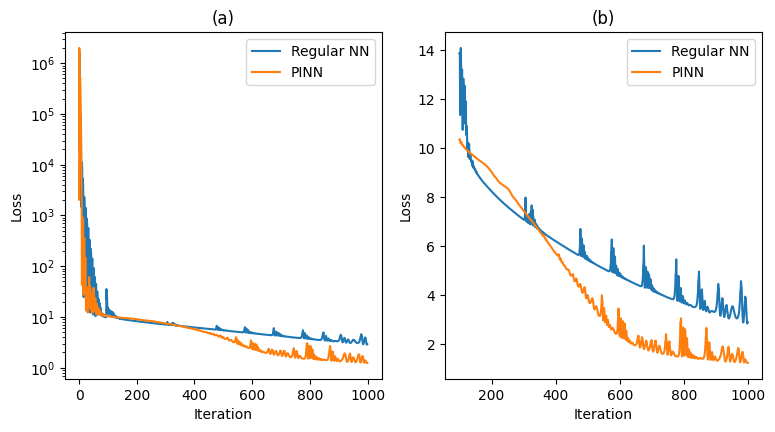

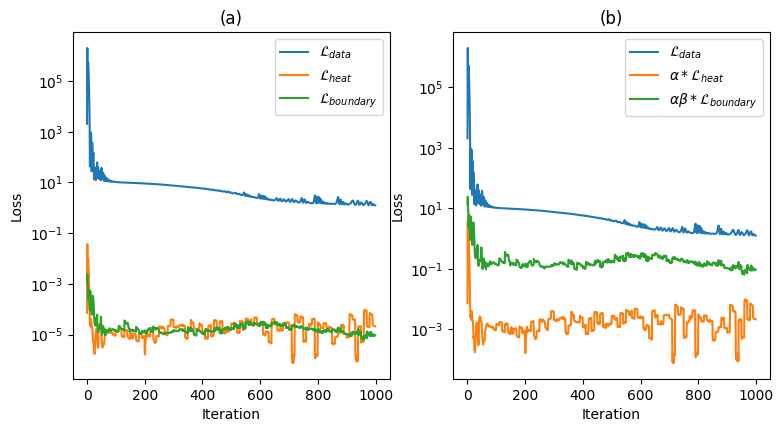

In [14]:
# plot the loss curve for both models
fig, axs = plt.subplots(1, 2, figsize=(9, 4.5))
axs[0].plot(lossesg_nn, label="Regular NN")
axs[0].plot(lossesg_pinn[:, 0], label="PINN")
axs[0].set_xlabel("Iteration")
axs[0].set_ylabel("Loss")
axs[0].set_yscale("log")
axs[0].set_title("(a)")
axs[0].legend()

axs[1].plot(range(100, NUM_ITER), lossesg_nn[100:], label="Regular NN")
axs[1].plot(range(100, NUM_ITER), lossesg_pinn[100:, 0], label="PINN")
axs[1].set_xlabel("Iteration")
axs[1].set_ylabel("Loss")
axs[1].set_title("(b)")
axs[1].legend()
plt.savefig("../Media/Plots/Losses2/lossesgrid")
plt.show()

fig, axs = plt.subplots(1, 2, figsize=(9, 4.5))
axs[0].plot(lossesg_pinn[:, 0], label="$\mathcal{L}_{data}$")
axs[0].plot(lossesg_pinn[:, 1], label="$\mathcal{L}_{heat}$")
axs[0].plot(lossesg_pinn[:, 2], label="$\mathcal{L}_{boundary}$")
axs[0].set_xlabel("Iteration")
axs[0].set_ylabel("Loss")
axs[0].set_yscale('log')
axs[0].set_title("(a)")
axs[0].legend()

axs[1].plot(lossesg_pinn[:, 0], label=r"$\mathcal{L}_{data}$")
axs[1].plot(lossesg_pinn[:, 1] * 100, label=r"$\alpha * \mathcal{L}_{heat}$")
axs[1].plot(lossesg_pinn[:, 2] * 10000, label=r"$\alpha \beta *\mathcal{L}_{boundary}$")
axs[1].set_xlabel("Iteration")
axs[1].set_ylabel("Loss")
axs[1].set_yscale('log')
axs[1].set_title("(b)")
axs[1].legend()
plt.savefig("../Media/Plots/Losses2/pinnlossesgrid")
plt.show()

In [15]:
train_input = Xg_input.to(torch.float64)
t = train_input[:, 0][:, None]
x = train_input[:, 1][:, None]
y = train_input[:, 2][:, None]
rest = train_input[:, 3:]

# get final predictions of train data
u_pred_traing_nn = u_vmapg_nn(train_input, paramsg_nn)
u_pred_traing_pinn = u_vmapg_pinn(t, x, y, rest, paramsg_pinn)
u_real_traing = Xg_output.to(torch.float64)

print("MSE traindata NN: ", nn.MSELoss()(u_pred_traing_nn, u_real_traing).item())
print("MSE traindata PINN: ", nn.MSELoss()(u_pred_traing_pinn, u_real_traing).item())
print("\n")
print("MAE traindata NN: ", nn.L1Loss()(u_pred_traing_nn, u_real_traing).item())
print("MAE traindata PINN: ", nn.L1Loss()(u_pred_traing_pinn, u_real_traing).item())

# plot the training results
fig = go.Figure()
fig.add_trace(go.Scatter(x=Xg_input.detach().numpy()[:, 0], y=u_real_traing.detach().numpy()[:, 0], name="Real"))
fig.add_trace(go.Scatter(x=Xg_input.detach().numpy()[:, 0], y=u_pred_traing_nn.detach().numpy()[:,0], name="Regular NN"))
fig.add_trace(go.Scatter(x=Xg_input.detach().numpy()[:, 0], y=u_pred_traing_pinn.detach().numpy()[:,0], name="PINN"))
fig.update_layout(
    xaxis_title="Time",
    yaxis_title="Temperature (C)",
    legend_title="Models",
    font=dict(
        family="Courier New, monospace",
        size=18,
    )
)
fig.show()

MSE traindata NN:  3.020819481898845
MSE traindata PINN:  1.2442718431971074


MAE traindata NN:  1.04784622997512
MAE traindata PINN:  0.5680641541710262


### Testing results

In [21]:
test_input = Yg_input.to(torch.float64)
t = test_input[:, 0][:, None]
x = test_input[:, 1][:, None]
y = test_input[:, 2][:, None]
rest = test_input[:, 3:]

# get final prediction of test data
u_pred_testg_nn = u_vmapg_nn(test_input, paramsg_nn)
u_pred_testg_pinn = u_vmapg_pinn(t, x, y, rest, paramsg_pinn)
u_real_testg = Yg_output.to(torch.float64)

print("MSE testdata NN: ", nn.MSELoss()(u_pred_testg_nn, u_real_testg).item())
print("MSE testdata PINN: ", nn.MSELoss()(u_pred_testg_pinn, u_real_testg).item())
print("\n")
print("MAE testdata NN: ", nn.L1Loss()(u_pred_testg_nn, u_real_testg).item())
print("MAE testdata PINN: ", nn.L1Loss()(u_pred_testg_pinn, u_real_testg).item())

# plot the test results
fig = go.Figure()
fig.add_trace(go.Scatter(x=Yg_input.detach().numpy()[:, 0], y=u_real_testg.detach().numpy()[:, 0], name="Real"))
fig.add_trace(go.Scatter(x=Yg_input.detach().numpy()[:, 0], y=u_pred_testg_nn.detach().numpy()[:,0], name="Regular NN"))
fig.add_trace(go.Scatter(x=Yg_input.detach().numpy()[:, 0], y=u_pred_testg_pinn.detach().numpy()[:,0], name="PINN"))
fig.update_layout(
    xaxis_title="Time",
    yaxis_title="Temperature (C)",
    legend_title="Models",
    font=dict(
        family="Courier New, monospace",
        size=18,
    )
)
fig.show()

MSE testdata NN:  3.6027635067362507
MSE testdata PINN:  3.183819673175446


MAE testdata NN:  1.2220848915522329
MAE testdata PINN:  1.1952664014963967


### Grid sampling for simulated testing

In [ ]:
# create grid samples for first hour
grid_samples = pd.DataFrame(columns=['t', 'x', 'y'])

# create x, y, t grid
x = np.linspace(0, X_BOUNDARY, int(X_BOUNDARY/2+1))
y = np.linspace(0, Y_BOUNDARY, 15)
t = np.linspace(0, 60, 61)

T, X, Y = np.meshgrid(t, x, y)
x = X.flatten()
y = Y.flatten()
t = T.flatten()

# add the samples to the dataframe
grid_samples['t'] = t
grid_samples['x'] = x
grid_samples['y'] = y

# merge the rest of the features
grid_samples = pd.merge(grid_samples, rest_features.drop(columns=['x', 'y']), on='t')
grid_samples_tensor = torch.tensor(grid_samples.values, dtype=torch.float64)

In [ ]:
# predict the grid temperature using PINN

t = grid_samples_tensor[:, 0][:, None]
x = grid_samples_tensor[:, 1][:, None]
y = grid_samples_tensor[:, 2][:, None]
rest = grid_samples_tensor[:, 3:]

grid_u_pred_pinn = u_vmap_pinn(t, x, y, rest, params_pinn)
u_pinn = grid_u_pred_pinn.detach().numpy()

# make copy of the grid samples
grid_samples_pinn = grid_samples.copy()

grid_samples_pinn['u'] = u_pinn

# animate the prediction on the time t and download the video
fig = px.scatter_3d(grid_samples_pinn, x='x',
                             y='y', 
                             z='u', 
                             # animation
                             animation_frame="t", 
                             # style
                             opacity=0.8,
                             color='u', 
                             color_continuous_scale='Viridis'
                             )
fig.update_layout(title="Grid Prediction using PINN", xaxis_title="x", yaxis_title="y", scene_zaxis_title="Temperature")
fig.write_html("../Plots/Animations/gridpinn.html")
fig.show()


In [ ]:
# predict the grid temperature using NN
grid_u_pred_nn = u_vmap_nn(grid_samples_tensor, params_nn)
u_nn = grid_u_pred_nn.detach().numpy()

# make copy of the grid samples
grid_samples_nn = grid_samples.copy()

grid_samples_nn['u'] = u_nn

# animate the prediction on the time t and download the video
fig = px.scatter_3d(grid_samples_nn, x='x',
                                y='y',
                                z='u',
                                # animation
                                animation_frame="t",
                                # style
                                opacity=0.8,
                                color='u',
                                color_continuous_scale='Viridis'
                                )
fig.update_layout(title="Grid prediction using NN", xaxis_title="x", yaxis_title="y", scene_zaxis_title="Temperature")
fig.write_html("../Plots/Animations/gridnn.html")
fig.show()


In [ ]:
# predict the temperature for the samples
samples_tensor = torch.tensor(samples.values, dtype=torch.float32)
u_pred = u_vmap(samples_tensor, params)
u = u_pred.detach().numpy()

# get prediction for example t 
TIME = 300
example = samples.loc[samples['t'] == TIME]
example = example[['x', 'y']]

example['u'] = u[630*TIME:630*(TIME+1)]
print(example.shape)
 
# plot the prediction for example t
fig = go.Figure()
fig.add_trace(go.Scatter3d(x=example['x'],
                            y=example['y'], 
                            z=example['u'], 
                            name="Prediction",
                            marker=dict(
                                size=12,       
                                color=example['u'],       
                                colorscale='Viridis',
                                opacity=0.8
                            )))
fig.update_layout(title=f"Prediction for t={TIME}", xaxis_title="x", yaxis_title="y", scene_zaxis_title="Temperature")
fig.show()


